# Rat 11

In [1]:
## Initialzing and loading required libraries and subfunctions
import numpy as np
import matplotlib.pyplot as plt
import copy
import yasa
from mne.filter import resample
import pynapple as nap
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import normalize
import requests
from io import BytesIO
import sails
import re
from scipy.stats import entropy

import scipy
from scipy import signal
from scipy.interpolate import griddata
from scipy.signal import correlate
from scipy.stats import pearsonr
from scipy.fft import fft
from scipy.spatial.distance import euclidean
from scipy.signal import spectrogram
from scipy.io import loadmat
import scipy.fft
import scipy.stats
import scipy.io as sio
from scipy.signal import hilbert

import emd as emd
import emd.sift as sift
import emd.spectra as spectra

from neurodsp.sim import sim_combined
from neurodsp.plts import plot_time_series, plot_timefrequency
from neurodsp.utils import create_times
from neurodsp.timefrequency.wavelets import compute_wavelet_transform
from neurodsp.filt import filter_signal

# Load required libraries
import numpy as np
from scipy.io import loadmat
from scipy.signal import hilbert
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import seaborn as sns
from neurodsp.filt import filter_signal, filter_signal_fir, design_fir_filter
import emd
import pandas as pd
from sklearn.preprocessing import Normalizer
from tqdm import tqdm
import plotly.express as px
import copy
import umap.umap_ as umap
import skdim
from scipy.spatial import cKDTree
import pickle
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
from matplotlib.cm import ScalarMappable

## UTILS
from utils import *
from detect_pt import *

from scipy.io import loadmat
import numpy as np
from neurodsp.filt import filter_signal
import copy
import emd
from scipy.spatial import cKDTree
from tqdm import tqdm

sns.set(style='white', context='notebook')

In [2]:
config = emd.sift.SiftConfig.from_yaml_file('/Users/amir/Desktop/for Abdel/emd_masksift_CA1_config_2500.yml')

In [3]:
def extract_pt_intervals(lfpHPC, hypno, fs=2500):
    targetFs = 500
    n_down = fs / targetFs
    start, end = get_start_end(hypno=hypno, sleep_state_id=5)
    rem_interval = nap.IntervalSet(start=start, end=end)
    fs = int(n_down * targetFs)
    t = np.arange(0, len(lfpHPC) / fs, 1 / fs)
    lfp = nap.TsdFrame(t=t, d=lfpHPC, columns=['HPC'])

    # Detect phasic intervals
    lfpHPC_down = preprocess(lfpHPC, n_down)
    phREM = detect_phasic(lfpHPC_down, hypno, targetFs)

    # Create phasic REM IntervalSet
    start, end = [], []
    for rem_idx in phREM:
        for s, e in phREM[rem_idx]:
            start.append(s / targetFs)
            end.append(e / targetFs)
    phasic_interval = nap.IntervalSet(start, end)

    # Calculate tonic intervals
    tonic_interval = rem_interval.set_diff(phasic_interval)
    print(f'Number of detected Tonic intrevals:{len(tonic_interval)}')
    # Apply a 100 ms duration threshold to tonic intervals
    min_duration = 0.1  # 100 ms in seconds
    durations = tonic_interval['end'] - tonic_interval['start']
    valid_intervals = durations >= min_duration
    tonic_interval = nap.IntervalSet(tonic_interval['start'][valid_intervals], tonic_interval['end'][valid_intervals])
    print(f'Number of detected Tonic intrevals after threshold:{len(tonic_interval)}')
    return phasic_interval, tonic_interval, lfp

In [4]:
def get_cycle_data(imf5, fs=2500):
    cycle_data = {"fs": None, 'theta_imf': None,
                       "IP": None, "IF": None, "IP": None, "cycles": None}


    # Get cycles using IP
    IP, IF, IA = emd.spectra.frequency_transform(imf5, fs, 'hilbert')
    C = emd.cycles.Cycles(IP)
    cycles = get_cycles_with_metrics(C, imf5, IA, IF)

    cycle_data['fs'] = fs
    cycle_data['theta_imf'] = imf5
    cycle_data['IP'] = IP
    cycle_data['IF'] = IF
    cycle_data['IA'] = IA
    cycle_data['cycles'] = cycles
    return cycle_data

In [5]:
def extract_imfs_by_pt_intervals(lfp, fs, interval, config, return_imfs_freqs=False):

    all_imfs = []
    all_imf_freqs = []
    rem_lfp = []
    all_masked_freqs = []
    for ii in range(len(interval)):
        start_idx = int(interval.loc[ii, 'start'] * fs)
        end_idx = int(interval.loc[ii, 'end'] * fs)
        sig_part = lfp[start_idx:end_idx]
        sig = np.array(sig_part)

        rem_lfp.append(sig)

        try:
            imf, mask_freq = sift.mask_sift(sig, **config)
        except Exception as e:
            print(f"EMD Sift failed: {e}. Skipping this interval.")
            continue
        all_imfs.append(imf)
        all_masked_freqs.append(mask_freq)

        imf_frequencies = imf_freq(imf, fs)
        all_imf_freqs.append(imf_frequencies)

    if return_imfs_freqs:
        return all_imfs, all_imf_freqs, rem_lfp
    else:
        return all_imfs

In [6]:
def extract_cycle_info(imfs, imf_frequencies):

  all_FPPs = []
  all_cycles_se =[]
  all_cycles_ctrl = []

  theta_range = [5, 12]
  frequencies = np.arange(15, 141, 1)
  angles=np.linspace(-180,180,19)
  fs = 2500

  for idx, imf in enumerate(imfs):
    cycle_data = get_cycle_data(imf[:, 5], fs=2500)

    amp_thresh = np.percentile(cycle_data['IA'], 25) # higher than 25th percentile of the data
    lo_freq_duration = fs/5  # restrict the analysis to 5-12 Hz
    hi_freq_duration = fs/12

    conditions = ['is_good==1',
                        f'duration_samples<{lo_freq_duration}',
                        f'duration_samples>{hi_freq_duration}',
                        f'max_amp>{amp_thresh}']

    all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)

    subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
    subset_indices = subset_cycles_df['index'].values

    ctrl = emd.cycles.get_control_points(imf[:, 5], cycle_data['cycles'], mode='augmented')
    cycle_ctrls = get_cycle_ctrl(ctrl, subset_indices)
    all_cycles_ctrl.append(cycle_ctrls)
    all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
    cycles_inds = arrange_cycle_inds(all_cycles_inds)

    all_cycles_se.append(all_cycles_inds)

    freqs = imf_frequencies[idx]
    sub_theta, theta, supra_theta = tg_split(freqs, theta_range)
    supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

    # # Corrected Wavelet Transform Computation
    raw_data=sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5,ret_mode='power', normalise=None)
    supraPlot = scipy.stats.zscore(raw_data, axis=1)
    FPP = bin_tf_to_fpp(cycles_inds, supraPlot, bin_count=19)
    all_FPPs.append(FPP)

  return all_cycles_ctrl, all_cycles_se, all_FPPs

In [7]:
from structure_index import compute_structure_index, draw_graph

In [10]:
# Rotation and Translation of dataset to align it to another dataset (template) based on a feature
# Arguments:
# data = Dataset of size N to be aligned
# feature = an array of size N representing alignment feature
# template_data = Dataset to which (data) will be aligned
# template_feature = an array representing alignment feature of the template data
def align_point_cloud(data, feature,
                      template_data,
                      template_feature,
                      n_bins=15,
                      n_neighbors=15,
                      dims=None,
                      distance_metric='euclidean',
                      discrete_label=False,
                      num_shuffles=10,
                      verbose=False):
    params = {
        'n_bins': n_bins,
        'n_neighbors': n_neighbors,
        'dims': dims,
        'distance_metric': distance_metric,
        'discrete_label': discrete_label,
        'num_shuffles': num_shuffles,
        'verbose': verbose,
    }

    # Get bins from the data
    SI, binLabel, overlapMat, sSI = compute_structure_index(data, np.array(feature), **params)
    SI_temp, binLabel_temp, overlapMat_temp, sSI_temp = compute_structure_index(template_data, np.array(template_feature), **params)

    # Get centroids of bins (p and p'); these are the points that will be aligned
    p = []
    for i in range(params['n_bins']):
        p.append(np.mean(data[binLabel[0] == i], axis=0))
    p = np.array(p)
    
    p_temp = []
    for i in range(params['n_bins']):
        p_temp.append(np.mean(template_data[binLabel_temp[0] == i], axis=0))
    p_temp = np.array(p_temp)

    # q = p - mean(p)
    # Get deviations of points from their means (q and q'); the Qs are used to get the scatter matrix H
    p_mean = np.mean(p, axis=0)
    p_temp_mean = np.mean(p_temp, axis=0)
    q = p - p_mean
    q_temp = p_temp - p_temp_mean

    # Get Rotation matrix
    H = np.dot(q_temp.T, q)
    U, S, Vh = np.linalg.svd(H, full_matrices=True)
    R = np.dot(U, Vh)
    if np.linalg.det(R) < 0:
        Vh[Vh.shape[0]-1, :] = Vh[Vh.shape[0]-1, :] * (-1)
        R = np.dot(U, Vh)

    T = p_temp_mean - np.dot(p_mean, R)
    new_data = np.dot(data, R) + T
    return new_data

In [ ]:
# version 1

def prepare_data_for_umap(imfs, imf_frequencies):

  waveforms = pd.DataFrame()
  all_trials = pd.DataFrame()
  all_FPPs = []

  theta_range = [5, 12]
  frequencies = np.arange(15, 141, 1)
  angles=np.linspace(-180,180,19)
  fs = 2500

  for idx, imf in enumerate(imfs):
    cycle_data = get_cycle_data(imf[:, 5], fs=2500)

    amp_thresh = np.percentile(cycle_data['IA'], 25) # higher than 25th percentile of the data
    lo_freq_duration = fs/5  # restrict the analysis to 5-12 Hz
    hi_freq_duration = fs/12

    conditions = ['is_good==1',
                        f'duration_samples<{lo_freq_duration}',
                        f'duration_samples>{hi_freq_duration}',
                        f'max_amp>{amp_thresh}']
    print(len(cycle_data['theta_imf']))
    all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)
    
    # Check if any cycles satisfy the conditions
    if all_cycles is None or all_cycles.chain_vect.size == 0:
        print("No cycles satisfy the conditions.")
        return pd.DataFrame(), pd.DataFrame(), []
    
    subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
    subset_indices = subset_cycles_df['index'].values

    all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
    cycles_inds = arrange_cycle_inds(all_cycles_inds)

    freqs = imf_frequencies[idx]
    sub_theta, theta, supra_theta = tg_split(freqs, theta_range)
    supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

    # # Corrected Wavelet Transform Computation
    raw_data=sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5,ret_mode='power', normalise=None)
    supraPlot = scipy.stats.zscore(raw_data, axis=1)
    FPP = bin_tf_to_fpp(cycles_inds, supraPlot, bin_count=19)
    all_FPPs.append(FPP)

    # Compute mode frequency for each cycle
    mode_freqs, entropies = compute_mode_frequency_and_entropy(FPP, frequencies, angles)

    all_waveforms, _ = emd.cycles.phase_align(cycle_data['IP'], cycle_data['theta_imf'],
                                                            cycles=all_cycles.iterate(through='subset'), npoints=100)
    all_waveforms = pd.DataFrame(all_waveforms.T)

    waveforms = pd.concat([waveforms, all_waveforms])

    trial = all_cycles.get_metric_dataframe(subset=True)
    trial['mode_freqs'] = mode_freqs
    trial['entropy'] = entropies
    all_trials = pd.concat([all_trials, trial])

  return waveforms, all_trials, all_FPPs

In [ ]:
import os
import pandas as pd
import re

def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    # Initialize empty DataFrames for concatenation across all recordings and trials for the specified rat
    all_combined_waveforms = pd.DataFrame()
    all_combined_trials = pd.DataFrame()

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return None, None

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return None, None

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_([\w-]+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5, considering various folder name formats
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, phasic_interval, config, return_imfs_freqs=True)

                    # Prepare UMAP data for both phasic and tonic
                    phasic_waveforms, phasic_trials, _ = prepare_data_for_umap(phasic_imfs, phasic_freqs)
                    tonic_waveforms, tonic_trials, _ = prepare_data_for_umap(tonic_imfs, tonic_freqs)

                    # Add metadata columns, including cycle type labels
                    for df in [phasic_waveforms, phasic_trials]:
                        df['rat_id'] = rat_id
                        df['condition'] = condition
                        df['trial'] = trial_number
                        df['cycle_type'] = 'phasic'
                        df['SD'] = sd_number
                        df['date'] = date_part

                    for df in [tonic_waveforms, tonic_trials]:
                        df['rat_id'] = rat_id
                        df['condition'] = condition
                        df['trial'] = trial_number
                        df['cycle_type'] = 'tonic'
                        df['SD'] = sd_number
                        df['date'] = date_part

                    # Concatenate into combined DataFrames
                    all_combined_waveforms = pd.concat(
                        [all_combined_waveforms, phasic_waveforms, tonic_waveforms], ignore_index=True)
                    all_combined_trials = pd.concat(
                        [all_combined_trials, phasic_trials, tonic_trials], ignore_index=True)

            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")

    if all_combined_waveforms.empty:
        print(f"No data extracted for Rat {rat_id}.")
        return None, None

    return all_combined_waveforms, all_combined_trials

In [ ]:
default_rat_id = '11'  # Replace with the desired rat ID
default_waveforms_df, default_trials_df = extract_data_for_rat(default_rat_id)

Processing recording folder: Rat-OS-Ephys_Rat11_SD1_CON_29-10-2018
Processing trial folder: 2018-10-29_12-41-45_Post_Trial2
There was 0 in the dataset
Number of detected Tonic intrevals:7
Number of detected Tonic intrevals after threshold:7
 Checking Cycles inputs - trimming singleton from input 'IP'
5515
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
4335
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
2460
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
2460
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
3080
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking Cycles inputs - trimming singleton from input 'IP'
93120
 Checking phase_align inputs - t

In [12]:
np.count_nonzero(default_waveforms_df['cycle_type'] == 'phasic')

2899

In [13]:
default_combined_waveforms = default_waveforms_df.drop(columns=['rat_id', 'condition', 'trial', 'cycle_type', 'SD', 'date'])

In [14]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
embedding_rem = umap_embedder.fit_transform(default_combined_waveforms.to_numpy())

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [15]:
default_trials_df.columns

Index(['index', 'is_good', 'duration_samples', 'peak2trough', 'asc2desc',
       'max_amp', 'trough_values', 'peak_values', 'mean_if', 'max_if',
       'range_if', 'trough_position', 'peak_position', 'chain_ind',
       'mode_freqs', 'entropy', 'rat_id', 'condition', 'trial', 'cycle_type',
       'SD', 'date'],
      dtype='object')

In [16]:
defaul_peaks = np.array(default_trials_df['peak_values'])

In [17]:
n_bins=5
n_neighbors=15
dims=None
distance_metric='euclidean'
discrete_label=False
num_shuffles=10
verbose=True

params = {
        'n_bins': n_bins,
        'n_neighbors': n_neighbors,
        'dims': dims,
        'distance_metric': distance_metric,
        'discrete_label': discrete_label,
        'num_shuffles': num_shuffles,
        'verbose': verbose,
    }

In [18]:
SI, binLabel, overlapMat, sSI = compute_structure_index(embedding_rem, np.array(defaul_peaks), **params)

Computing bin-groups..: Done


Computing overlap:   0%|          | 0/10 [00:00<?, ?it/s]

Computing structure index..: 0.97


Computing shuffling:   0%|          | 0/10 [00:00<?, ?it/s]

Shuffling 99th percentile: 0.00


In [ ]:
binLabel

(array([3., 4., 4., ..., 2., 1., 0.]),
 array([[[164.55709624, 193.91530138, 223.27350651]],
 
        [[223.27350651, 252.63171164, 281.98991678]],
 
        [[281.98991678, 311.34812191, 340.70632705]],
 
        [[340.70632705, 370.06453218, 399.42273732]],
 
        [[399.42273732, 428.78094245, 458.13914758]]]))

In [ ]:
print(f"Structure Index (SI): {SI}")

Structure Index (SI): 0.9729461312677279


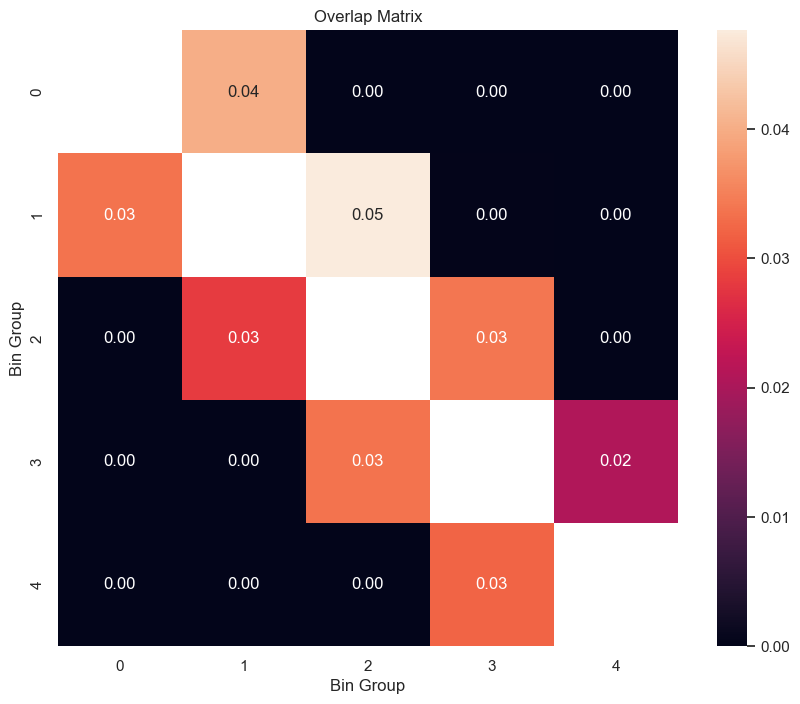

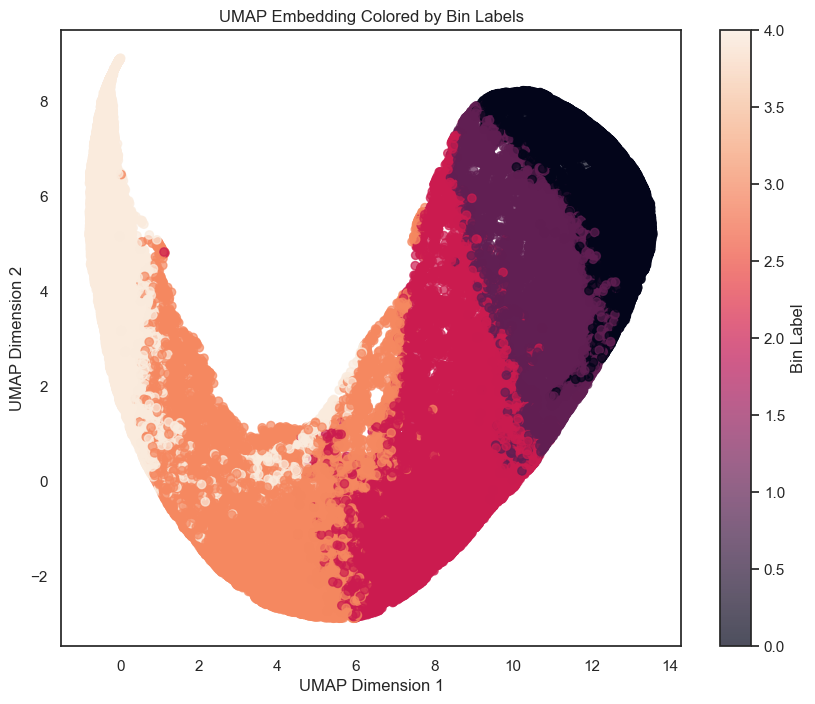

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the overlap matrix
plt.figure(figsize=(10, 8))
sns.heatmap(overlapMat, annot=True, fmt=".2f")
plt.title('Overlap Matrix')
plt.xlabel('Bin Group')
plt.ylabel('Bin Group')
plt.show()

# Plot the UMAP embedding colored by bin labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(embedding_rem[:, 0], embedding_rem[:, 1], c=binLabel[0], alpha=0.7)
plt.title('UMAP Embedding Colored by Bin Labels')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.colorbar(scatter, label='Bin Label')
plt.show()

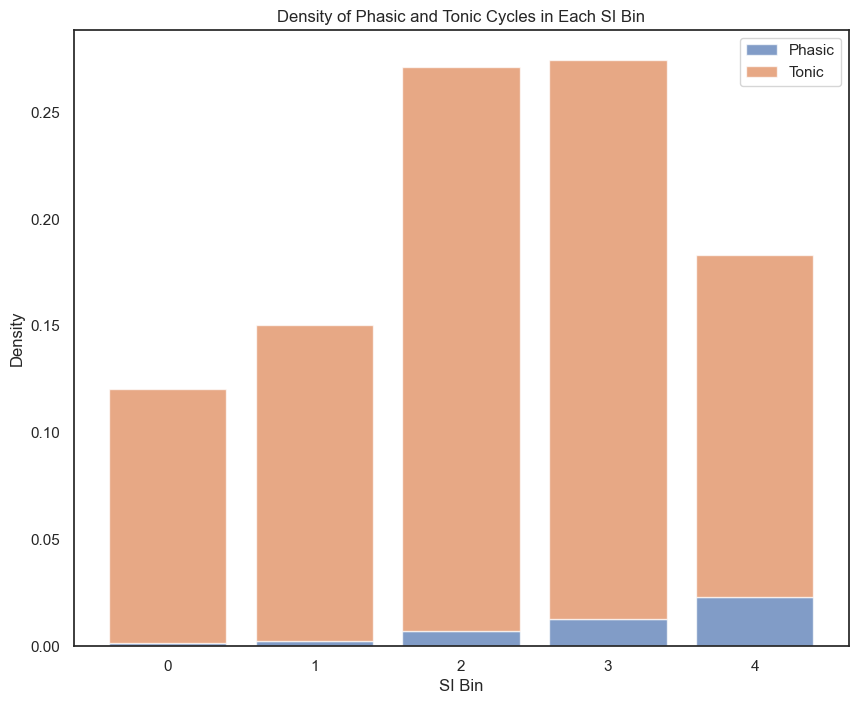

In [20]:
# Assuming 'cycle_type' column in default_trials_df indicates 'phasic' or 'tonic'
default_trials_df['bin_label'] = binLabel[0]

# Count the number of phasic and tonic cycles in each bin
phasic_counts = default_trials_df[default_trials_df['cycle_type'] == 'phasic'].groupby('bin_label').size()
tonic_counts = default_trials_df[default_trials_df['cycle_type'] == 'tonic'].groupby('bin_label').size()

# Calculate the density
total_cycles = len(default_trials_df)
phasic_density = phasic_counts / total_cycles
tonic_density = tonic_counts / total_cycles

# Fill missing bins with 0
phasic_density = phasic_density.reindex(range(n_bins), fill_value=0)
tonic_density = tonic_density.reindex(range(n_bins), fill_value=0)

# Plot the densities
plt.figure(figsize=(10, 8))
plt.bar(range(n_bins), phasic_density, alpha=0.7, label='Phasic')
plt.bar(range(n_bins), tonic_density, alpha=0.7, label='Tonic', bottom=phasic_density)
plt.xlabel('SI Bin')
plt.ylabel('Density')
plt.title('Density of Phasic and Tonic Cycles in Each SI Bin')
plt.legend()
plt.show()

In [21]:
defaul_peaks = np.array(default_trials_df['trough_values'])
target_peaks = np.array(default_trials_df['trough_values'])

Text(0.5, 1.0, 'ًRat 11')

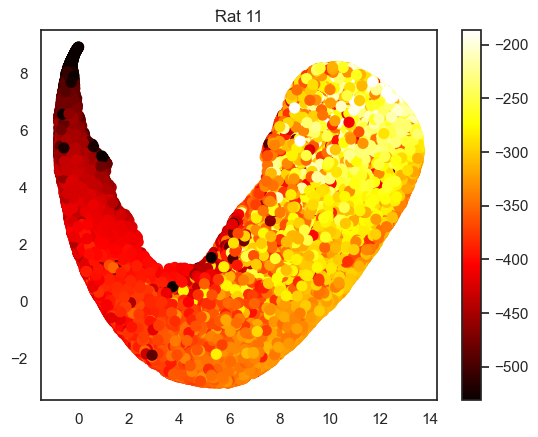

In [22]:
plt.figure()
plt.scatter(embedding_rem[:,0], embedding_rem[:,1], c=default_trials_df['trough_values'],
            vmin=np.percentile(default_trials_df['trough_values'],1),
            vmax=np.percentile(default_trials_df['trough_values'],99),
            cmap='hot', s=50)
# plt.xlim(-2.5, 12)
plt.colorbar()
plt.title('ًRat 11')

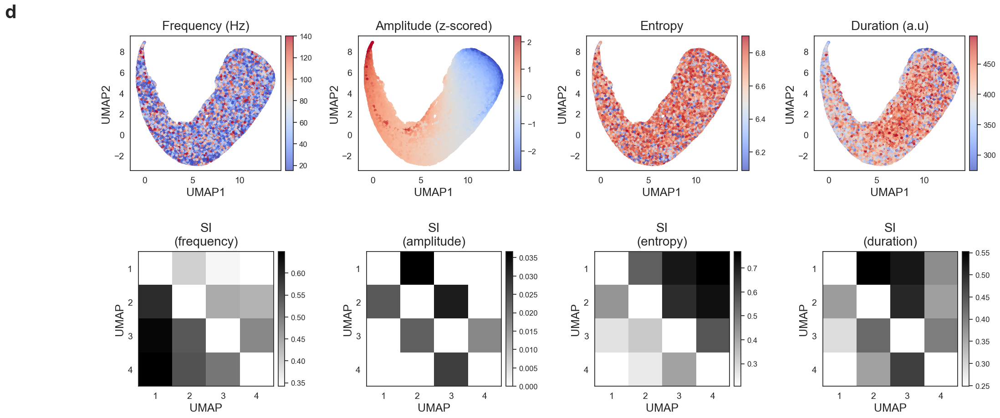

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.stats import zscore
from structure_index import compute_structure_index
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- This code assumes that the following variables are already in your environment ---
# embedding_rem: The 4D UMAP embedding array for Rat 11.
# default_trials_df: The DataFrame containing trial information for Rat 11,
#                    including 'mode_freqs', 'peak_values', 'entropy', and 'duration_samples'.
# ---

# Define the features and titles for the plots, matching the target image
features_to_plot = [
    ('mode_freqs', 'Frequency (Hz)'),
    ('peak_values', 'Amplitude (z-scored)'),
    ('entropy', 'Entropy'),
    ('duration_samples', 'Duration (a.u)')
]

# Create a 2x4 subplot grid, similar to the figure provided
fig, axes = plt.subplots(2, 4, figsize=(24, 10))
fig.subplots_adjust(hspace=0.6, wspace=0.4)


# --- Parameters for Structure Index calculation ---
# Set n_bins to 4 to match the 4x4 heatmaps in the figure
n_bins_si = 4
params_si = {
    'n_bins': n_bins_si,
    'n_neighbors': 15,          # As used in your notebook
    'distance_metric': 'euclidean',
    'discrete_label': False,
    'num_shuffles': 10,         # As used in your notebook
    'verbose': False            # To keep the output clean
}

# Loop through the features to create each column of plots
for i, (feature_col, title) in enumerate(features_to_plot):
    # --- 1. Top Row: UMAP Scatter Plots ---
    ax_scatter = axes[0, i]

    # Get the feature data from the DataFrame
    feature_data_original = default_trials_df[feature_col].to_numpy()
    
    # Use z-scored amplitude for coloring, as specified in the title
    if feature_col == 'peak_values':
        feature_data_for_plot = zscore(feature_data_original)
    else:
        feature_data_for_plot = feature_data_original
        
    # Set color limits based on percentiles to avoid outliers affecting the color scale
    vmin = np.percentile(feature_data_for_plot, 1)
    vmax = np.percentile(feature_data_for_plot, 99)
    
    # Create the scatter plot using the first two UMAP dimensions
    scatter = ax_scatter.scatter(
        embedding_rem[:, 0], 
        embedding_rem[:, 1], 
        c=feature_data_for_plot, 
        cmap='coolwarm', 
        s=10,
        vmin=vmin, 
        vmax=vmax,
        alpha=0.7
    )
    
    # Add a colorbar for the scatter plot
    divider_scatter = make_axes_locatable(ax_scatter)
    cax_scatter = divider_scatter.append_axes("right", size="5%", pad=0.1)
    cbar_scatter = fig.colorbar(scatter, cax=cax_scatter)
    cbar_scatter.ax.tick_params(labelsize=12)
    
    # Set labels and title for the scatter plot
    ax_scatter.set_title(title, fontsize=20, pad=10)
    ax_scatter.set_xlabel('UMAP1', fontsize=18)
    ax_scatter.set_ylabel('UMAP2', fontsize=18)
    ax_scatter.tick_params(axis='both', which='major', labelsize=14)

    # --- 2. Bottom Row: SI Heatmaps ---
    ax_heatmap = axes[1, i]

    # Calculate the SI and the overlap matrix using the original feature data
    # The function uses the full 4D embedding_rem for distance calculations
    _, _, overlapMat, _ = compute_structure_index(embedding_rem, feature_data_original, **params_si)
    
    # Create the heatmap of the overlap matrix
    # 'gray_r' colormap makes high values darker, like in the figure
    im = ax_heatmap.imshow(overlapMat, cmap='gray_r')

    # Add a colorbar for the heatmap
    divider_heatmap = make_axes_locatable(ax_heatmap)
    cax_heatmap = divider_heatmap.append_axes("right", size="5%", pad=0.1)
    cbar_heatmap = fig.colorbar(im, cax=cax_heatmap)
    cbar_heatmap.ax.tick_params(labelsize=12)
    
    # Set labels, title, and ticks for the heatmap
    title_text = title.split(" ")[0].lower()
    ax_heatmap.set_title(f'SI\n({title_text})', fontsize=20, pad=10)
    ax_heatmap.set_xlabel('UMAP', fontsize=18)
    ax_heatmap.set_ylabel('UMAP', fontsize=18)
    
    tick_labels = np.arange(1, n_bins_si + 1)
    ax_heatmap.set_xticks(np.arange(n_bins_si))
    ax_heatmap.set_xticklabels(tick_labels, fontsize=14)
    ax_heatmap.set_yticks(np.arange(n_bins_si))
    ax_heatmap.set_yticklabels(tick_labels, fontsize=14)

# Add the 'd' label to the top-left of the figure
fig.text(0.01, 0.95, 'd', fontsize=30, fontweight='bold', va='top', ha='left')

plt.show()

In [25]:
embedding_rem.shape

(61171, 4)

Calculating SI matrix for feature: Duration (samples)...
Calculating SI matrix for feature: Peak-to-Trough...
Calculating SI matrix for feature: Ascending-to-Descending...
Calculating SI matrix for feature: Max Amplitude...


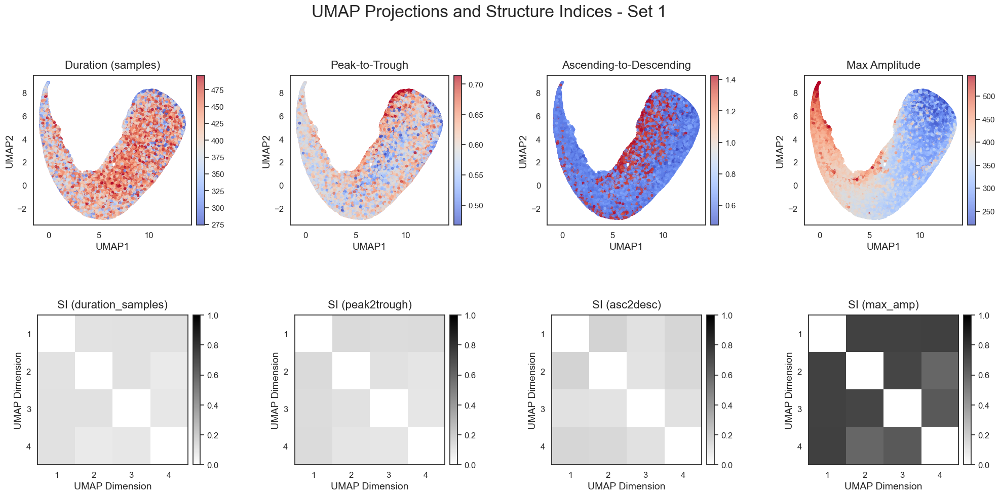

Calculating SI matrix for feature: Trough Values...
Calculating SI matrix for feature: Peak Values...
Calculating SI matrix for feature: Mean Instantaneous Freq....
Calculating SI matrix for feature: Max Instantaneous Freq....


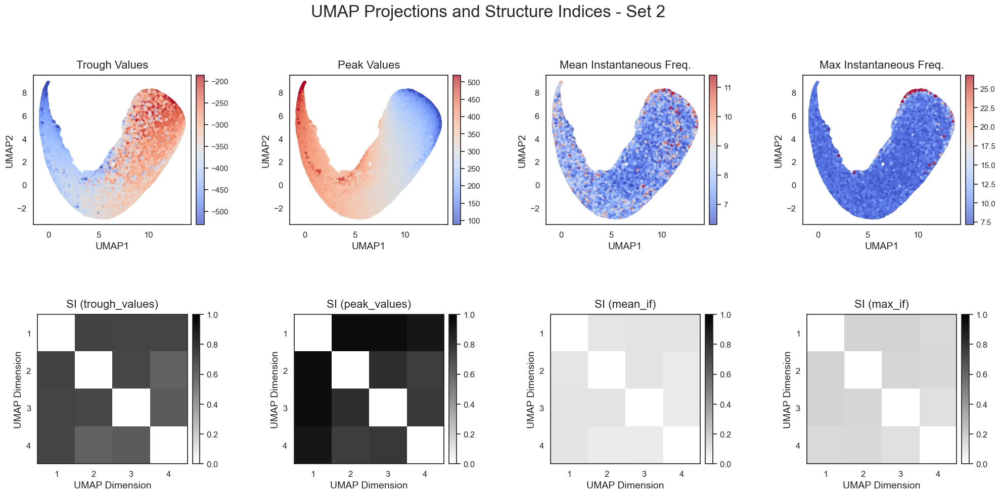

Calculating SI matrix for feature: Trough Position...
Calculating SI matrix for feature: Peak Position...
Calculating SI matrix for feature: Mode Frequency (Hz)...
Calculating SI matrix for feature: Entropy...


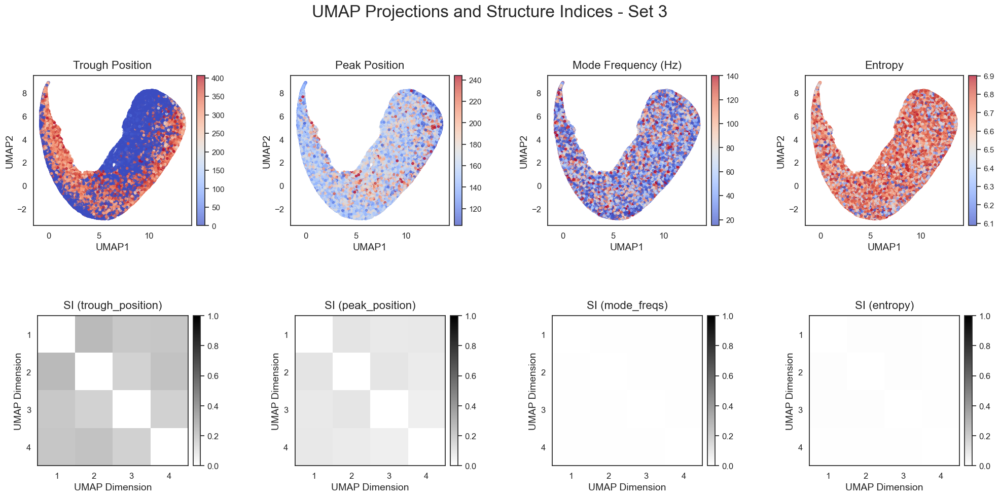

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from structure_index import compute_structure_index
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm


# Dictionary mapping feature column names to user-friendly titles
feature_title_map = {
    'duration_samples': 'Duration (samples)',
    'peak2trough': 'Peak-to-Trough',
    'asc2desc': 'Ascending-to-Descending',
    'max_amp': 'Max Amplitude',
    'trough_values': 'Trough Values',
    'peak_values': 'Peak Values',
    'mean_if': 'Mean Instantaneous Freq.',
    'max_if': 'Max Instantaneous Freq.',
    'trough_position': 'Trough Position',
    'peak_position': 'Peak Position',
    'mode_freqs': 'Mode Frequency (Hz)',
    'entropy': 'Entropy'
}

features_to_plot = list(feature_title_map.keys())

# --- Parameters for Structure Index calculation ---
n_bins_feature = 5
params_si = {
    'n_bins': n_bins_feature,
    'n_neighbors': 15,
    'distance_metric': 'euclidean',
    'discrete_label': False,
    'num_shuffles': 10,
    'verbose': False
}

# --- Function to chunk the feature list ---
def chunk_list(lst, n):
    for i in range(0, len(lst), n):
        yield lst[i:i + n]

feature_chunks = list(chunk_list(features_to_plot, 4))

# --- Loop through each chunk of features and create a separate plot ---
for chunk_idx, feature_chunk in enumerate(feature_chunks):
    num_features = len(feature_chunk)
    
    fig, axes = plt.subplots(2, num_features, figsize=(6 * num_features, 10))
    fig.suptitle(f'UMAP Projections and Structure Indices - Set {chunk_idx + 1}', fontsize=24, y=1.02)
    fig.subplots_adjust(hspace=0.6, wspace=0.5)
    
    if num_features == 1:
        axes = np.atleast_2d(axes).T

    for i, feature_col in enumerate(feature_chunk):
        ax_scatter = axes[0, i]
        ax_heatmap = axes[1, i]
        title = feature_title_map.get(feature_col, feature_col)

        # --- 1. Top Row: UMAP Scatter Plots (Unchanged) ---
        feature_data = default_trials_df[feature_col].to_numpy()
        vmin = np.percentile(feature_data, 1)
        vmax = np.percentile(feature_data, 99)
        
        scatter = ax_scatter.scatter(embedding_rem[:, 0], embedding_rem[:, 1], c=feature_data, cmap='coolwarm', s=10, vmin=vmin, vmax=vmax, alpha=0.7)
        divider_scatter = make_axes_locatable(ax_scatter)
        cax_scatter = divider_scatter.append_axes("right", size="5%", pad=0.1)
        fig.colorbar(scatter, cax=cax_scatter)
        
        ax_scatter.set_title(title, fontsize=16, pad=10)
        ax_scatter.set_xlabel('UMAP1', fontsize=14)
        ax_scatter.set_ylabel('UMAP2', fontsize=14)
        ax_scatter.tick_params(axis='both', which='major', labelsize=12)

        # --- 2. Bottom Row: SI Matrix Heatmaps with Blank Diagonal ---
        si_matrix = np.zeros((4, 4))
        
        print(f"Calculating SI matrix for feature: {title}...")
        for row_dim in range(4):
            for col_dim in range(row_dim, 4):
                if row_dim == col_dim:
                    # ** CHANGE: Set diagonal to NaN instead of calculating **
                    si_matrix[row_dim, col_dim] = np.nan
                else:
                    dims = [row_dim, col_dim]
                    umap_projection = embedding_rem[:, dims]
                    si_value, _, _, _ = compute_structure_index(umap_projection, feature_data, **params_si)
                    si_matrix[row_dim, col_dim] = si_value
                    si_matrix[col_dim, row_dim] = si_value
        
        # ** CHANGE: Get the colormap and set the color for NaN values to white **
        cmap = cm.get_cmap('gray_r').copy()
        cmap.set_bad(color='white')

        # Create the heatmap using the modified colormap
        im = ax_heatmap.imshow(si_matrix, cmap=cmap, vmin=0, vmax=1)

        # Add a colorbar for the heatmap
        divider_heatmap = make_axes_locatable(ax_heatmap)
        cax_heatmap = divider_heatmap.append_axes("right", size="5%", pad=0.1)
        cbar_heatmap = fig.colorbar(im, cax=cax_heatmap)
        cbar_heatmap.ax.tick_params(labelsize=12)
        
        # Set labels, title, and ticks
        ax_heatmap.set_title(f'SI ({feature_col})', fontsize=16, pad=10)
        ax_heatmap.set_xlabel('UMAP Dimension', fontsize=14)
        ax_heatmap.set_ylabel('UMAP Dimension', fontsize=14)
        tick_labels = np.arange(1, 5)
        ax_heatmap.set_xticks(np.arange(4))
        ax_heatmap.set_xticklabels(tick_labels, fontsize=12)
        ax_heatmap.set_yticks(np.arange(4))
        ax_heatmap.set_yticklabels(tick_labels, fontsize=12)

    plt.show()

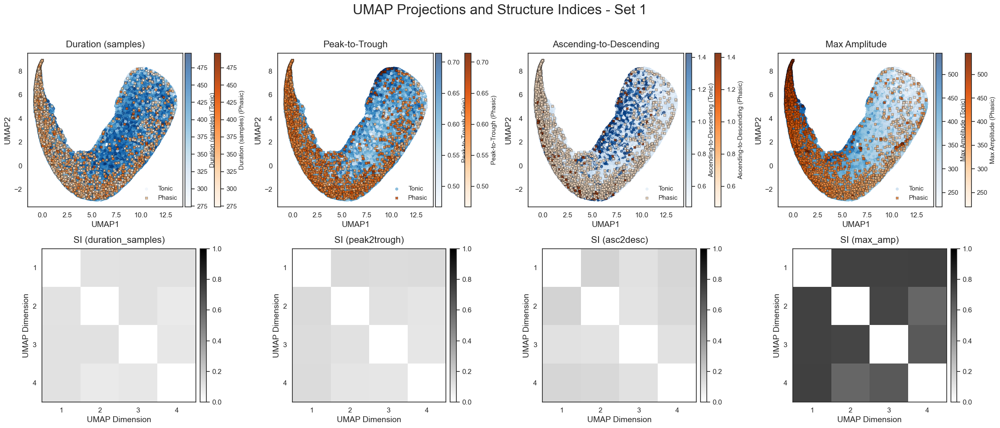

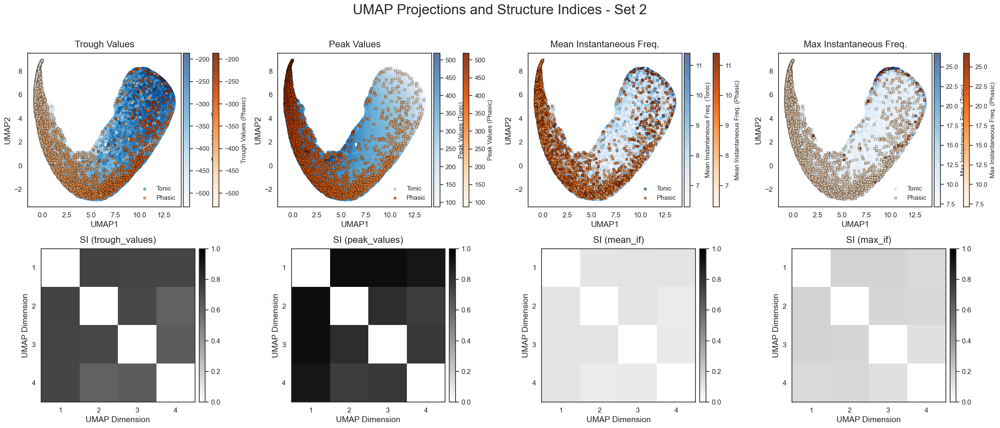

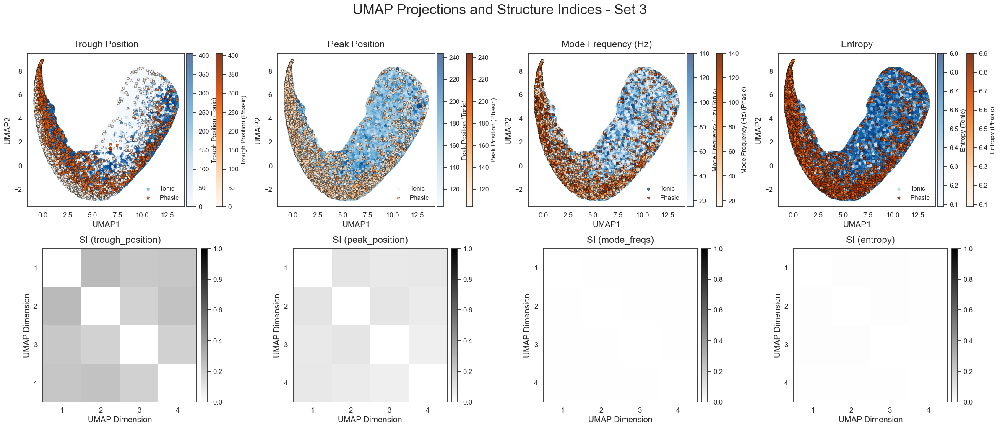

In [78]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from structure_index import compute_structure_index
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm

# Dictionary mapping feature column names to user-friendly titles
feature_title_map = {
    'duration_samples': 'Duration (samples)',
    'peak2trough': 'Peak-to-Trough',
    'asc2desc': 'Ascending-to-Descending',
    'max_amp': 'Max Amplitude',
    'trough_values': 'Trough Values',
    'peak_values': 'Peak Values',
    'mean_if': 'Mean Instantaneous Freq.',
    'max_if': 'Max Instantaneous Freq.',
    'trough_position': 'Trough Position',
    'peak_position': 'Peak Position',
    'mode_freqs': 'Mode Frequency (Hz)',
    'entropy': 'Entropy'
}

features_to_plot = list(feature_title_map.keys())

# --- Parameters for Structure Index calculation (continuous features) ---
n_bins_feature = 5
params_si = {
    'n_bins': n_bins_feature,
    'n_neighbors': 15,
    'distance_metric': 'euclidean',
    'discrete_label': False,
    'num_shuffles': 10,
    'verbose': False
}

# --- masks once (case-insensitive just in case) ---
cycle_type = default_trials_df['cycle_type'].str.lower().to_numpy()
phasic_mask = (cycle_type == 'phasic')
tonic_mask  = (cycle_type == 'tonic')

# --- For 2D plotting, use the first two UMAP dims ---
embedding_xy = embedding_rem[:, :2]
emb_phasic = embedding_xy[phasic_mask]
emb_tonic  = embedding_xy[tonic_mask]

# --- Function to chunk the feature list ---
def chunk_list(lst, n):
    for i in range(0, len(lst), n):
        yield lst[i:i + n]

feature_chunks = list(chunk_list(features_to_plot, 4))

# --- Loop through each chunk of features and create a separate plot ---
for chunk_idx, feature_chunk in enumerate(feature_chunks):
    num_features = len(feature_chunk)
    
    fig, axes = plt.subplots(2, num_features, figsize=(6 * num_features, 10))
    fig.suptitle(f'UMAP Projections and Structure Indices - Set {chunk_idx + 1}', fontsize=24, y=1.02)
    fig.subplots_adjust(hspace=0.6, wspace=0.5)
    
    if num_features == 1:
        axes = np.atleast_2d(axes).T

    for i, feature_col in enumerate(feature_chunk):
        ax_scatter = axes[0, i]
        ax_heatmap = axes[1, i]
        title = feature_title_map.get(feature_col, feature_col)

        # =======================
        # 1) TOP: UMAP (separate phasic & tonic with two colorbars)
        # =======================
        feature_all = default_trials_df[feature_col].to_numpy()
        vmin = np.nanpercentile(feature_all, 1)
        vmax = np.nanpercentile(feature_all, 99)

        feat_phasic = feature_all[phasic_mask]
        feat_tonic  = feature_all[tonic_mask]

        # Plot tonic first (underlay)
        sc_tonic = ax_scatter.scatter(
            emb_tonic[:, 0], emb_tonic[:, 1],
            c=feat_tonic, cmap='Blues', s=18, marker='o',
            vmin=vmin, vmax=vmax, alpha=0.65, label='Tonic'
        )
        # Plot phasic on top
        sc_phasic = ax_scatter.scatter(
            emb_phasic[:, 0], emb_phasic[:, 1],
            c=feat_phasic, cmap='Oranges', s=22, marker='X',
            edgecolor='black', linewidths=0.3,
            vmin=vmin, vmax=vmax, alpha=0.9, label='Phasic'
        )

        ax_scatter.set_title(title, fontsize=16, pad=10)
        ax_scatter.set_xlabel('UMAP1', fontsize=14)
        ax_scatter.set_ylabel('UMAP2', fontsize=14)
        ax_scatter.tick_params(axis='both', which='major', labelsize=12)
        ax_scatter.legend(frameon=False, fontsize=11, loc='best')

        # Two separate colorbars to the right of this axis
        divider_scatter = make_axes_locatable(ax_scatter)
        # right next to axis
        cax_tonic = divider_scatter.append_axes("right", size="4%", pad=0.05)
        cbar_tonic = fig.colorbar(sc_tonic, cax=cax_tonic)
        cbar_tonic.set_label(f'{title} (Tonic)', fontsize=11)

        # further to the right, so they don't overlap
        cax_phasic = divider_scatter.append_axes("right", size="4%", pad=0.55)
        cbar_phasic = fig.colorbar(sc_phasic, cax=cax_phasic)
        cbar_phasic.set_label(f'{title} (Phasic)', fontsize=11)

        # =======================
        # 2) BOTTOM: SI Matrix heatmaps (unchanged, uses ALL cycles)
        #    (If you want SI per-cycle-type, say the word and I’ll split these too.)
        # =======================
        si_matrix = np.zeros((4, 4))
        for row_dim in range(4):
            for col_dim in range(row_dim, 4):
                if row_dim == col_dim:
                    si_matrix[row_dim, col_dim] = np.nan  # blank diagonal
                else:
                    dims = [row_dim, col_dim]
                    umap_projection = embedding_rem[:, dims]
                    si_value, _, _, _ = compute_structure_index(umap_projection, feature_all, **params_si)
                    si_matrix[row_dim, col_dim] = si_value
                    si_matrix[col_dim, row_dim] = si_value

        cmap_gray = cm.get_cmap('gray_r').copy()
        cmap_gray.set_bad(color='white')  # NaN -> white
        im = ax_heatmap.imshow(si_matrix, cmap=cmap_gray, vmin=0, vmax=1)

        divider_heatmap = make_axes_locatable(ax_heatmap)
        cax_heatmap = divider_heatmap.append_axes("right", size="4%", pad=0.1)
        cbar_heatmap = fig.colorbar(im, cax=cax_heatmap)
        cbar_heatmap.ax.tick_params(labelsize=12)
        
        ax_heatmap.set_title(f'SI ({feature_col})', fontsize=16, pad=10)
        ax_heatmap.set_xlabel('UMAP Dimension', fontsize=14)
        ax_heatmap.set_ylabel('UMAP Dimension', fontsize=14)
        tick_labels = np.arange(1, 5)
        ax_heatmap.set_xticks(np.arange(4))
        ax_heatmap.set_xticklabels(tick_labels, fontsize=12)
        ax_heatmap.set_yticks(np.arange(4))
        ax_heatmap.set_yticklabels(tick_labels, fontsize=12)

    plt.tight_layout()
    plt.show()

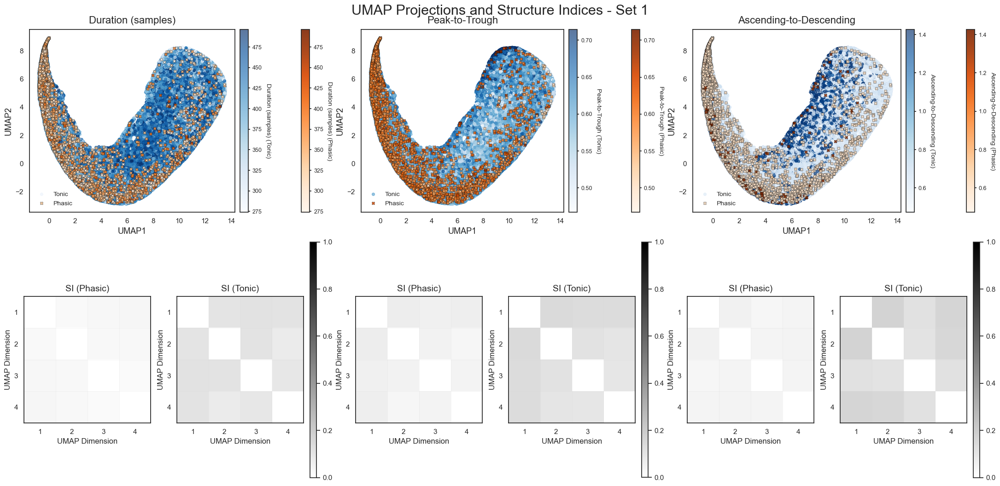

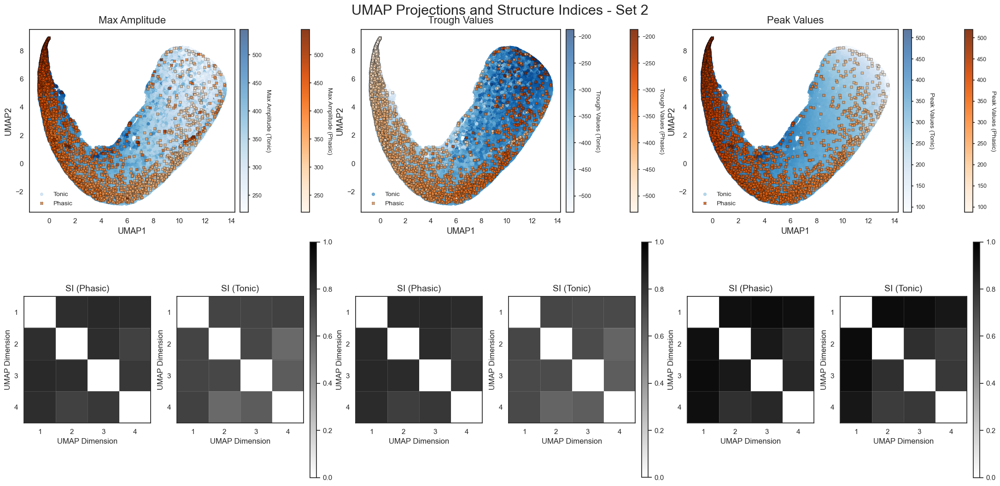

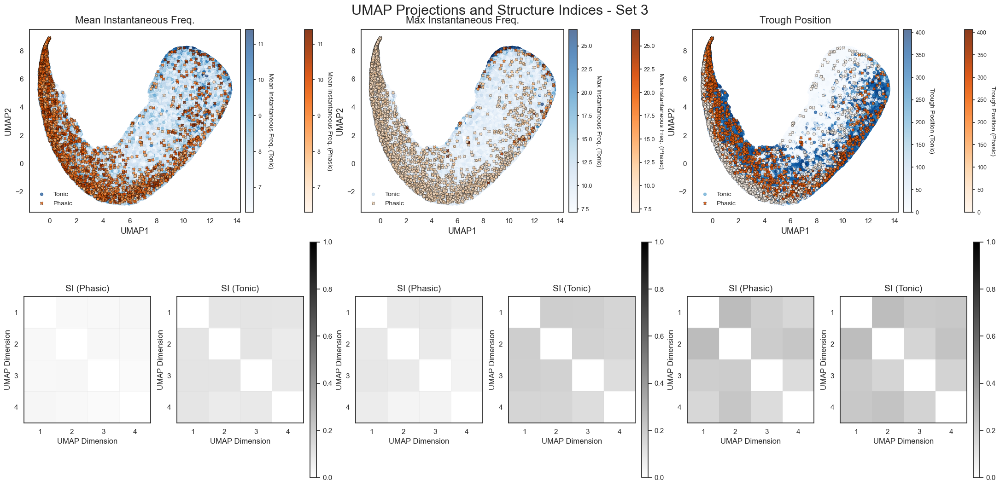

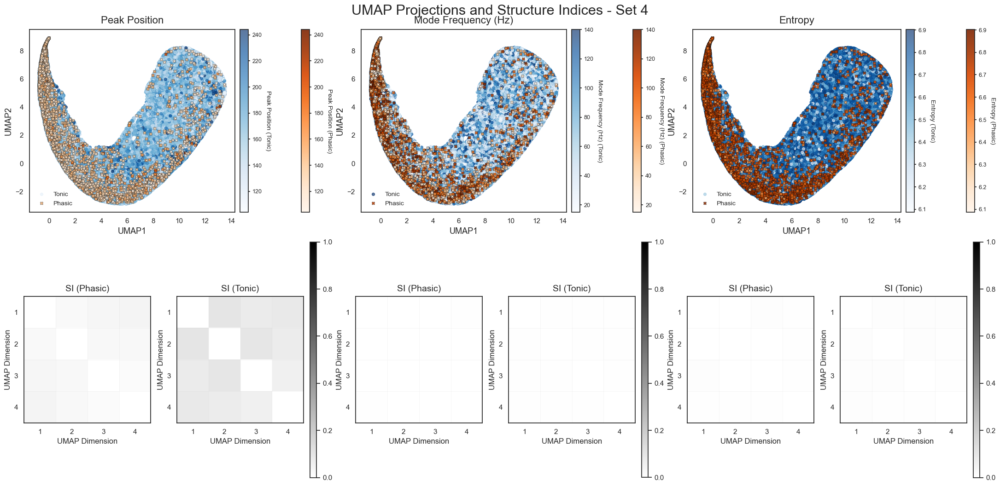

In [80]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
from structure_index import compute_structure_index

# ---------- helpers ----------
def chunk_list(lst, n):
    for i in range(0, len(lst), n):
        yield lst[i:i+n]

def si_matrix_for_mask(embedding_full, feature_full, mask, params):
    emb  = embedding_full[mask]              # (N_mask, >=4)
    feat = feature_full[mask].astype(float)
    ok   = ~np.isnan(feat)
    emb, feat = emb[ok], feat[ok]
    M = np.full((4, 4), np.nan)
    for r in range(4):
        for c in range(r+1, 4):
            si_val, _, _, _ = compute_structure_index(emb[:, [r, c]], feat, **params)
            M[r, c] = M[c, r] = si_val
    return M

# three features per row
feature_chunks = list(chunk_list(features_to_plot, 3))

# ---------- plotting ----------
for chunk_idx, feature_chunk in enumerate(feature_chunks):
    nF = len(feature_chunk)

    fig = plt.figure(figsize=(7.2 * nF, 10.2), constrained_layout=True)
    outer = fig.add_gridspec(nrows=2, ncols=nF, height_ratios=[1.0, 1.1])
    fig.suptitle(f'UMAP Projections and Structure Indices - Set {chunk_idx + 1}',
                 fontsize=22, y=1.02)

    for i, feature_col in enumerate(feature_chunk):
        title = feature_title_map.get(feature_col, feature_col)

        # ====== TOP: UMAP + 2 separated colorbars ======
        # columns: scatter | cbar_tonic | spacer | cbar_phasic
        top = outer[0, i].subgridspec(1, 4, width_ratios=[1.0, 0.04, 0.10, 0.04])

        ax_scatter = fig.add_subplot(top[0, 0])
        cax_tonic  = fig.add_subplot(top[0, 1])
        ax_gap     = fig.add_subplot(top[0, 2]); ax_gap.axis('off')
        cax_phasic = fig.add_subplot(top[0, 3])

        feature_all = default_trials_df[feature_col].to_numpy().astype(float)
        vmin = np.nanpercentile(feature_all, 1)
        vmax = np.nanpercentile(feature_all, 99)

        feat_phasic = feature_all[phasic_mask]
        feat_tonic  = feature_all[tonic_mask]

        sc_tonic = ax_scatter.scatter(
            emb_tonic[:, 0], emb_tonic[:, 1],
            c=feat_tonic, cmap='Blues', s=18, marker='o',
            vmin=vmin, vmax=vmax, alpha=0.65, label='Tonic'
        )
        sc_phasic = ax_scatter.scatter(
            emb_phasic[:, 0], emb_phasic[:, 1],
            c=feat_phasic, cmap='Oranges', s=22, marker='X',
            edgecolor='black', linewidths=0.3,
            vmin=vmin, vmax=vmax, alpha=0.9, label='Phasic'
        )

        ax_scatter.set_title(title, fontsize=16, pad=10)
        ax_scatter.set_xlabel('UMAP1', fontsize=13)
        ax_scatter.set_ylabel('UMAP2', fontsize=13)
        ax_scatter.tick_params(axis='both', labelsize=11)
        ax_scatter.legend(frameon=False, fontsize=10, loc='best')

        # tidy, separated colorbars
        for cax, sm, lab in [(cax_tonic, sc_tonic,  f'{title} (Tonic)'),
                             (cax_phasic, sc_phasic, f'{title} (Phasic)')]:
            cb = fig.colorbar(sm, cax=cax)
            cb.ax.tick_params(labelsize=9, length=3)
            cb.set_label(lab, fontsize=10, rotation=270, labelpad=14)

        # ====== BOTTOM: two SI heatmaps (shared colorbar) ======
        # columns: SI_phasic | SI_tonic | shared_cbar
        bot = outer[1, i].subgridspec(1, 3, width_ratios=[1.0, 1.0, 0.05])

        ax_si_p  = fig.add_subplot(bot[0, 0])
        ax_si_t  = fig.add_subplot(bot[0, 1])
        cax_si   = fig.add_subplot(bot[0, 2])

        si_phasic = si_matrix_for_mask(embedding_rem, feature_all, phasic_mask, params_si)
        si_tonic  = si_matrix_for_mask(embedding_rem, feature_all, tonic_mask,  params_si)

        cmap_gray = cm.get_cmap('gray_r').copy()
        cmap_gray.set_bad('white')
        norm01 = mpl.colors.Normalize(vmin=0, vmax=1)

        im_p = ax_si_p.imshow(si_phasic, cmap=cmap_gray, norm=norm01)
        im_t = ax_si_t.imshow(si_tonic,  cmap=cmap_gray, norm=norm01)

        # shared colorbar for both SI panels
        fig.colorbar(im_t, cax=cax_si)  # (im_p has same norm)

        for ax, lab in [(ax_si_p, 'SI (Phasic)'), (ax_si_t, 'SI (Tonic)')]:
            ax.set_title(lab, fontsize=14, pad=8)
            ax.set_xlabel('UMAP Dimension', fontsize=12)
            ax.set_ylabel('UMAP Dimension', fontsize=12)
            ax.set_xticks(np.arange(4)); ax.set_yticks(np.arange(4))
            ax.set_xticklabels(np.arange(1, 5), fontsize=11)
            ax.set_yticklabels(np.arange(1, 5), fontsize=11)
            # faint grid to separate cells
            ax.set_xticks(np.arange(-.5, 4, 1), minor=True)
            ax.set_yticks(np.arange(-.5, 4, 1), minor=True)
            ax.grid(which='minor', linestyle='-', linewidth=0.5, alpha=0.25)
            ax.tick_params(which='minor', bottom=False, left=False)

    plt.show()

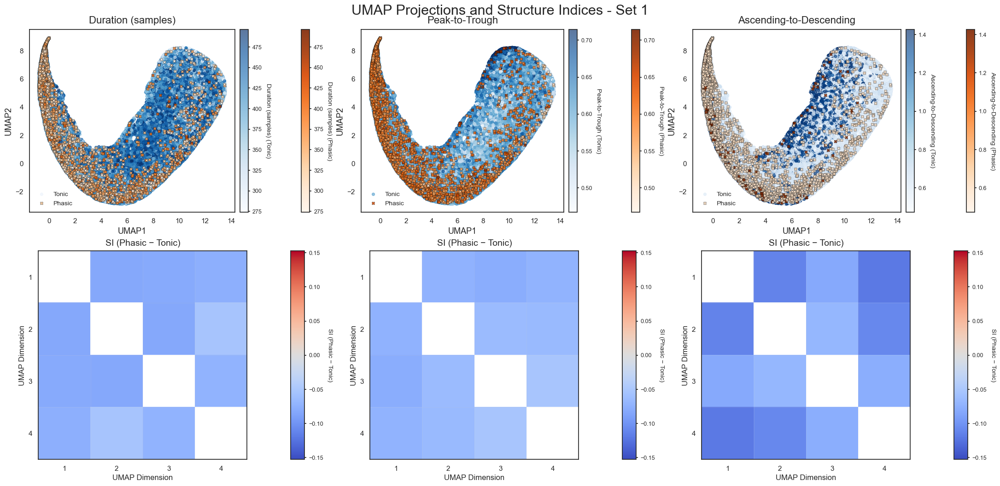

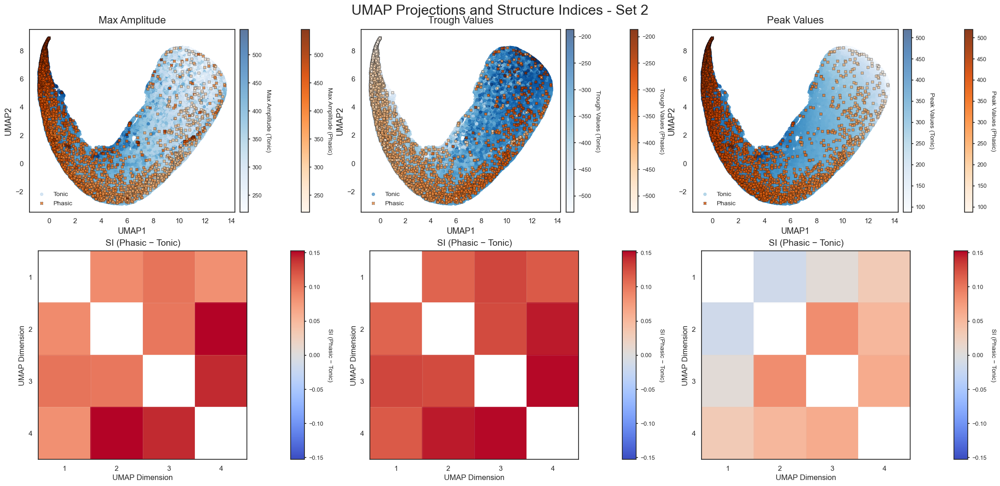

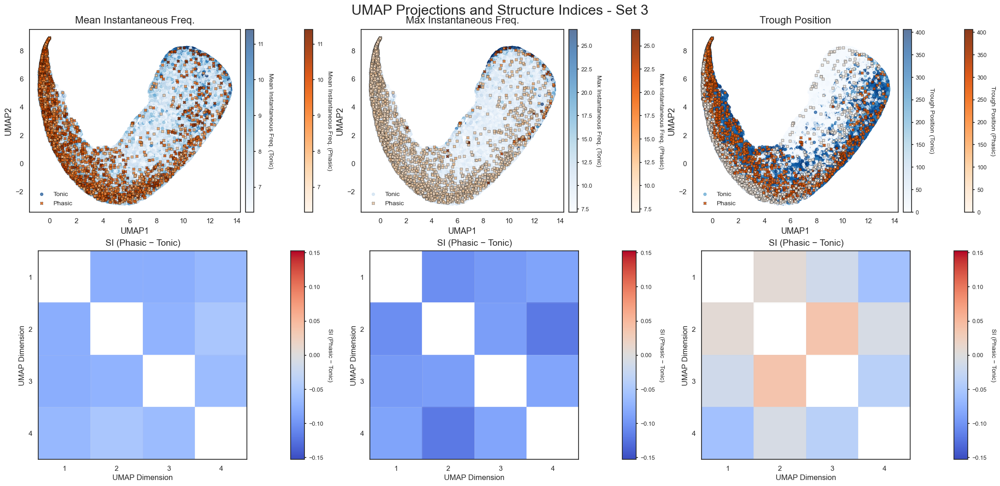

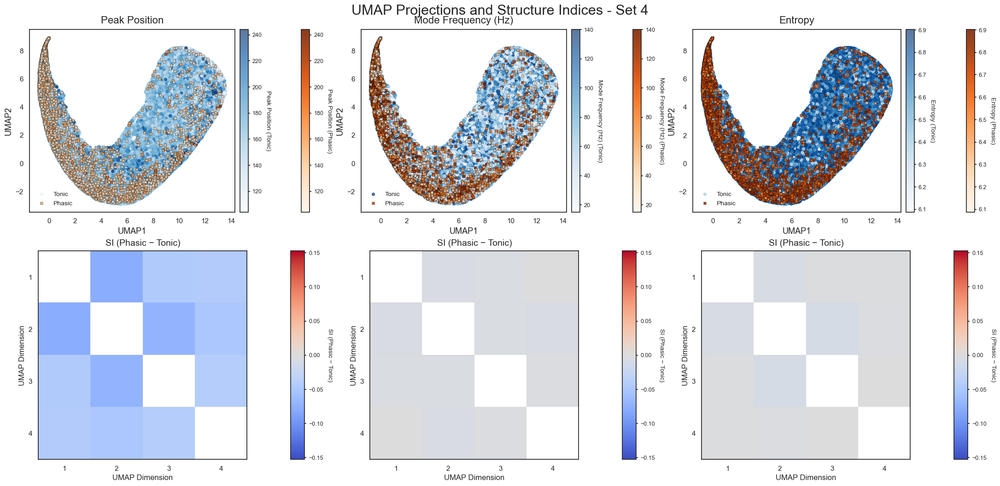

In [25]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from structure_index import compute_structure_index
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm
from matplotlib import colors as mcolors  # NEW: for TwoSlopeNorm

# Dictionary mapping feature column names to user-friendly titles
feature_title_map = {
    'duration_samples': 'Duration (samples)',
    'peak2trough': 'Peak-to-Trough',
    'asc2desc': 'Ascending-to-Descending',
    'max_amp': 'Max Amplitude',
    'trough_values': 'Trough Values',
    'peak_values': 'Peak Values',
    'mean_if': 'Mean Instantaneous Freq.',
    'max_if': 'Max Instantaneous Freq.',
    'trough_position': 'Trough Position',
    'peak_position': 'Peak Position',
    'mode_freqs': 'Mode Frequency (Hz)',
    'entropy': 'Entropy'
}

features_to_plot = list(feature_title_map.keys())

# --- Parameters for Structure Index calculation (continuous features) ---
n_bins_feature = 5
params_si = {
    'n_bins': n_bins_feature,
    'n_neighbors': 15,
    'distance_metric': 'euclidean',
    'discrete_label': False,
    'num_shuffles': 10,
    'verbose': False
}

# --- masks once (case-insensitive just in case) ---
cycle_type = default_trials_df['cycle_type'].str.lower().to_numpy()
phasic_mask = (cycle_type == 'phasic')
tonic_mask  = (cycle_type == 'tonic')

# --- For 2D plotting, use the first two UMAP dims ---
embedding_xy = embedding_rem[:, :2]
emb_phasic = embedding_xy[phasic_mask]
emb_tonic  = embedding_xy[tonic_mask]

# ---------- helpers ----------
def chunk_list(lst, n):
    for i in range(0, len(lst), n):
        yield lst[i:i+n]

def si_matrix_for_mask(embedding_full, feature_full, mask, params):
    emb  = embedding_full[mask]              # (N_mask, >=4)
    feat = feature_full[mask].astype(float)
    ok   = ~np.isnan(feat)
    emb, feat = emb[ok], feat[ok]
    M = np.full((4, 4), np.nan)
    for r in range(4):
        for c in range(r+1, 4):
            si_val, _, _, _ = compute_structure_index(emb[:, [r, c]], feat, **params)
            M[r, c] = M[c, r] = si_val
    return M

# three features per row
feature_chunks = list(chunk_list(features_to_plot, 3))

# ---------- PRECOMPUTE SI MATRICES (ONCE) ----------
# We will store the Phasic−Tonic SI difference per feature and compute a global color scale.
si_diff_by_feature = {}
abs_max_vals = []

for feature_col in features_to_plot:
    feature_all = default_trials_df[feature_col].to_numpy().astype(float)
    si_phasic = si_matrix_for_mask(embedding_rem, feature_all, phasic_mask, params_si)
    si_tonic  = si_matrix_for_mask(embedding_rem, feature_all, tonic_mask,  params_si)
    si_diff   = si_phasic - si_tonic
    si_diff_by_feature[feature_col] = si_diff
    if np.any(np.isfinite(si_diff)):
        abs_max_vals.append(np.nanmax(np.abs(si_diff)))

# Global symmetric limits for all heatmaps
if len(abs_max_vals) == 0:
    global_v = 1.0  # fallback if everything is NaN
else:
    global_v = float(np.nanmax(abs_max_vals))
    if not np.isfinite(global_v) or global_v == 0:
        global_v = 1.0  # avoid a zero-width or non-finite color range

norm_div_global = mcolors.TwoSlopeNorm(vmin=-global_v, vcenter=0.0, vmax=global_v)

# ---------- plotting ----------
for chunk_idx, feature_chunk in enumerate(feature_chunks):
    nF = len(feature_chunk)

    fig = plt.figure(figsize=(7.2 * nF, 10.2), constrained_layout=True)
    outer = fig.add_gridspec(nrows=2, ncols=nF, height_ratios=[1.0, 1.1])
    fig.suptitle(f'UMAP Projections and Structure Indices - Set {chunk_idx + 1}',
                 fontsize=22, y=1.02)

    for i, feature_col in enumerate(feature_chunk):
        title = feature_title_map.get(feature_col, feature_col)

        # ====== TOP: UMAP + 2 separated colorbars ======
        # (UNCHANGED BLOCK - EXACTLY AS YOUR ORIGINAL)
        top = outer[0, i].subgridspec(1, 4, width_ratios=[1.0, 0.04, 0.10, 0.04])

        ax_scatter = fig.add_subplot(top[0, 0])
        cax_tonic  = fig.add_subplot(top[0, 1])
        ax_gap     = fig.add_subplot(top[0, 2]); ax_gap.axis('off')
        cax_phasic = fig.add_subplot(top[0, 3])

        feature_all = default_trials_df[feature_col].to_numpy().astype(float)
        vmin = np.nanpercentile(feature_all, 1)
        vmax = np.nanpercentile(feature_all, 99)

        feat_phasic = feature_all[phasic_mask]
        feat_tonic  = feature_all[tonic_mask]

        sc_tonic = ax_scatter.scatter(
            emb_tonic[:, 0], emb_tonic[:, 1],
            c=feat_tonic, cmap='Blues', s=18, marker='o',
            vmin=vmin, vmax=vmax, alpha=0.65, label='Tonic'
        )
        sc_phasic = ax_scatter.scatter(
            emb_phasic[:, 0], emb_phasic[:, 1],
            c=feat_phasic, cmap='Oranges', s=22, marker='X',
            edgecolor='black', linewidths=0.3,
            vmin=vmin, vmax=vmax, alpha=0.9, label='Phasic'
        )

        ax_scatter.set_title(title, fontsize=16, pad=10)
        ax_scatter.set_xlabel('UMAP1', fontsize=13)
        ax_scatter.set_ylabel('UMAP2', fontsize=13)
        ax_scatter.tick_params(axis='both', labelsize=11)
        ax_scatter.legend(frameon=False, fontsize=10, loc='best')

        # tidy, separated colorbars
        for cax, sm, lab in [(cax_tonic, sc_tonic,  f'{title} (Tonic)'),
                             (cax_phasic, sc_phasic, f'{title} (Phasic)')]:
            cb = fig.colorbar(sm, cax=cax)
            cb.ax.tick_params(labelsize=9, length=3)
            cb.set_label(lab, fontsize=10, rotation=270, labelpad=14)

        # ====== BOTTOM: SI (Phasic - Tonic) difference heatmap with GLOBAL scaling ======
        # columns: SI_diff | shared_cbar
        bot = outer[1, i].subgridspec(1, 2, width_ratios=[1.0, 0.05])

        ax_si_diff = fig.add_subplot(bot[0, 0])
        cax_si     = fig.add_subplot(bot[0, 1])

        si_diff = si_diff_by_feature[feature_col]

        im_diff = ax_si_diff.imshow(si_diff, cmap='coolwarm', norm=norm_div_global)

        # Colorbar (identical scaling for all features)
        cb = fig.colorbar(im_diff, cax=cax_si)
        cb.ax.tick_params(labelsize=9, length=3)
        cb.set_label('SI (Phasic − Tonic)', fontsize=10, rotation=270, labelpad=14)

        # Axes cosmetics
        ax_si_diff.set_title('SI (Phasic − Tonic)', fontsize=14, pad=8)
        ax_si_diff.set_xlabel('UMAP Dimension', fontsize=12)
        ax_si_diff.set_ylabel('UMAP Dimension', fontsize=12)
        ax_si_diff.set_xticks(np.arange(4)); ax_si_diff.set_yticks(np.arange(4))
        ax_si_diff.set_xticklabels(np.arange(1, 5), fontsize=11)
        ax_si_diff.set_yticklabels(np.arange(1, 5), fontsize=11)

        # faint grid to separate cells
        ax_si_diff.set_xticks(np.arange(-.5, 4, 1), minor=True)
        ax_si_diff.set_yticks(np.arange(-.5, 4, 1), minor=True)
        ax_si_diff.grid(which='minor', linestyle='-', linewidth=0.5, alpha=0.25)
        ax_si_diff.tick_params(which='minor', bottom=False, left=False)

    plt.show()

## project components

In [11]:
import os
import pandas as pd
import re

def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    # Initialize empty DataFrames for concatenation across all recordings and trials for the specified rat
    all_combined_waveforms = pd.DataFrame()
    all_combined_trials = pd.DataFrame()
    all_phasic_fpps = []
    all_tonic_fpps = []

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return None, None

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return None, None

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_([\w-]+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5, considering various folder name formats
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, phasic_interval, config, return_imfs_freqs=True)

                    # Prepare UMAP data for both phasic and tonic
                    phasic_waveforms, phasic_trials, phasic_fpps = prepare_data_for_umap(phasic_imfs, phasic_freqs)
                    tonic_waveforms, tonic_trials, tonic_fpps = prepare_data_for_umap(tonic_imfs, tonic_freqs)

                    # Add metadata columns, including cycle type labels
                    for df in [phasic_waveforms, phasic_trials]:
                        df['rat_id'] = rat_id
                        df['condition'] = condition
                        df['trial'] = trial_number
                        df['cycle_type'] = 'phasic'
                        df['SD'] = sd_number
                        df['date'] = date_part

                    for df in [tonic_waveforms, tonic_trials]:
                        df['rat_id'] = rat_id
                        df['condition'] = condition
                        df['trial'] = trial_number
                        df['cycle_type'] = 'tonic'
                        df['SD'] = sd_number
                        df['date'] = date_part

                    # Concatenate into combined DataFrames
                    all_combined_waveforms = pd.concat(
                        [all_combined_waveforms, phasic_waveforms, tonic_waveforms], ignore_index=True)
                    all_combined_trials = pd.concat(
                        [all_combined_trials, phasic_trials, tonic_trials], ignore_index=True)
                    all_phasic_fpps.extend(phasic_fpps)
                    all_tonic_fpps.extend(tonic_fpps)


            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")

    if all_combined_waveforms.empty:
        print(f"No data extracted for Rat {rat_id}.")
        return None, None

    return all_combined_waveforms, all_combined_trials, all_phasic_fpps, all_tonic_fpps

In [12]:
rat_id = '11'  
waveforms_df, trials_df, all_phasic_FPPs, all_tonic_FPPs = extract_data_for_rat(rat_id)

Processing recording folder: Rat-OS-Ephys_Rat11_SD1_CON_29-10-2018
Processing trial folder: 2018-10-29_12-41-45_Post_Trial2
There was 0 in the dataset
Number of detected Tonic intrevals:7
Number of detected Tonic intrevals after threshold:7


KeyboardInterrupt: 

In [87]:
phasic_fpps = np.empty(1, dtype=object)
phasic_fpps[0] = all_phasic_FPPs
print(phasic_fpps.shape)  # (1,)

tonic_fpps = np.empty(1, dtype=object)
tonic_fpps[0] = all_tonic_FPPs
print(tonic_fpps.shape)  # (1,)

(1,)
(1,)


In [88]:
import numpy as np
import matplotlib.pyplot as plt
import os
from collections import Counter

# --- 1. Define Constants & Load Your Data ---
# These parameters must match what you used in your data generation pipeline
frequencies = np.arange(15, 141, 1)
angles = np.linspace(-180, 180, 19)

# --- UNCOMMENT YOUR LOADING CODE HERE ---
# save_folder = "Os_Basic_Dataset_FPPs"
# phasic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_phasic_fpps.npy")
# tonic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_tonic_fpps.npy")

# print("Loading the saved arrays...")
# phasic_fpps = np.load(phasic_filename, allow_pickle=True)
# tonic_fpps = np.load(tonic_filename, allow_pickle=True)
# print("Successfully loaded arrays.")
# ----------------------------------------

# --- 2. Data Flattening Function (Handles the 3D Array Structure) ---
def flatten_fpp_data_final(fpps_by_rat):
    """
    Correctly flattens the Array[List[3D Array]] structure into a single
    flat list of 2D FPP arrays.
    """
    all_2d_fpps = []
    # Level 1: Iterate over each rat
    for rat_data_list in fpps_by_rat:
        if not isinstance(rat_data_list, list):
            continue
        # Level 2: Iterate over each interval's 3D array
        for interval_3d_array in rat_data_list:
            # Check if it's a 3D numpy array with at least one cycle
            if isinstance(interval_3d_array, np.ndarray) and interval_3d_array.ndim == 3 and interval_3d_array.shape[0] > 0:
                # Level 3: Iterate through each cycle (the first dimension)
                # and append the 2D FPP to our master list.
                for i in range(interval_3d_array.shape[0]):
                    all_2d_fpps.append(interval_3d_array[i, :, :])
    return all_2d_fpps

print("--- Flattening Data ---")
flattened_phasic = flatten_fpp_data_final(phasic_fpps)
flattened_tonic = flatten_fpp_data_final(tonic_fpps)

print(f"Total number of Phasic FPPs found: {len(flattened_phasic)}")
print(f"Total number of Tonic FPPs found: {len(flattened_tonic)}")
print("-" * 20)

--- Flattening Data ---
Total number of Phasic FPPs found: 2899
Total number of Tonic FPPs found: 58272
--------------------


In [89]:
# --- 3. Data Processing Function ---
def process_fpps_for_plotting(fpp_list, description=""):
    """
    Takes a flat list of 2D FPPs, filters them for consistent shapes,
    and computes the necessary averages for plotting.
    Returns a dictionary with processed data, or None if no valid data.
    """
    if not fpp_list:
        print(f"No FPPs to process for {description}.")
        return None

    # Filter for arrays with the most common, valid shape to avoid errors
    shape_counts = Counter(arr.shape for arr in fpp_list if isinstance(arr, np.ndarray))
    if not shape_counts:
        print(f"No valid NumPy arrays found for {description}.")
        return None
        
    most_common_shape = shape_counts.most_common(1)[0][0]
    valid_fpps = [arr for arr in fpp_list if hasattr(arr, 'shape') and arr.shape == most_common_shape]
    
    print(f"Processing '{description}':")
    print(f"  - Found {len(valid_fpps)} valid FPPs with shape {most_common_shape}.")
    if len(valid_fpps) < len(fpp_list):
        print(f"  - Ignored {len(fpp_list) - len(valid_fpps)} entries with inconsistent shapes or types.")
    
    if not valid_fpps:
        return None

    # Stack the valid FPPs into a single 3D array
    stacked_fpps = np.stack(valid_fpps, axis=0)

    # --- Calculations for Plots ---
    # 1. For the averaged spectrogram
    avg_fpp = np.mean(stacked_fpps, axis=0)

    # 2. For the spectral signature
    all_signatures = np.mean(stacked_fpps, axis=2) # Average over phase angles
    mean_signature = np.mean(all_signatures, axis=0)
    std_signature = np.std(all_signatures, axis=0)

    # Return all processed data in a dictionary
    return {
        'avg_fpp': avg_fpp,
        'mean_signature': mean_signature,
        'std_signature': std_signature,
        'n_valid': len(valid_fpps),
        'shape': most_common_shape
    }

print("\n--- Processing Flattened Data ---")
phasic_processed = process_fpps_for_plotting(flattened_phasic, "Phasic REM")
tonic_processed = process_fpps_for_plotting(flattened_tonic, "Tonic REM")
print("-" * 20)



--- Processing Flattened Data ---
Processing 'Phasic REM':
  - Found 2899 valid FPPs with shape (126, 19).
Processing 'Tonic REM':
  - Found 58272 valid FPPs with shape (126, 19).
--------------------


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import os
from collections import defaultdict, Counter
from sklearn.decomposition import PCA, FastICA

# New imports for interactive plotting
import plotly.graph_objects as go
import networkx as nx

# ===================================================================
# ---              UNCHANGED FUNCTIONS (Parts 1-3)                ---
# ===================================================================
def extract_sss_by_episode(fpps_by_rat):
    episodes_sss_list = []
    for rat_data_list in fpps_by_rat:
        if not isinstance(rat_data_list, list):
            continue
        for interval_3d_array in rat_data_list:
            if isinstance(interval_3d_array, np.ndarray) and interval_3d_array.ndim == 3 and interval_3d_array.shape[0] >= 1:
                current_episode_sss = []
                for i in range(interval_3d_array.shape[0]):
                    fpp_2d = interval_3d_array[i, :, :]
                    fpp_abs = np.abs(fpp_2d)
                    norm_sum = np.sum(fpp_abs)
                    normalized_fpp = fpp_abs / norm_sum if norm_sum > 1e-9 else fpp_abs
                    signature_1d = np.sum(normalized_fpp, axis=1)
                    signature_smoothed = np.convolve(signature_1d, np.ones(5)/5, mode='same')
                    sig_min, sig_max = np.min(signature_smoothed), np.max(signature_smoothed)
                    if (sig_max - sig_min) > 1e-9:
                        signature_final = (signature_smoothed - sig_min) / (sig_max - sig_min)
                    else:
                        signature_final = np.zeros_like(signature_smoothed)
                    current_episode_sss.append(signature_final)
                episodes_sss_list.append(np.array(current_episode_sss))
    return episodes_sss_list

def train_global_ica_model(all_sss_data, n_components):
    print(f"Training global PCA/ICA model with {n_components} components...")
    if all_sss_data.shape[0] < n_components: return None, None
    pca = PCA(n_components=n_components, random_state=42)
    ica = FastICA(n_components=n_components, random_state=42, max_iter=1000, tol=0.001)
    pca_result = pca.fit_transform(all_sss_data)
    ica.fit(pca_result)
    print("Model training complete.")
    return pca, ica

def plot_ica_components(pca_model, ica_model, frequencies, title_suffix, save_path):
    tSCs_weights_original = np.dot(ica_model.components_, pca_model.components_)
    n_components = ica_model.components_.shape[0]
    #colors = plt.cm.viridis(np.linspace(0, 1, n_components))
    colors = plt.cm.tab10(np.linspace(0, 1, n_components))
    plt.figure(figsize=(12, 7))
    for i in range(n_components):
        weights = tSCs_weights_original[i, :]
        peak_idx = np.argmax(np.abs(weights))
        peak_freq = frequencies[peak_idx]
        plt.plot(frequencies, weights, color=colors[i], label=f'tSC {i+1} (Peak: {peak_freq:.1f} Hz)')
        plt.scatter(peak_freq, weights[peak_idx], color=colors[i], edgecolor='k', s=50, zorder=5)
    plt.xlabel('Frequency (Hz)', fontsize=14); plt.ylabel('Weight', fontsize=14); plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=16)
    plt.legend(); plt.grid(True, linestyle='--', alpha=0.6); plt.tight_layout()
    plt.savefig(save_path, format='svg'); plt.show()

def get_component_sequences(sss_by_episode, pca_model, ica_model):
    all_sequences = []
    for episode_sss in sss_by_episode:
        episode_pca = pca_model.transform(episode_sss)
        episode_tSCs = ica_model.transform(episode_pca)
        component_sequence = np.argmax(np.abs(episode_tSCs), axis=1)
        all_sequences.append(component_sequence)
    return all_sequences

def calculate_transition_matrix(component_sequences):
    """
    Calculates a transition count matrix from a list of component sequences.
    """
    if not any(len(seq) > 0 for seq in component_sequences):
        return np.array([])
        
    max_id = 0
    for seq in component_sequences:
        if len(seq) > 0:
            max_id = max(max_id, np.max(seq))
    n_comp = max_id + 1
    
    transition_matrix = np.zeros((n_comp, n_comp), dtype=int)

    for seq in component_sequences:
        for i in range(len(seq) - 1):
            # --- CORRECTED LOGIC ---
            from_comp = seq[i]
            to_comp = seq[i+1]
            # -----------------------
            transition_matrix[from_comp, to_comp] += 1
            
    return transition_matrix


# def plot_transition_matrix(transition_counts, title, save_path):
#     if transition_counts.size == 0: return
#     row_sums = transition_counts.sum(axis=1, keepdims=True)
#     with np.errstate(divide='ignore', invalid='ignore'): prob_matrix = np.nan_to_num(transition_counts / row_sums)
#     prob_matrix_viz = prob_matrix.copy()
#     np.fill_diagonal(prob_matrix_viz, 0)
#     plt.figure(figsize=(10, 8)); ax = sns.heatmap(prob_matrix_viz, annot=prob_matrix, fmt=".2f", cmap="hot", linewidths=.5, cbar_kws={'label': 'Transition Probability'})
#     labels = [f'tSC {i+1}' for i in range(prob_matrix.shape[0])]
#     ax.set_xticklabels(labels, rotation=45, ha="right"); ax.set_yticklabels(labels, rotation=0)
#     ax.set_xlabel("To Component", fontsize=14); ax.set_ylabel("From Component", fontsize=14); ax.set_title(title, fontsize=16)
#     plt.tight_layout(); plt.savefig(save_path, format='svg'); plt.show()

def plot_transition_matrix(transition_counts, title, save_path):
    if transition_counts.size == 0:
        return

    row_sums = transition_counts.sum(axis=1, keepdims=True)
    with np.errstate(divide='ignore', invalid='ignore'):
        prob_matrix = np.nan_to_num(transition_counts / row_sums)

    prob_matrix_viz = prob_matrix.copy()
    np.fill_diagonal(prob_matrix_viz, 0)

    # ------- changed block starts here -------
    cmap = plt.cm.get_cmap('bwr')          # blue-white-red
    ax = sns.heatmap(
        prob_matrix_viz,
        annot=prob_matrix,
        fmt=".2f",
        cmap=cmap,
        vmin=0, vmax=1,                    # full probability range
        center=0.5,                        # make 0.5 the neutral (white) midpoint
        linewidths=.5,
        cbar_kws={
            'label': 'Transition Probability',
            'ticks': [0, 0.25, 0.5, 0.75, 1]
        }
    )
    # ------- changed block ends here -------

    labels = [f'tSC {i+1}' for i in range(prob_matrix.shape[0])]
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels, rotation=0)
    ax.set_xlabel("To Component", fontsize=14)
    ax.set_ylabel("From Component", fontsize=14)
    ax.set_title(title, fontsize=16)
    plt.tight_layout()
    plt.savefig(save_path, format='svg')
    plt.show()

def plot_interactive_transition_graph(prob_matrix, node_counts, title, prob_threshold=0.05):
    n_components = prob_matrix.shape[0]
    G = nx.DiGraph()

    min_node_size, max_node_size = 15, 50
    total_cycles = np.sum(node_counts)
    if total_cycles == 0: total_cycles = 1
    node_sizes = min_node_size + (node_counts / total_cycles) * (max_node_size - min_node_size)
    colors = plt.cm.viridis(np.linspace(0, 1, n_components))

    for i in range(n_components):
        G.add_node(i, size=node_sizes[i], label=f"tSC {i+1}", color=mcolors.to_hex(colors[i]), hover_text=f"tSC {i+1}<br>Cycle Count: {node_counts[i]}")

    for i in range(n_components):
        for j in range(n_components):
            prob = prob_matrix[i, j]
            if prob > prob_threshold and i != j:
                G.add_edge(i, j, weight=prob, label=f"{prob:.2f}")

    pos = nx.spring_layout(G, k=0.8, iterations=50, seed=42)
    edge_x, edge_y = [], []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]; x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None]); edge_y.extend([y0, y1, None])
    
    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')
    node_x, node_y, node_text, node_size, node_color = [], [], [], [], []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x); node_y.append(y); node_text.append(G.nodes[node]['hover_text'])
        node_size.append(G.nodes[node]['size']); node_color.append(G.nodes[node]['color'])

    node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', text=[G.nodes[node]['label'] for node in G.nodes()], textposition="top center",
        hoverinfo='text', hovertext=node_text, marker=dict(showscale=False, colorscale='Viridis', reversescale=True, color=node_color, size=node_size, line_width=2))

    fig = go.Figure(data=[edge_trace, node_trace], layout=go.Layout(title=f'<br><b>{title}</b>', titlefont_size=16, showlegend=False, hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40), annotations=[dict(text=f"Edge arrows show transition probability > {prob_threshold}", showarrow=False, xref="paper", yref="paper", x=0.005, y=-0.002)],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    for edge in G.edges(data=True):
        x0, y0 = pos[edge[0]]; x1, y1 = pos[edge[1]]
        fig.add_annotation(ax=x0, ay=y0, axref='x', ayref='y', x=x0*0.2 + x1*0.8, y=y0*0.2 + y1*0.8, xref='x', yref='y', showarrow=True, arrowhead=2, arrowsize=2, arrowwidth=1)
        fig.add_annotation(x=(x0+x1)/2, y=(y0+y1)/2, text=edge[2]['label'], showarrow=False, font=dict(size=10, color="black"))
    return fig


--- Step 1: Processing data ---

--- Step 2: Training global model ---
Training global PCA/ICA model with 5 components...
Model training complete.

--- Step 3: Visualizing global components ---


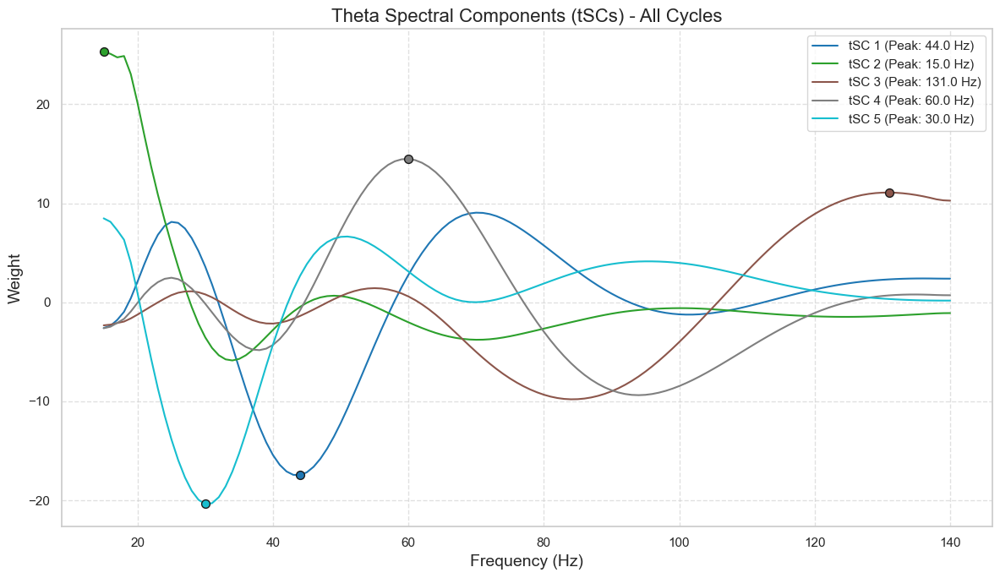


--- Step 4: Assigning components and calculating transitions ---

Component Composition:
  Component 1: 598 phasic cycles, 11369 tonic cycles
  Component 2: 355 phasic cycles, 8600 tonic cycles
  Component 3: 750 phasic cycles, 15195 tonic cycles
  Component 4: 722 phasic cycles, 13238 tonic cycles
  Component 5: 474 phasic cycles, 9870 tonic cycles


In [ ]:
frequencies = np.arange(15, 141, 1)

print("--- Step 1: Processing data ---")
phasic_sss_by_episode = extract_sss_by_episode(phasic_fpps)
tonic_sss_by_episode = extract_sss_by_episode(tonic_fpps)
combined_all_sss = np.concatenate(phasic_sss_by_episode + tonic_sss_by_episode, axis=0)

print("\n--- Step 2: Training global model ---")
n_components_pca = 5
pca_model, ica_model = train_global_ica_model(combined_all_sss, n_components_pca)
if ica_model is None: exit()



print("\n--- Step 3: Visualizing global components ---")
plot_ica_components(pca_model, ica_model, frequencies, "All Cycles", "spectral_components_combined.svg")

print("\n--- Step 4: Assigning components and calculating transitions ---")
phasic_sequences = get_component_sequences(phasic_sss_by_episode, pca_model, ica_model)
tonic_sequences = get_component_sequences(tonic_sss_by_episode, pca_model, ica_model)

print("\nComponent Composition:")
all_phasic_comps = np.concatenate(phasic_sequences) if phasic_sequences else np.array([])
all_tonic_comps = np.concatenate(tonic_sequences) if tonic_sequences else np.array([])
phasic_counts_counter = Counter(all_phasic_comps); tonic_counts_counter = Counter(all_tonic_comps)
phasic_node_counts = np.array([phasic_counts_counter.get(i, 0) for i in range(n_components_pca)])
tonic_node_counts = np.array([tonic_counts_counter.get(i, 0) for i in range(n_components_pca)])
for i in range(n_components_pca): print(f"  Component {i+1}: {phasic_node_counts[i]} phasic cycles, {tonic_node_counts[i]} tonic cycles")

In [135]:
all_cycles_count = 0
for i in range(n_components_pca):
    all_cycles_count += phasic_node_counts[i] + tonic_node_counts[i]
print(f"\nTotal cycles processed: {all_cycles_count} (Phasic: {np.sum(phasic_node_counts)}, Tonic: {np.sum(tonic_node_counts)})")
print(f"Precentage of Phasic Cycles: {np.sum(phasic_node_counts) / all_cycles_count * 100 if all_cycles_count > 0 else 0}")
print(f"Precentage of Tonic Cycles: {np.sum(tonic_node_counts) / all_cycles_count * 100 if all_cycles_count > 0 else 0}")



Total cycles processed: 61171 (Phasic: 2899, Tonic: 58272)
Precentage of Phasic Cycles: 4.739173791502509
Precentage of Tonic Cycles: 95.26082620849749


In [136]:
combined_waveforms = waveforms_df.drop(columns=['rat_id', 'condition', 'trial', 'cycle_type', 'SD', 'date'])

In [137]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
embedding_rem = umap_embedder.fit_transform(combined_waveforms.to_numpy())

SystemError: CPUDispatcher(<function nn_descent at 0x17cfcdea0>) returned a result with an exception set

In [138]:
# Re-extract (now including 1-cycle episodes)
phasic_sss_by_episode = extract_sss_by_episode(phasic_fpps)
tonic_sss_by_episode  = extract_sss_by_episode(tonic_fpps)

# ===== compute (global) mode frequency from spectral signatures and replace in trials_df =====

# helper: stack episode matrices (n_cycles_in_ep × n_freq) in the same order as trials_df rows
def stack_cycles(sss_by_episode_list):
    rows = []
    for ep in sss_by_episode_list:
        if isinstance(ep, np.ndarray) and ep.ndim == 2 and ep.shape[0] >= 1:
            rows.append(ep)
    return np.vstack(rows) if rows else np.zeros((0, len(frequencies)))

# 1) build matrices of cycle signatures
X_phasic = stack_cycles(phasic_sss_by_episode)   # shape: (N_phasic_cycles, n_freq)
X_tonic  = stack_cycles(tonic_sss_by_episode)    # shape: (N_tonic_cycles,  n_freq)

# sanity: counts must match trials_df rows per state
is_phasic = trials_df['cycle_type'].str.lower().eq('phasic')
is_tonic  = trials_df['cycle_type'].str.lower().eq('tonic')
assert X_phasic.shape[0] == int(is_phasic.sum()), "phasic signatures count ≠ trials_df phasic rows"
assert X_tonic.shape[0]  == int(is_tonic.sum()),  "tonic signatures count ≠ trials_df tonic rows"

# 2) mode frequency = argmax over frequency bins for each cycle
# (uses the smoothed signatures you already produced in extract_sss_by_episode)
mode_phasic = frequencies[np.argmax(X_phasic, axis=1)]
mode_tonic  = frequencies[np.argmax(X_tonic,  axis=1)]

# 3) write back to trials_df (overwriting any previous 'mode_freqs')
trials_df = trials_df.copy()
trials_df['mode_freqs'] = np.nan
trials_df.loc[is_phasic, 'mode_freqs'] = mode_phasic
trials_df.loc[is_tonic,  'mode_freqs'] = mode_tonic

# optional: quick check
print("mode_freqs updated from spectral signatures.")
print("phasic mode range:", np.nanmin(mode_phasic), "→", np.nanmax(mode_phasic))
print("tonic  mode range:", np.nanmin(mode_tonic),  "→", np.nanmax(mode_tonic))

# Option A: reuse existing PCA/ICA
phasic_sequences = get_component_sequences(phasic_sss_by_episode, pca_model, ica_model)
tonic_sequences  = get_component_sequences(tonic_sss_by_episode,  pca_model, ica_model)

# Option B (optional): retrain with all cycles included
# combined_all_sss = np.concatenate(phasic_sss_by_episode + tonic_sss_by_episode, axis=0)
# pca_model, ica_model = train_global_ica_model(combined_all_sss, n_components_pca)
# phasic_sequences = get_component_sequences(phasic_sss_by_episode, pca_model, ica_model)
# tonic_sequences  = get_component_sequences(tonic_sss_by_episode,  pca_model, ica_model)

mode_freqs updated from spectral signatures.
phasic mode range: 15 → 140
tonic  mode range: 15 → 140


In [139]:
phasic_labels = np.concatenate(phasic_sequences) if phasic_sequences else np.array([], dtype=int)
tonic_labels  = np.concatenate(tonic_sequences)  if tonic_sequences  else np.array([], dtype=int)

is_phasic = trials_df['cycle_type'].str.lower().eq('phasic')
is_tonic  = trials_df['cycle_type'].str.lower().eq('tonic')

n_phasic_rows = int(is_phasic.sum())
n_tonic_rows  = int(is_tonic.sum())

print(f"phasic rows vs labels: {n_phasic_rows} vs {len(phasic_labels)}")
print(f"tonic  rows vs labels: {n_tonic_rows}  vs {len(tonic_labels)}")

# If they still mismatch, stop and inspect
assert len(phasic_labels) == n_phasic_rows, "Phasic count mismatch"
assert len(tonic_labels)  == n_tonic_rows,  "Tonic count mismatch"

trials_df = trials_df.copy()
trials_df['tSC_component'] = -1
trials_df.loc[is_phasic, 'tSC_component'] = phasic_labels
trials_df.loc[is_tonic,  'tSC_component'] = tonic_labels

trials_df['tSC_component_1based'] = trials_df['tSC_component'] + 1

phasic rows vs labels: 2899 vs 2899
tonic  rows vs labels: 58272  vs 58272


In [140]:
import numpy as np
import matplotlib.pyplot as plt

# --- make sure we can stack cycle signatures in the SAME order as trials_df rows ---
def stack_cycles(sss_by_episode_list):
    rows = []
    for ep in sss_by_episode_list:
        if isinstance(ep, np.ndarray) and ep.ndim == 2 and ep.shape[0] >= 1:
            rows.append(ep)
    return np.vstack(rows) if rows else np.zeros((0, len(frequencies)))

# matrices of cycle signatures (already smoothed/normalized by your extract_sss_by_episode)
X_phasic = stack_cycles(phasic_sss_by_episode)
X_tonic  = stack_cycles(tonic_sss_by_episode)

# quick sanity: lengths should match the number of rows in trials_df for each state
assert X_phasic.shape[0] == int(trials_df['cycle_type'].str.lower().eq('phasic').sum()), \
    "Mismatch: phasic signatures vs trials_df rows"
assert X_tonic.shape[0]  == int(trials_df['cycle_type'].str.lower().eq('tonic').sum()), \
    "Mismatch: tonic signatures vs trials_df rows"

def plot_signatures_with_modes(trials_df, X_phasic, X_tonic, frequencies,
                               state='phasic', component_col='tSC_component',
                               component_id=None, n_examples=12, random_state=0,
                               show_average=True, also_show_cc=False):
    """
    Plot per-cycle spectral signatures with dashed vertical lines at the (global) mode frequency.
    Optionally overlay component-conditioned mode (if a 'mode_freq_cc' column exists) as a dotted line.
    
    Parameters
    ----------
    state : 'phasic' or 'tonic'
    component_col : name of the column that holds component labels (e.g. 'tSC_component' or 'tSC_label')
    component_id : if not None, filter to this component id (0-based)
    n_examples : how many cycles to display
    also_show_cc : if True and 'mode_freq_cc' exists in trials_df, plot it as a dotted line
    """
    state = state.lower()
    assert state in ('phasic', 'tonic')
    
    # select the right matrix and a mask into trials_df
    is_state = trials_df['cycle_type'].str.lower().eq(state)
    X = X_phasic if state == 'phasic' else X_tonic
    
    # indices (within trials_df) for this state
    idx_df_state = np.where(is_state.values)[0]
    
    # optionally filter by component
    if component_id is not None and component_col in trials_df.columns:
        mask = is_state & (trials_df[component_col] == component_id)
        idx_df = np.where(mask.values)[0]
    else:
        idx_df = idx_df_state
    
    if idx_df.size == 0:
        print("No cycles found for the given filters.")
        return
    
    # map trials_df row indices -> row indices inside X (state matrix)
    # (since X_phasic rows correspond to the phasic rows in trials_df in order)
    pos_in_state = {g: i for i, g in enumerate(idx_df_state)}
    rows_in_X = np.array([pos_in_state[i] for i in idx_df], dtype=int)
    
    # sample a subset
    rng = np.random.default_rng(random_state)
    if rows_in_X.size > n_examples:
        pick = np.sort(rng.choice(rows_in_X, size=n_examples, replace=False))
    else:
        pick = np.sort(rows_in_X)
    
    # pull data for plotting
    sigs = X[pick, :]                   # (n_examples, n_freq)
    modes = trials_df.iloc[idx_df[np.isin(rows_in_X, pick)]]['mode_freqs'].to_numpy()
    have_cc = also_show_cc and ('mode_freq_cc' in trials_df.columns)
    if have_cc:
        modes_cc = trials_df.iloc[idx_df[np.isin(rows_in_X, pick)]]['mode_freq_cc'].to_numpy()
    
    # plot
    n_cols = 4
    n_rows = int(np.ceil(len(pick) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.6*n_cols, 2.6*n_rows), sharex=True, sharey=True)
    axes = np.atleast_1d(axes).ravel()
    
    for k, ax in enumerate(axes[:len(pick)]):
        ax.plot(frequencies, sigs[k], lw=1.5, color='k')
        # global mode (yours)
        ax.axvline(modes[k], ls='--', lw=1.5, color='tab:orange', label='global mode' if k == 0 else None)
        # component-conditioned mode (optional)
        if have_cc and np.isfinite(modes_cc[k]):
            ax.axvline(modes_cc[k], ls=':', lw=2.0, color='tab:blue', label='comp-conditioned' if k == 0 else None)
        ax.set_title(f'Cycle {k+1}', fontsize=10)
        ax.grid(alpha=0.2)
    
    # average signature (optional, spans all filtered rows not just sampled ones)
    if show_average:
        # compute average over all rows satisfying the filter
        avg_sig = X[rows_in_X].mean(axis=0)
        # add an extra wide panel for the average
        fig_avg, ax_avg = plt.subplots(1, 1, figsize=(6, 3))
        ax_avg.plot(frequencies, avg_sig, lw=2, color='tab:green')
        # average mode lines (over filtered rows)
        vals_global = trials_df.iloc[idx_df]['mode_freqs'].to_numpy()
        vals_global = vals_global[np.isfinite(vals_global)]
        if vals_global.size:
            ax_avg.axvline(np.median(vals_global), ls='--', lw=2, color='tab:orange', label='median global mode')
        if have_cc:
            vals_cc = trials_df.iloc[idx_df]['mode_freq_cc'].to_numpy()
            vals_cc = vals_cc[np.isfinite(vals_cc)]
            if vals_cc.size:
                ax_avg.axvline(np.median(vals_cc), ls=':', lw=2, color='tab:blue', label='median comp-conditioned')
        comp_txt = f" | comp {component_id+1}" if component_id is not None else ""
        ax_avg.set_title(f'Average signature — {state}{comp_txt}')
        ax_avg.set_xlabel('Frequency (Hz)'); ax_avg.set_ylabel('Signature (a.u.)')
        ax_avg.set_xlim(frequencies.min(), frequencies.max())
        ax_avg.grid(alpha=0.3)
        ax_avg.legend(frameon=False)
    
    # tidy small multiples
    for ax in axes:
        ax.set_xlim(frequencies.min(), frequencies.max())
        ax.set_xlabel('Hz'); ax.set_ylabel('Signature (a.u.)')
    # add legend once
    handles, labels = axes[0].get_legend_handles_labels()
    if handles:
        axes[0].legend(handles, labels, frameon=False, fontsize=9)
    plt.tight_layout()
    plt.show()

# --------------------- examples ---------------------
# 12 phasic cycles assigned to component 1 (0-based), with both mode lines
# plot_signatures_with_modes(trials_df, X_phasic, X_tonic, frequencies,
#                            state='phasic', component_col='tSC_component',
#                            component_id=0, n_examples=12, also_show_cc=True)

# 8 tonic cycles regardless of component (only global mode line)
# plot_signatures_with_modes(trials_df, X_phasic, X_tonic, frequencies,
#                            state='tonic', component_id=None, n_examples=8, also_show_cc=False)

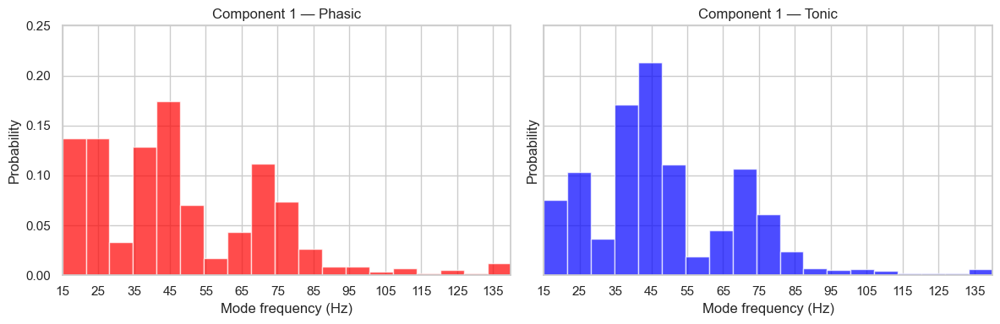

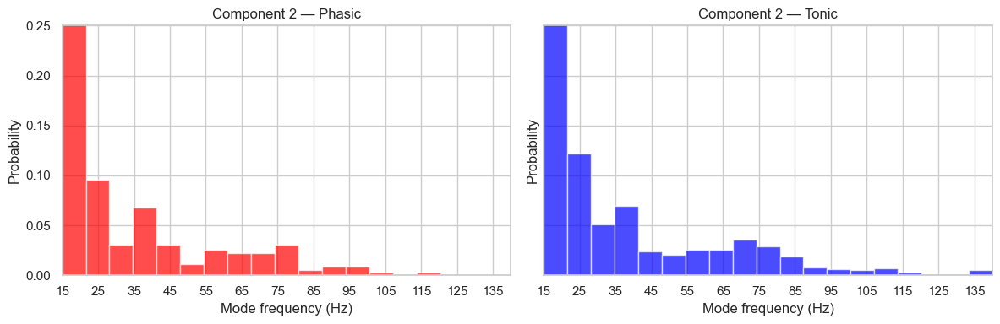

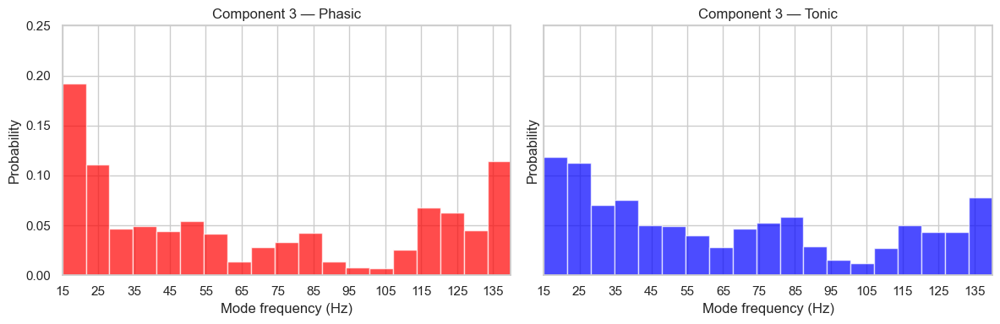

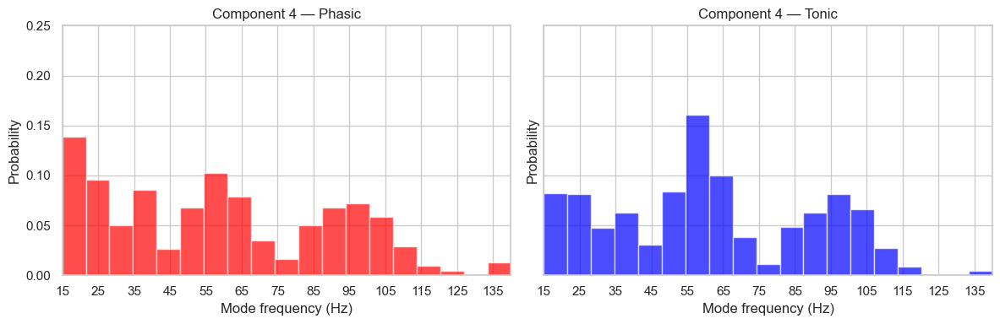

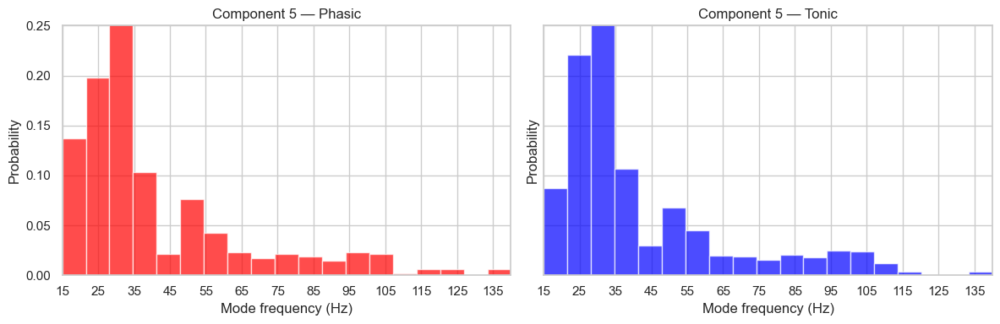

In [141]:
import numpy as np
import matplotlib.pyplot as plt

# --- choose how to normalize: "prob" (sum of bars = 1) or "pdf" (area = 1) ---
normalization = "prob"  # change to "pdf" if you prefer probability density

components = sorted(trials_df["tSC_component_1based"].dropna().unique().astype(int))
bins = np.linspace(15, 140, 20)  # 19 bins -> uniform bin width
xlim = (15, 140)
xticks = np.arange(15, 141, 10)  # ticks every 10 Hz

# Keep only clean data
df = trials_df.loc[
    trials_df["mode_freqs"].between(15, 140) &
    trials_df["tSC_component_1based"].isin(components) &
    trials_df["cycle_type"].isin(["phasic", "tonic"])
].copy()

# strict y limit
ymax = 0.25 if normalization == "prob" else 0.05  # adjust pdf case as needed

for comp in components:
    # create a new figure per component, 1 row × 2 cols: [phasic, tonic]
    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

    for j, ctype in enumerate(["phasic", "tonic"]):
        ax = axes[j]
        sub = df[(df["tSC_component_1based"] == comp) & (df["cycle_type"] == ctype)]
        values = sub["mode_freqs"].to_numpy()

        if values.size > 0:
            if normalization == "prob":
                weights = np.ones_like(values, dtype=float) / values.size
                ax.hist(values, bins=bins, weights=weights,
                        color="red" if ctype == "phasic" else "blue", alpha=0.7)
                ylabel = "Probability"
            elif normalization == "pdf":
                ax.hist(values, bins=bins, density=True,
                        color="red" if ctype == "phasic" else "blue", alpha=0.7)
                ylabel = "Probability density (1/Hz)"
        else:
            ylabel = "Probability" if normalization == "prob" else "Probability density (1/Hz)"

        ax.set_xlim(*xlim)
        ax.set_xticks(xticks)
        ax.tick_params(labelbottom=True)   # show xtick labels on all subplots
        ax.set_xlabel("Mode frequency (Hz)")
        ax.set_ylabel(ylabel)
        ax.set_title(f"Component {comp} — {ctype.capitalize()}")
        ax.set_ylim(0, ymax)  # <-- strict y-axis

    plt.tight_layout()
    plt.show()
    # Optionally save each figure:
    # fig.savefig(f"component_{comp:02d}_hist.png", dpi=200, bbox_inches="tight")

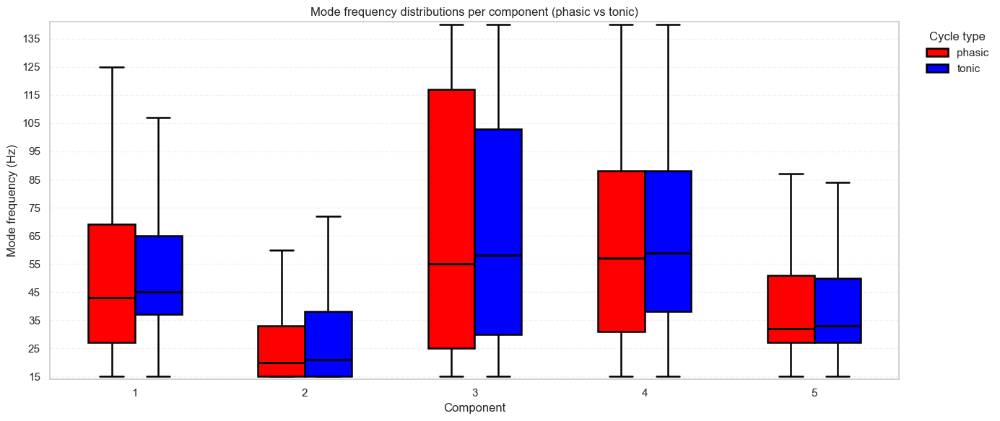

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid")  # light grid; easier to read
plt.figure(figsize=(14,6))

ax = sns.boxplot(
    data=trials_df,
    x="tSC_component_1based", y="mode_freqs",
    hue="cycle_type",
    palette={"phasic":"red","tonic":"blue"},
    dodge=True, width=0.55, saturation=1,
    whis=1.5, showfliers=False,
    linewidth=1.8,                      # thicker box edges
    boxprops=dict(edgecolor="black"),
    medianprops=dict(color="black", linewidth=2.2),
    whiskerprops=dict(color="black", linewidth=1.8),
    capprops=dict(color="black", linewidth=1.8)
)

y_min = trials_df["mode_freqs"].min()
y_max = trials_df["mode_freqs"].max()

ax.set_ylim(y_min - 1, y_max + 1)     # small margin
ax.set_yticks(range(15, 141, 10))     # still label 15..140 if you want
ax.set_xlabel("Component")
ax.set_ylabel("Mode frequency (Hz)")
ax.set_title("Mode frequency distributions per component (phasic vs tonic)")

# Subtle grid to avoid overpowering the lines
ax.grid(axis="y", linestyle="--", alpha=0.25)
ax.grid(axis="x", visible=False)

ax.legend(title="Cycle type", frameon=False, loc="upper left", bbox_to_anchor=(1.02, 1))
plt.tight_layout()
plt.show()

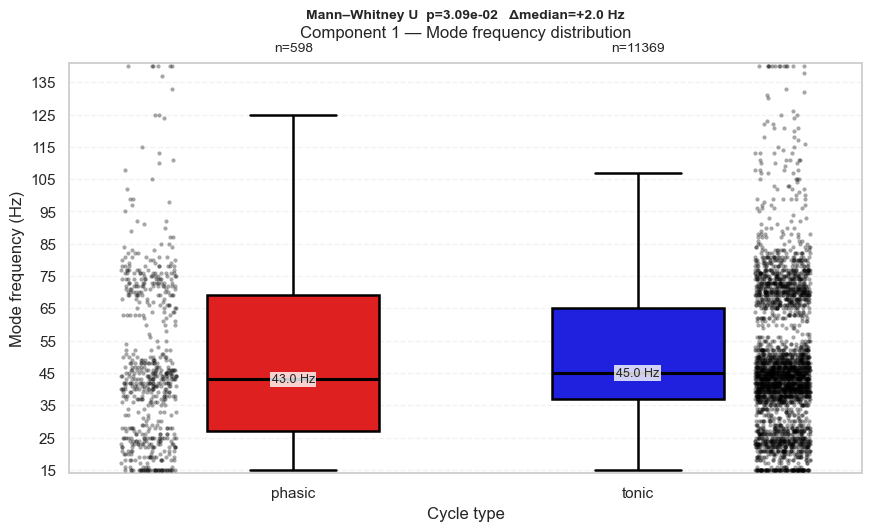

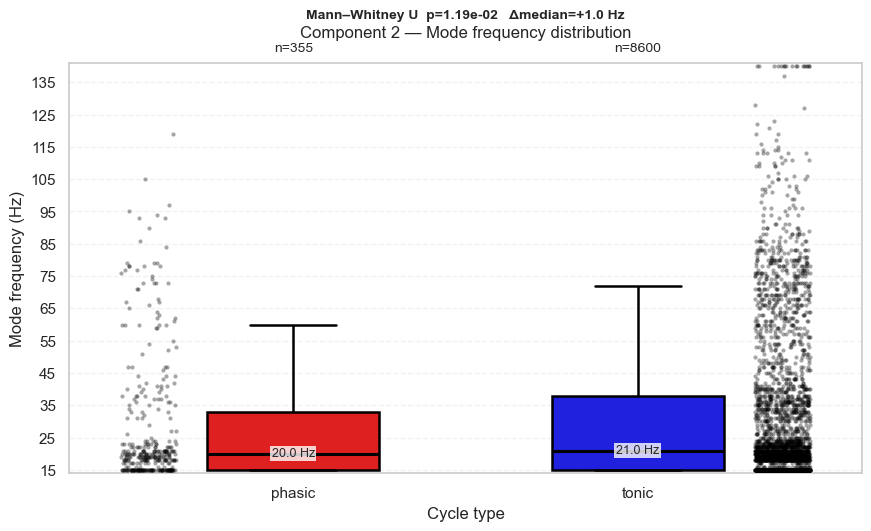

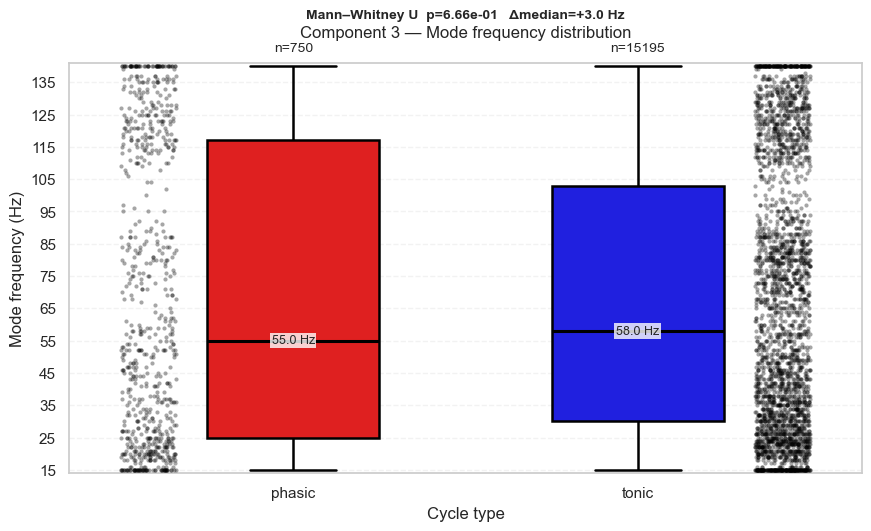

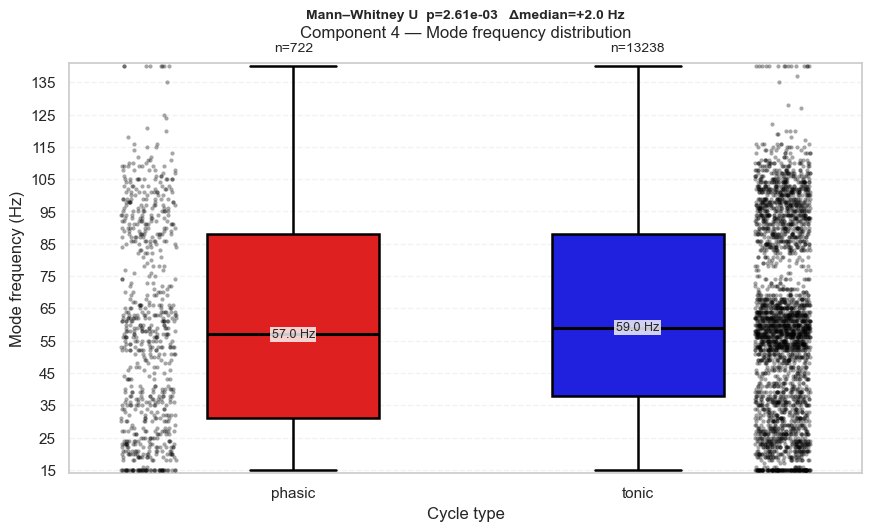

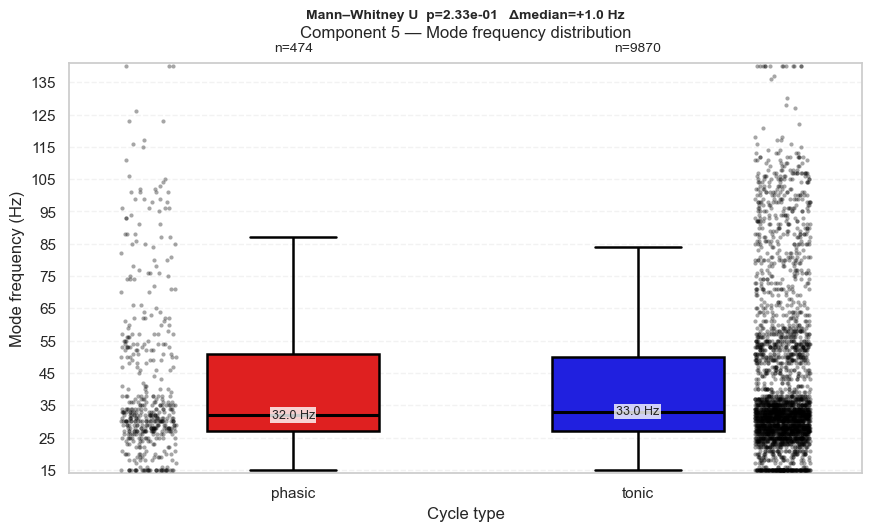

In [143]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.transforms import blended_transform_factory
from scipy.stats import mannwhitneyu

sns.set_theme(style="whitegrid")

# --- filter & setup ---
valid_cycle = ["phasic", "tonic"]
df = (
    trials_df
    .loc[
        trials_df["mode_freqs"].between(15, 140) &
        trials_df["cycle_type"].isin(valid_cycle)
    ]
    .dropna(subset=["tSC_component_1based", "mode_freqs"])
    .copy()
)
df["tSC_component_1based"] = df["tSC_component_1based"].astype(int)
components = sorted(df["tSC_component_1based"].unique())

ymin, ymax = 15, 140
yticks = np.arange(15, 141, 10)
order = ["phasic", "tonic"]
palette = {"phasic": "red", "tonic": "blue"}

rng = np.random.default_rng(0)
max_points_per_group = 3000  # subsample for huge N, for speed

def side_swarm(ax, y, x_center, side, offset=0.42, spread=0.08, **scatter_kw):
    """
    Draw a 'side swarm' next to the box (side=-1 left, +1 right).
    offset pushes the cloud away from the box; spread controls cloud width.
    """
    n = y.size
    if n == 0:
        return
    if n > max_points_per_group:
        idx = rng.choice(n, size=max_points_per_group, replace=False)
        y = y[idx]
        n = y.size
    x = np.full(n, x_center + side * offset, dtype=float)
    x += rng.uniform(-spread, spread, size=n)
    ax.scatter(x, y, **scatter_kw)

for comp in components:
    sub = df[df["tSC_component_1based"] == comp]

    counts = sub.groupby("cycle_type")["mode_freqs"].size().reindex(order, fill_value=0)
    meds = sub.groupby("cycle_type")["mode_freqs"].median().reindex(order)

    fig, ax = plt.subplots(figsize=(8.6, 5.2), constrained_layout=True)

    # main boxplot
    sns.boxplot(
        data=sub, x="cycle_type", y="mode_freqs",
        order=order, palette=palette, width=0.5, showfliers=False,
        linewidth=1.8, boxprops=dict(edgecolor="black"),
        medianprops=dict(color="black", linewidth=2.2),
        whiskerprops=dict(color="black", linewidth=1.8),
        capprops=dict(color="black", linewidth=1.8),
        ax=ax,
    )
    for patch in ax.artists:
        patch.set_alpha(0.9)

    # side swarms (kept outside the boxes)
    for xi, ct in enumerate(order):
        yvals = sub.loc[sub["cycle_type"] == ct, "mode_freqs"].to_numpy()
        side = -1 if ct == "phasic" else +1
        side_swarm(
            ax, yvals, xi, side,
            s=9, alpha=0.35, color="black", linewidths=0, zorder=3
        )

    # median labels on the boxes (with small white background)
    for xi, ct in enumerate(order):
        m = meds[ct]
        if np.isfinite(m):
            ax.text(
                xi, m, f"{m:.1f} Hz",
                ha="center", va="center", fontsize=9,
                bbox=dict(facecolor="white", edgecolor="none", alpha=0.8, pad=1.2),
                zorder=4
            )

    # put n and p in the top margin using axis/figure transforms (avoids overlap)
    trans_data_x__axes_y = blended_transform_factory(ax.transData, ax.transAxes)

    # n labels above each category
    ax.text(0, 1.02, f"n={int(counts['phasic'])}", transform=trans_data_x__axes_y,
            ha="center", va="bottom", fontsize=10, clip_on=False)
    ax.text(1, 1.02, f"n={int(counts['tonic'])}", transform=trans_data_x__axes_y,
            ha="center", va="bottom", fontsize=10, clip_on=False)

    # Mann–Whitney U test (two-sided) and Δ median; centered above axis
    a = sub.loc[sub["cycle_type"] == "phasic", "mode_freqs"].to_numpy()
    b = sub.loc[sub["cycle_type"] == "tonic",  "mode_freqs"].to_numpy()
    if (a.size > 0) and (b.size > 0):
        stat, p = mannwhitneyu(a, b, alternative="two-sided")
        delta = (np.nanmedian(b) - np.nanmedian(a))
        ax.text(
            0.5, 1.10,
            f"Mann–Whitney U  p={p:.2e}   Δmedian={delta:+.1f} Hz",
            transform=ax.transAxes, ha="center", va="bottom",
            fontsize=10, fontweight="bold", clip_on=False
        )

    # cosmetics & layout
    ax.set_xlim(-0.65, 1.65)  # extra room for side swarms
    ax.set_ylim(ymin - 1, ymax + 1)
    ax.set_yticks(yticks)
    ax.set_xlabel("Cycle type")
    ax.set_ylabel("Mode frequency (Hz)")
    ax.set_title(f"Component {comp} — Mode frequency distribution", pad=18)
    ax.grid(axis="y", linestyle="--", alpha=0.25)
    ax.grid(axis="x", visible=False)
    if ax.get_legend():
        ax.legend_.remove()

    plt.show()
    # fig.savefig(f"component_{comp:02d}_box_swarm.png", dpi=200, bbox_inches="tight")

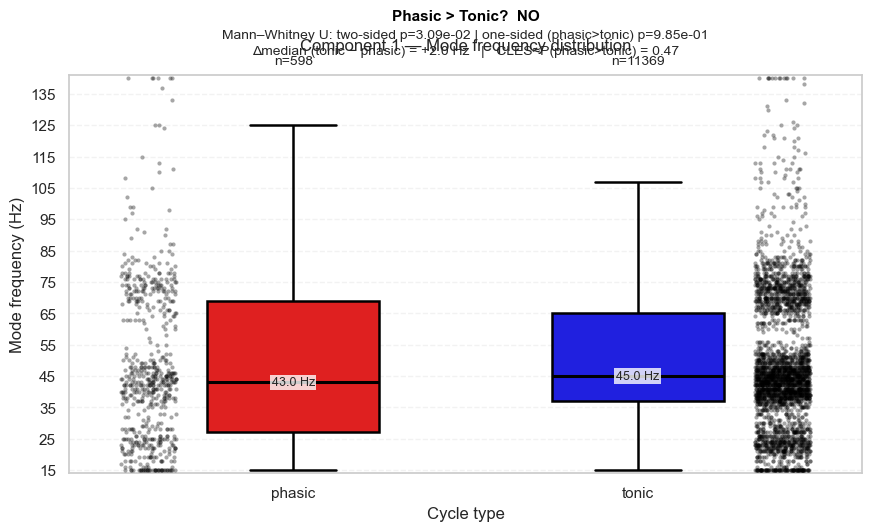

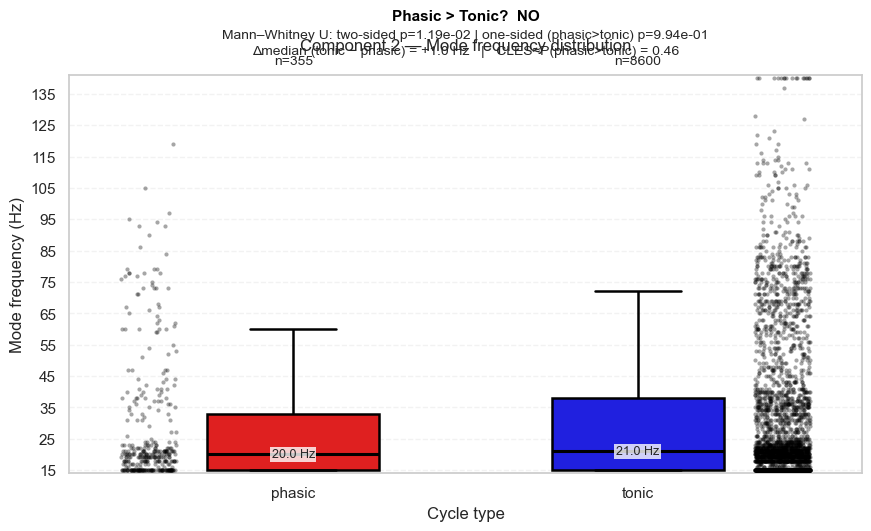

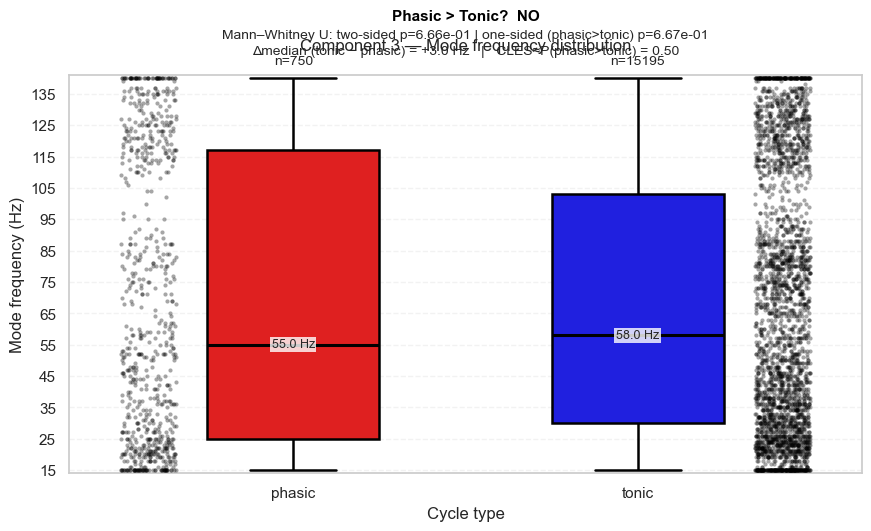

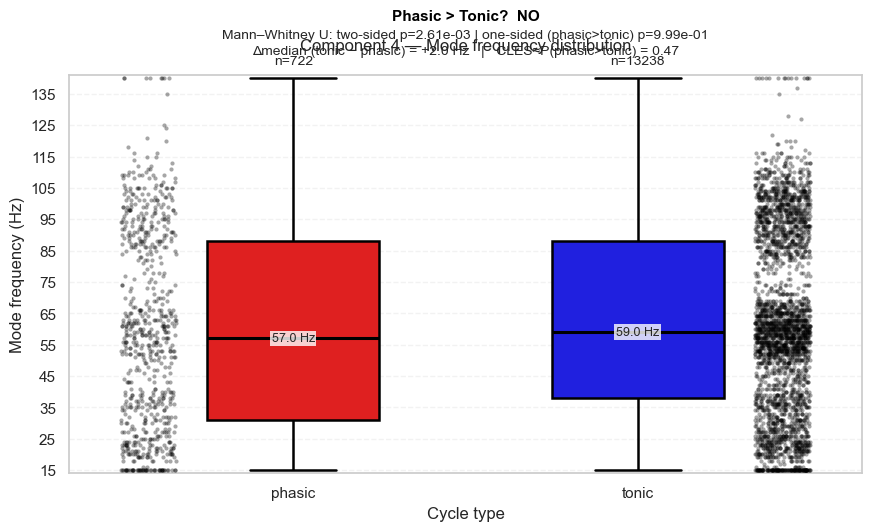

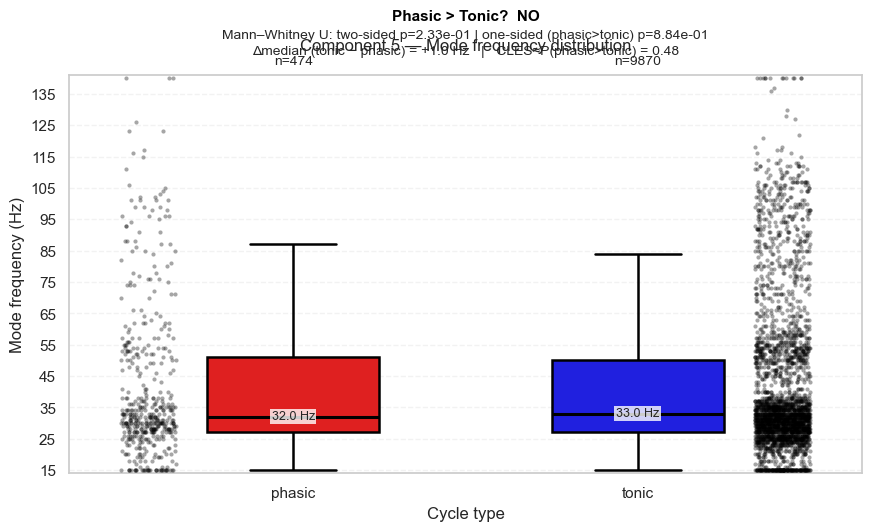

In [144]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.transforms import blended_transform_factory
from scipy.stats import mannwhitneyu

sns.set_theme(style="whitegrid")

# --- filter & setup ---
valid_cycle = ["phasic", "tonic"]
df = (
    trials_df
    .loc[
        trials_df["mode_freqs"].between(15, 140) &
        trials_df["cycle_type"].isin(valid_cycle)
    ]
    .dropna(subset=["tSC_component_1based", "mode_freqs"])
    .copy()
)
df["tSC_component_1based"] = df["tSC_component_1based"].astype(int)
components = sorted(df["tSC_component_1based"].unique())

ymin, ymax = 15, 140
yticks = np.arange(15, 141, 10)
order = ["phasic", "tonic"]
palette = {"phasic": "red", "tonic": "blue"}

rng = np.random.default_rng(0)
max_points_per_group = 3000  # subsample for huge N, for speed

def side_swarm(ax, y, x_center, side, offset=0.42, spread=0.08, **scatter_kw):
    """
    Draw a 'side swarm' next to the box (side=-1 left, +1 right).
    offset pushes the cloud away from the box; spread controls cloud width.
    """
    n = y.size
    if n == 0:
        return
    if n > max_points_per_group:
        idx = rng.choice(n, size=max_points_per_group, replace=False)
        y = y[idx]
        n = y.size
    x = np.full(n, x_center + side * offset, dtype=float)
    x += rng.uniform(-spread, spread, size=n)
    ax.scatter(x, y, **scatter_kw)

for comp in components:
    sub = df[df["tSC_component_1based"] == comp]

    counts = sub.groupby("cycle_type")["mode_freqs"].size().reindex(order, fill_value=0)
    meds = sub.groupby("cycle_type")["mode_freqs"].median().reindex(order)

    fig, ax = plt.subplots(figsize=(8.6, 5.2), constrained_layout=True)

    # main boxplot
    sns.boxplot(
        data=sub, x="cycle_type", y="mode_freqs",
        order=order, palette=palette, width=0.5, showfliers=False,
        linewidth=1.8, boxprops=dict(edgecolor="black"),
        medianprops=dict(color="black", linewidth=2.2),
        whiskerprops=dict(color="black", linewidth=1.8),
        capprops=dict(color="black", linewidth=1.8),
        ax=ax,
    )
    for patch in ax.artists:
        patch.set_alpha(0.9)

    # side swarms (kept outside the boxes)
    for xi, ct in enumerate(order):
        yvals = sub.loc[sub["cycle_type"] == ct, "mode_freqs"].to_numpy()
        side = -1 if ct == "phasic" else +1
        side_swarm(
            ax, yvals, xi, side,
            s=9, alpha=0.35, color="black", linewidths=0, zorder=3
        )

    # median labels on the boxes (with small white background)
    for xi, ct in enumerate(order):
        m = meds[ct]
        if np.isfinite(m):
            ax.text(
                xi, m, f"{m:.1f} Hz",
                ha="center", va="center", fontsize=9,
                bbox=dict(facecolor="white", edgecolor="none", alpha=0.8, pad=1.2),
                zorder=4
            )

    # put n and p in the top margin using axis/figure transforms (avoids overlap)
    trans_data_x__axes_y = blended_transform_factory(ax.transData, ax.transAxes)

    # n labels above each category
    ax.text(0, 1.02, f"n={int(counts['phasic'])}", transform=trans_data_x__axes_y,
            ha="center", va="bottom", fontsize=10, clip_on=False)
    ax.text(1, 1.02, f"n={int(counts['tonic'])}",  transform=trans_data_x__axes_y,
            ha="center", va="bottom", fontsize=10, clip_on=False)

    # Mann–Whitney U tests and Δ median; centered above axis
    a = sub.loc[sub["cycle_type"] == "phasic", "mode_freqs"].to_numpy()
    b = sub.loc[sub["cycle_type"] == "tonic",  "mode_freqs"].to_numpy()

    if (a.size > 0) and (b.size > 0):
        # Two-sided (for reference) and one-sided matching your hypothesis (phasic > tonic)
        # method='auto' lets SciPy choose exact vs asymptotic depending on sample sizes/ties
        stat_2s, p_2s = mannwhitneyu(a, b, alternative="two-sided", method="auto")
        stat_g,  p_g  = mannwhitneyu(a, b, alternative="greater",   method="auto")

        # Δ median reported as tonic - phasic (negative favors phasic)
        delta = (np.nanmedian(b) - np.nanmedian(a))

        # Common-language effect size: P(X_phasic > Y_tonic)
        n1, n2 = a.size, b.size
        cles = stat_g / (n1 * n2)  # proportion of favorable pairs

        # Decision string for easy-at-a-glance reading
        alpha = 0.05
        supports = (p_g < alpha) and (delta < 0)
        verdict = "YES" if supports else "NO"
        color = "green" if supports else "black"

        ax.text(
            0.5, 1.13,
            f"Phasic > Tonic?  {verdict}",
            transform=ax.transAxes, ha="center", va="bottom",
            fontsize=11, fontweight="bold", color=color, clip_on=False
        )
        ax.text(
            0.5, 1.085,
            f"Mann–Whitney U: two-sided p={p_2s:.2e} | one-sided (phasic>tonic) p={p_g:.2e}",
            transform=ax.transAxes, ha="center", va="bottom",
            fontsize=10, clip_on=False
        )
        ax.text(
            0.5, 1.045,
            f"Δmedian (tonic − phasic) = {delta:+.1f} Hz   |   CLES≈P(phasic>tonic) = {cles:.2f}",
            transform=ax.transAxes, ha="center", va="bottom",
            fontsize=10, clip_on=False
        )

    # cosmetics & layout
    ax.set_xlim(-0.65, 1.65)  # extra room for side swarms
    ax.set_ylim(ymin - 1, ymax + 1)
    ax.set_yticks(yticks)
    ax.set_xlabel("Cycle type")
    ax.set_ylabel("Mode frequency (Hz)")
    ax.set_title(f"Component {comp} — Mode frequency distribution", pad=18)
    ax.grid(axis="y", linestyle="--", alpha=0.25)
    ax.grid(axis="x", visible=False)
    if ax.get_legend():
        ax.legend_.remove()

    plt.show()
    # fig.savefig(f"component_{comp:02d}_box_swarm.png", dpi=200, bbox_inches="tight")


=== Component 1 ===
Phasic: n=598, mean=47.9, sd=25, median=43, IQR=42
Tonic : n=11369, mean=48.7, sd=21.3, median=45, IQR=28
Normality (Shapiro-Wilk) Phasic: stat=0.92, p=2.72e-17  | Normality (D'Agostino K^2) Tonic: stat=1.75e+03, p=0
Variance homogeneity (Brown–Forsythe): stat=28.8, p=8.35e-08
Welch t-test (means): t=-0.741, p=0.459


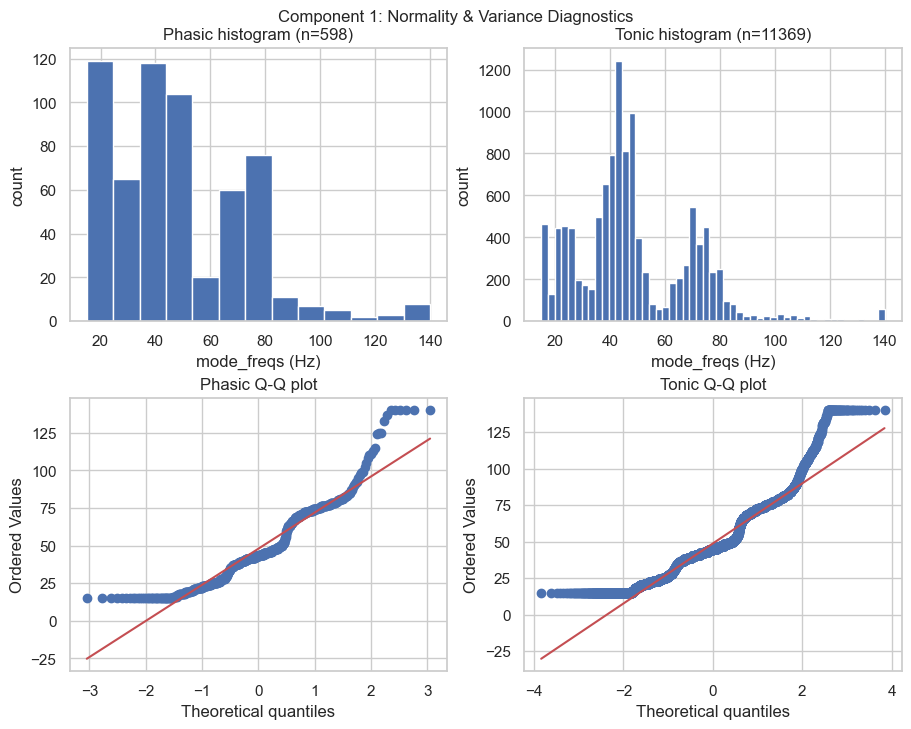


=== Component 2 ===
Phasic: n=355, mean=28.5, sd=20.2, median=20, IQR=18
Tonic : n=8600, mean=31.9, sd=23.8, median=21, IQR=23
Normality (Shapiro-Wilk) Phasic: stat=0.686, p=3.58e-25  | Normality (D'Agostino K^2) Tonic: stat=2.94e+03, p=0
Variance homogeneity (Brown–Forsythe): stat=7.22, p=0.0072
Welch t-test (means): t=-3.12, p=0.00191


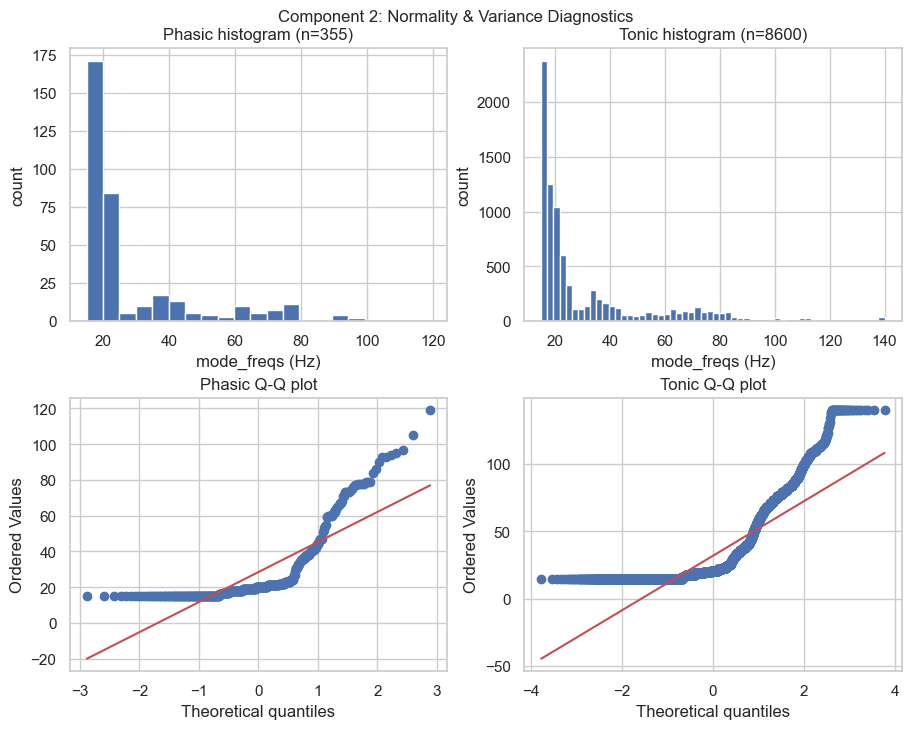


=== Component 3 ===
Phasic: n=750, mean=68.5, sd=45.2, median=55, IQR=92
Tonic : n=15195, mean=67, sd=40.6, median=58, IQR=73
Normality (Shapiro-Wilk) Phasic: stat=0.87, p=1.7e-24  | Normality (D'Agostino K^2) Tonic: stat=1.24e+04, p=0
Variance homogeneity (Brown–Forsythe): stat=32, p=1.55e-08
Welch t-test (means): t=0.872, p=0.383


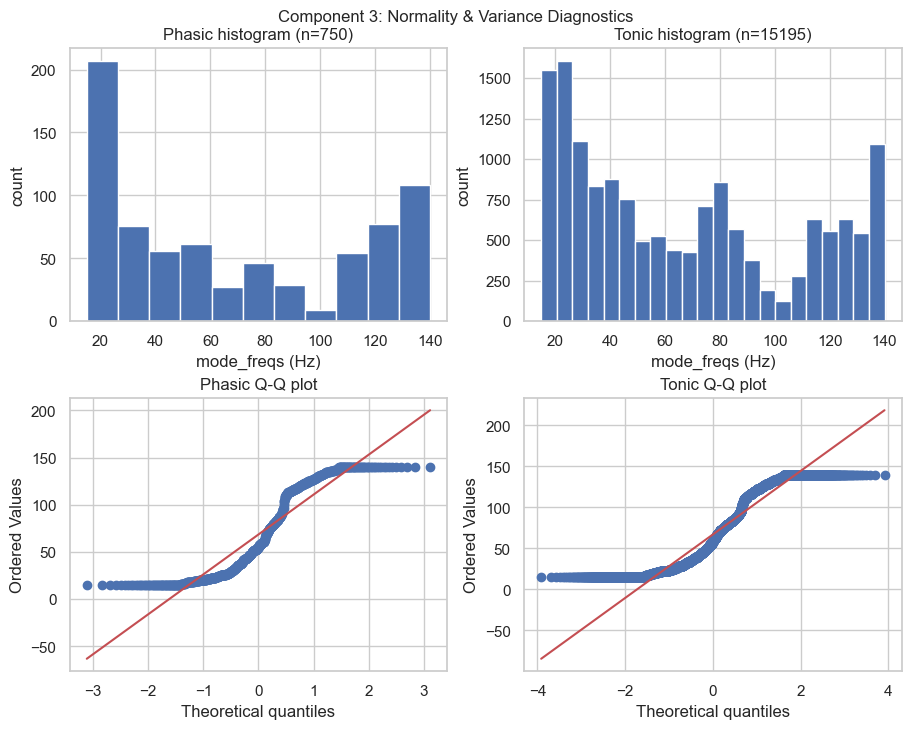


=== Component 4 ===
Phasic: n=722, mean=58.9, sd=31.3, median=57, IQR=57
Tonic : n=13238, mean=61.7, sd=28.4, median=59, IQR=50
Normality (Shapiro-Wilk) Phasic: stat=0.946, p=1.61e-15  | Normality (D'Agostino K^2) Tonic: stat=1.63e+03, p=0
Variance homogeneity (Brown–Forsythe): stat=27.3, p=1.74e-07
Welch t-test (means): t=-2.36, p=0.0186


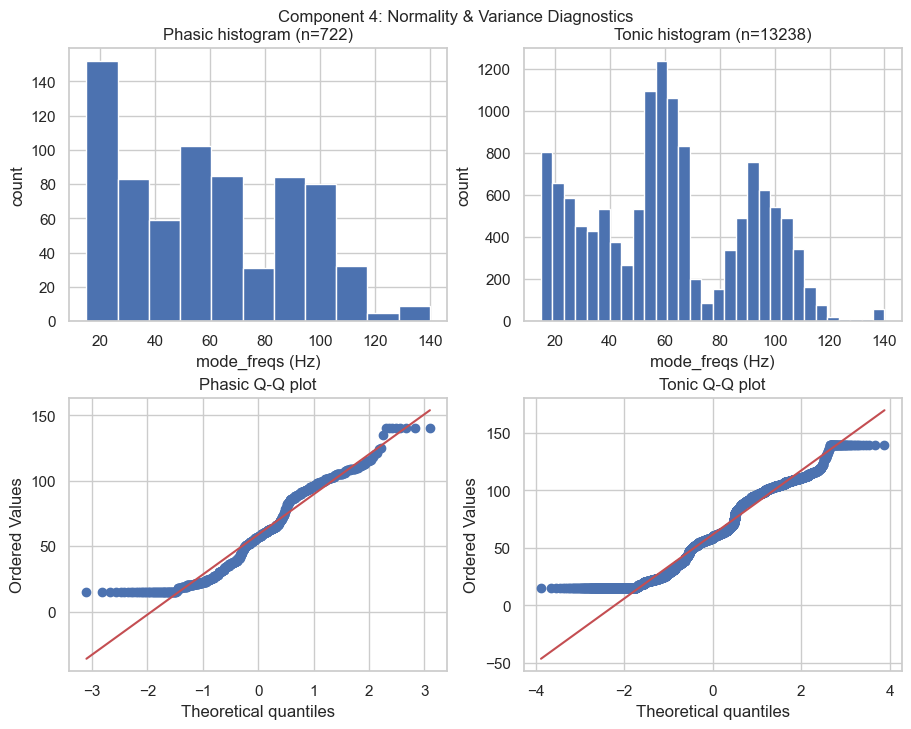


=== Component 5 ===
Phasic: n=474, mean=41.1, sd=24.6, median=32, IQR=24
Tonic : n=9870, mean=41.7, sd=24.1, median=33, IQR=23
Normality (Shapiro-Wilk) Phasic: stat=0.809, p=2.93e-23  | Normality (D'Agostino K^2) Tonic: stat=2.68e+03, p=0
Variance homogeneity (Brown–Forsythe): stat=0.225, p=0.635
Welch t-test (means): t=-0.561, p=0.575


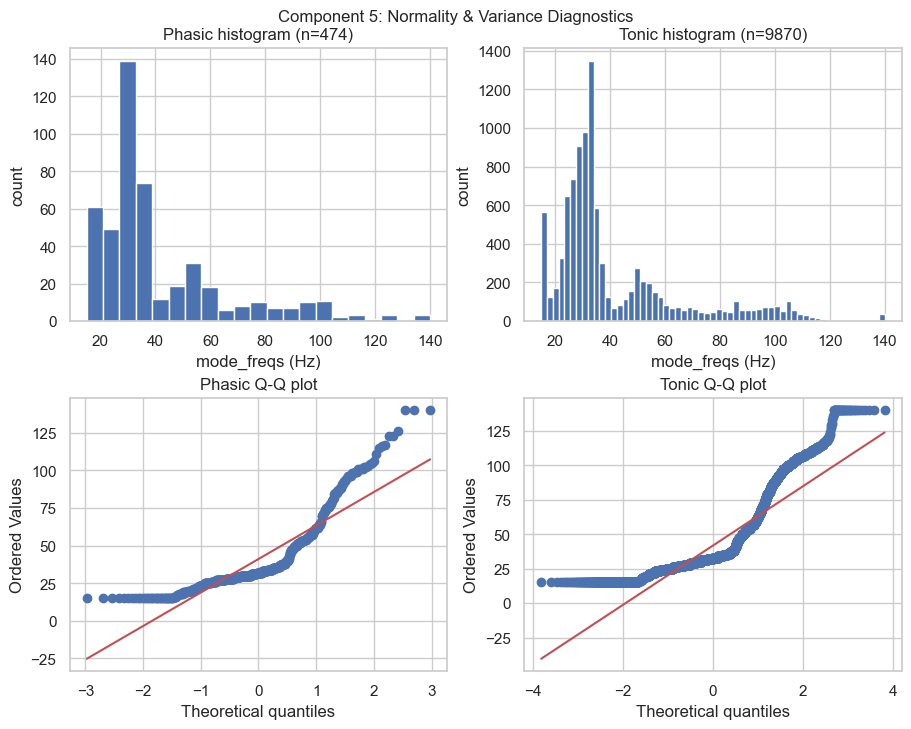

In [145]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import shapiro, normaltest, levene, ttest_ind, probplot

# --- same filter/setup as your plotting code ---
valid_cycle = ["phasic", "tonic"]
df = (
    trials_df
    .loc[
        trials_df["mode_freqs"].between(15, 140) &
        trials_df["cycle_type"].isin(valid_cycle)
    ]
    .dropna(subset=["tSC_component_1based", "mode_freqs"])
    .copy()
)
df["tSC_component_1based"] = df["tSC_component_1based"].astype(int)
components = sorted(df["tSC_component_1based"].unique())

# --------- helpers ---------
def normality_test(x):
    """
    Returns (test_name, stat, p). Uses Shapiro for n<=5000, else D'Agostino K^2 (normaltest).
    Shapiro has better power in small samples; normaltest scales better for large n.
    """
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    n = x.size
    if n < 3:
        return ("insufficient_n", np.nan, np.nan)
    if n <= 5000:
        stat, p = shapiro(x)  # H0: data are normal
        return ("Shapiro-Wilk", stat, p)
    else:
        stat, p = normaltest(x, nan_policy='omit')  # H0: data are normal
        return ("D'Agostino K^2", stat, p)

def variance_homogeneity(a, b):
    """
    Brown–Forsythe test (Levene with center='median').
    H0: group variances are equal.
    """
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    if a.size < 2 or b.size < 2:
        return (np.nan, np.nan)
    stat, p = levene(a, b, center='median')
    return (stat, p)

def describe(x):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if x.size == 0:
        return dict(n=0, mean=np.nan, std=np.nan, median=np.nan, iqr=np.nan)
    q1, q3 = np.percentile(x, [25, 75])
    return dict(
        n=x.size,
        mean=float(np.mean(x)),
        std=float(np.std(x, ddof=1)) if x.size > 1 else np.nan,
        median=float(np.median(x)),
        iqr=float(q3 - q1),
    )

# --------- main loop ---------
for comp in components:
    sub = df[df["tSC_component_1based"] == comp]

    a = sub.loc[sub["cycle_type"] == "phasic", "mode_freqs"].to_numpy()
    b = sub.loc[sub["cycle_type"] == "tonic",  "mode_freqs"].to_numpy()

    desc_a, desc_b = describe(a), describe(b)

    # --- normality per group ---
    test_a, stat_a, p_a = normality_test(a)
    test_b, stat_b, p_b = normality_test(b)

    # --- variance homogeneity (Brown–Forsythe) ---
    lev_stat, lev_p = variance_homogeneity(a, b)

    # --- optional Welch t-test (robust to unequal variances) ---
    welch_stat, welch_p = (np.nan, np.nan)
    if desc_a["n"] >= 2 and desc_b["n"] >= 2:
        welch_stat, welch_p = ttest_ind(a, b, equal_var=False)  # H0: means equal

    # --- print a compact summary ---
    print(f"\n=== Component {comp} ===")
    print(f"Phasic: n={desc_a['n']}, mean={desc_a['mean']:.3g}, sd={desc_a['std']:.3g}, "
          f"median={desc_a['median']:.3g}, IQR={desc_a['iqr']:.3g}")
    print(f"Tonic : n={desc_b['n']}, mean={desc_b['mean']:.3g}, sd={desc_b['std']:.3g}, "
          f"median={desc_b['median']:.3g}, IQR={desc_b['iqr']:.3g}")

    print(f"Normality ({test_a}) Phasic: stat={stat_a:.3g}, p={p_a:.3g}  "
          f"| Normality ({test_b}) Tonic: stat={stat_b:.3g}, p={p_b:.3g}")
    print(f"Variance homogeneity (Brown–Forsythe): stat={lev_stat:.3g}, p={lev_p:.3g}")
    print(f"Welch t-test (means): t={welch_stat:.3g}, p={welch_p:.3g}")

    # --- quick diagnostic plots ---
    # Histogram + Q-Q for each group (close after each component to avoid too many open figs)
    fig, axes = plt.subplots(2, 2, figsize=(9, 7), constrained_layout=True)

    # Histograms
    axes[0,0].hist(a, bins='auto')
    axes[0,0].set_title(f"Phasic histogram (n={desc_a['n']})")
    axes[0,0].set_xlabel("mode_freqs (Hz)"); axes[0,0].set_ylabel("count")

    axes[0,1].hist(b, bins='auto')
    axes[0,1].set_title(f"Tonic histogram (n={desc_b['n']})")
    axes[0,1].set_xlabel("mode_freqs (Hz)"); axes[0,1].set_ylabel("count")

    # Q-Q plots (against normal)
    probplot(a, dist="norm", plot=axes[1,0])
    axes[1,0].set_title("Phasic Q-Q plot")

    probplot(b, dist="norm", plot=axes[1,1])
    axes[1,1].set_title("Tonic Q-Q plot")

    fig.suptitle(f"Component {comp}: Normality & Variance Diagnostics", y=1.02, fontsize=12)
    plt.show()

# ---- Interpretation guide (rules of thumb) ----
# - Normality: p < 0.05 suggests departure from normality. Combine with Q-Q plots.
# - Variances: Brown–Forsythe p < 0.05 suggests unequal variances.
# - If both groups look roughly normal AND Brown–Forsythe p >= 0.05 (or you use Welch regardless),
#   Welch’s t-test is acceptable. Otherwise, prefer Mann–Whitney U (your current approach).

In [146]:
# --- NEW: Welch t-tests phasic vs tonic per component + FDR correction & plot stars ---
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

# Prepare
df = trials_df.dropna(subset=['mode_freqs', 'tSC_component_1based', 'cycle_type']).copy()
df['tSC_component_1based'] = df['tSC_component_1based'].astype(int)
components = sorted(df['tSC_component_1based'].unique())

results = []
raw_pvals = []

def hedges_g(a, b):
    a = np.asarray(a); b = np.asarray(b)
    na, nb = len(a), len(b)
    if na < 2 or nb < 2: 
        return np.nan
    sa2 = np.var(a, ddof=1); sb2 = np.var(b, ddof=1)
    sp = np.sqrt(((na-1)*sa2 + (nb-1)*sb2) / (na+nb-2)) if (na+nb-2) > 0 else np.nan
    if not np.isfinite(sp) or sp == 0:
        return np.nan
    d = (np.mean(a) - np.mean(b)) / sp
    # small sample bias correction
    J = 1 - (3.0 / (4*(na+nb) - 9))
    return d * J

for c in components:
    phasic_vals = df[(df['tSC_component_1based'] == c) & (df['cycle_type'].str.lower() == 'phasic')]['mode_freqs'].to_numpy()
    tonic_vals  = df[(df['tSC_component_1based'] == c) & (df['cycle_type'].str.lower() == 'tonic')]['mode_freqs'].to_numpy()

    # Welch's t-test (robust to unequal variances)
    if len(phasic_vals) >= 2 and len(tonic_vals) >= 2:
        t_stat, p_val = ttest_ind(phasic_vals, tonic_vals, equal_var=False, nan_policy='omit')
        g = hedges_g(phasic_vals, tonic_vals)
    else:
        t_stat, p_val, g = np.nan, np.nan, np.nan

    results.append({
        'component': c,
        'n_phasic': len(phasic_vals),
        'mean_phasic': float(np.mean(phasic_vals)) if len(phasic_vals) else np.nan,
        'n_tonic': len(tonic_vals),
        'mean_tonic': float(np.mean(tonic_vals)) if len(tonic_vals) else np.nan,
        't_stat': t_stat,
        'p_value': p_val,
        'hedges_g': g,
    })
    raw_pvals.append(p_val)

# FDR (BH) correction across components
valid_mask = np.array([np.isfinite(p) for p in raw_pvals])
pvals_array = np.array(raw_pvals, dtype=float)
adj = np.full_like(pvals_array, np.nan, dtype=float)
if valid_mask.any():
    _, pvals_fdr, _, _ = multipletests(pvals_array[valid_mask], method='fdr_bh')
    adj[valid_mask] = pvals_fdr

# Attach adjusted p-values
for i, r in enumerate(results):
    r['p_fdr'] = float(adj[i]) if np.isfinite(adj[i]) else np.nan

ttest_df = pd.DataFrame(results).sort_values('component')
print("\nWelch's t-tests (phasic vs tonic) by component:")
print(ttest_df.to_string(index=False))

# --- Annotate the plot with significance stars (using FDR-adjusted p-values) ---
def p_to_stars(p):
    if not np.isfinite(p): return "n/a"
    if p < 1e-4: return "****"
    if p < 1e-3: return "***"
    if p < 0.01: return "**"
    if p < 0.05: return "*"
    return "ns"

# Make room at the top for stars
current_ymin, current_ymax = ax.get_ylim()
pad = (current_ymax - current_ymin) * 0.15
ax.set_ylim(current_ymin, current_ymax + pad)

# Map tick labels (categories) to x positions
xticks = ax.get_xticks()
xtick_labels = [t.get_text() for t in ax.get_xticklabels()]
label_to_x = {int(lbl): x for lbl, x in zip(xtick_labels, xticks) if lbl.strip().isdigit()}

y_star = current_ymax + pad * 0.55  # vertical position for stars

for _, row in ttest_df.iterrows():
    comp = int(row['component'])
    x = label_to_x.get(comp, None)
    if x is None:
        continue
    star = p_to_stars(row['p_fdr'])
    ax.text(x, y_star, star, ha='center', va='bottom', fontsize=12, fontweight='bold')

# Optional: clarify what the stars mean
ax.set_title("Mode frequency distributions per component (phasic vs tonic)\n"
             "Welch t-test with FDR correction; stars reflect FDR-adjusted p-values")



Welch's t-tests (phasic vs tonic) by component:
 component  n_phasic  mean_phasic  n_tonic  mean_tonic    t_stat  p_value  hedges_g    p_fdr
         1       598    47.928094    11369   48.698918 -0.741093 0.458907 -0.035848 0.573634
         2       355    28.478873     8600   31.920116 -3.124229 0.001914 -0.145495 0.009570
         3       750    68.477333    15195   67.009806  0.872485 0.383202  0.035906 0.573634
         4       722    58.907202    13238   61.716120 -2.358437 0.018596 -0.098343 0.046489
         5       474    41.086498     9870   41.736069 -0.561253 0.574868 -0.026945 0.574868


Text(0.5, 1.0, 'Mode frequency distributions per component (phasic vs tonic)\nWelch t-test with FDR correction; stars reflect FDR-adjusted p-values')

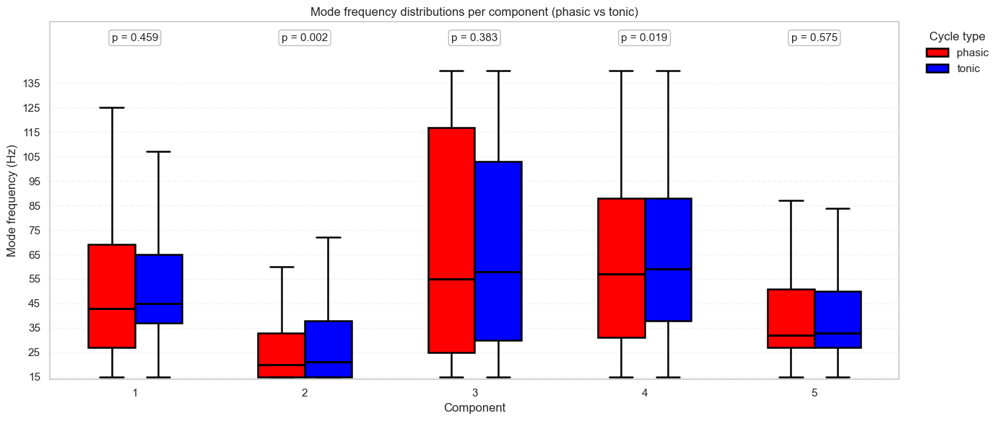

In [147]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind

sns.set_theme(style="whitegrid")
plt.figure(figsize=(14,6))

ax = sns.boxplot(
    data=trials_df,
    x="tSC_component_1based", y="mode_freqs",
    hue="cycle_type",
    palette={"phasic":"red","tonic":"blue"},
    dodge=True, width=0.55, saturation=1,
    whis=1.5, showfliers=False,
    linewidth=1.8,
    boxprops=dict(edgecolor="black"),
    medianprops=dict(color="black", linewidth=2.2),
    whiskerprops=dict(color="black", linewidth=1.8),
    capprops=dict(color="black", linewidth=1.8)
)

y_min = trials_df["mode_freqs"].min()
y_max = trials_df["mode_freqs"].max()
ax.set_ylim(y_min - 1, y_max + 1)
ax.set_yticks(range(15, 141, 10))
ax.set_xlabel("Component")
ax.set_ylabel("Mode frequency (Hz)")
ax.set_title("Mode frequency distributions per component (phasic vs tonic)")
ax.grid(axis="y", linestyle="--", alpha=0.25)
ax.grid(axis="x", visible=False)

# ---------- Welch t-tests per component + BH–FDR (with statsmodels if available) ----------
df = trials_df.dropna(subset=['mode_freqs','tSC_component_1based','cycle_type']).copy()
df['tSC_component_1based'] = df['tSC_component_1based'].astype(int)
components = sorted(df['tSC_component_1based'].unique())

results = []
pvals = []
for c in components:
    phasic = df[(df['tSC_component_1based']==c) & (df['cycle_type'].str.lower()=='phasic')]['mode_freqs'].to_numpy()
    tonic  = df[(df['tSC_component_1based']==c) & (df['cycle_type'].str.lower()=='tonic')]['mode_freqs'].to_numpy()
    if len(phasic) >= 2 and len(tonic) >= 2:
        _, p = ttest_ind(phasic, tonic, equal_var=False, nan_policy='omit')
    else:
        p = np.nan
    results.append({'component': c, 'p_value': p})
    pvals.append(p)

# FDR adjust (try statsmodels; fall back to NumPy BH)
try:
    from statsmodels.stats.multitest import multipletests
    mask = np.isfinite(pvals)
    adj = np.full_like(np.array(pvals, dtype=float), np.nan)
    if np.any(mask):
        _, p_fdr, _, _ = multipletests(np.array(pvals)[mask], method='fdr_bh')
        adj[mask] = p_fdr
except Exception:
    def fdr_bh_adjust(p):
        p = np.asarray(p, dtype=float)
        mask = np.isfinite(p)
        m = mask.sum()
        adj = np.full_like(p, np.nan)
        if m == 0: return adj
        idx = np.where(mask)[0]
        pv  = p[mask]
        order = np.argsort(pv)
        ranks = np.arange(1, len(pv)+1)
        q = pv[order] * m / ranks
        q = np.minimum.accumulate(q[::-1])[::-1]
        adj[idx[order]] = np.clip(q, 0, 1)
        return adj
    adj = fdr_bh_adjust(pvals)

ttest_df = pd.DataFrame(results).sort_values('component')
ttest_df['p_fdr'] = adj

# ---------- Annotate the plot with p-values ----------
use_fdr = False  # set False to show raw p-values instead
p_col   = 'p_fdr' if use_fdr else 'p_value'
p_label = 'FDR p' if use_fdr else 'p'

def fmt_p(p):
    if not (isinstance(p, (float, np.floating)) and np.isfinite(p)):
        return "n/a"
    return f"{p:.1e}" if p < 1e-4 else f"{p:.3f}"

# add headroom
ymin, ymax = ax.get_ylim()
pad = 0.15 * (ymax - ymin)
ax.set_ylim(ymin, ymax + pad)

# map tick labels (components) -> x positions
xticks = ax.get_xticks()
labels = [t.get_text() for t in ax.get_xticklabels()]
def _safe_int(lbl):
    try: return int(float(lbl))
    except: return None
label_to_x = { _safe_int(lbl): x for lbl, x in zip(labels, xticks) if _safe_int(lbl) is not None }

y_text = ymax + pad * 0.55
for _, row in ttest_df.iterrows():
    comp = int(row['component'])
    x = label_to_x.get(comp)
    if x is None:
        continue
    ax.text(
        x, y_text, f"{p_label} = {fmt_p(row[p_col])}",
        ha='center', va='bottom', fontsize=11,
        bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='0.7', alpha=0.85)
    )

ax.legend(title="Cycle type", frameon=False, loc="upper left", bbox_to_anchor=(1.02, 1))
fig = ax.get_figure()
fig.tight_layout()
plt.show()


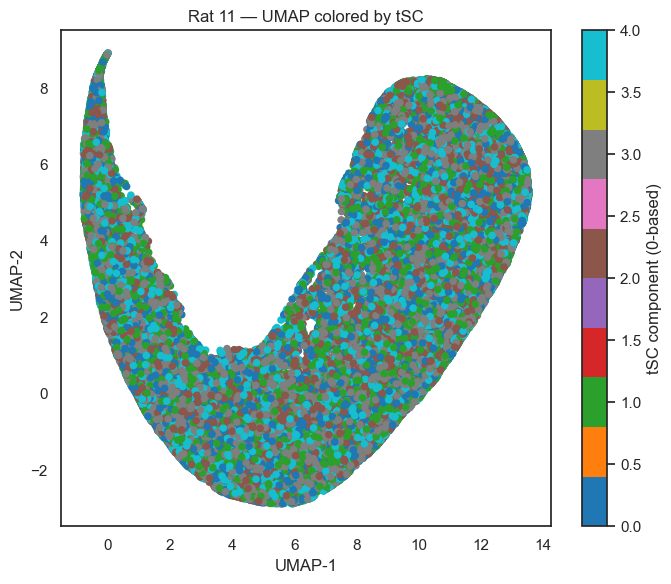

In [67]:
plt.figure(figsize=(7,6))
sc = plt.scatter(
    embedding_rem[:,0], embedding_rem[:,1],
    c=default_trials_df['tSC_component'],
    cmap='tab10', s=20
)
cb = plt.colorbar(sc); cb.set_label('tSC component (0-based)')
plt.title(f'Rat {default_trials_df["rat_id"].iloc[0]} — UMAP colored by tSC')
plt.xlabel('UMAP-1'); plt.ylabel('UMAP-2'); plt.tight_layout(); plt.show()

In [60]:
default_trials_df['tSC_component']

0        0
1        3
2        2
3        0
4        2
        ..
61166    1
61167    4
61168    2
61169    2
61170    4
Name: tSC_component, Length: 61171, dtype: int64

In [58]:
import numpy as np

# ---- helper to recompute a cycle's SSS and component ----
def compute_sss(fpp_2d):
    fpp_abs = np.abs(fpp_2d)
    norm_sum = np.sum(fpp_abs)
    normalized = fpp_abs / norm_sum if norm_sum > 1e-9 else fpp_abs
    signature_1d = np.sum(normalized, axis=1)
    signature_smoothed = np.convolve(signature_1d, np.ones(5)/5, mode='same')
    smin, smax = signature_smoothed.min(), signature_smoothed.max()
    if (smax - smin) > 1e-9:
        signature_final = (signature_smoothed - smin) / (smax - smin)
    else:
        signature_final = np.zeros_like(signature_smoothed)
    return signature_final

def predict_component_from_fpp(fpp_2d, pca_model, ica_model):
    sss = compute_sss(fpp_2d).reshape(1, -1)
    p = pca_model.transform(sss)
    tSCs = ica_model.transform(p)
    return int(np.argmax(np.abs(tSCs), axis=1)[0])  # 0-based component

# ---- indices of rows by cycle type ----
is_phasic = default_trials_df['cycle_type'].str.lower().eq('phasic').to_numpy()
is_tonic  = default_trials_df['cycle_type'].str.lower().eq('tonic').to_numpy()
idx_phasic = np.flatnonzero(is_phasic)
idx_tonic  = np.flatnonzero(is_tonic)

# ---- random spot-check (change n_checks or set to len(...) for exhaustive) ----
rng = np.random.default_rng(0)
n_checks = 50

def check_block(flattened_list, row_indices, which='phasic'):
    sample = rng.choice(len(row_indices), size=min(n_checks, len(row_indices)), replace=False)
    mismatches = []
    for k in sample:
        j = row_indices[k]                   # row index in trials df
        fpp_2d = flattened_list[k]          # k-th flattened FPP
        pred = predict_component_from_fpp(fpp_2d, pca_model, ica_model)
        lab  = int(default_trials_df.loc[j, 'tSC_component'])
        if pred != lab:
            mismatches.append((k, j, pred, lab))
    print(f"{which}: checked {len(sample)} cycles; mismatches: {len(mismatches)}")
    return mismatches

mm_phasic = check_block(flattened_phasic, idx_phasic, 'phasic')
mm_tonic  = check_block(flattened_tonic,  idx_tonic,  'tonic')

phasic: checked 50 cycles; mismatches: 0
tonic: checked 50 cycles; mismatches: 0


In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

n_comp = n_components_pca  # or: int(default_trials_df['tSC_component'].max() + 1)

df_lab = default_trials_df[default_trials_df['tSC_component'] >= 0].copy()

overall_counts = (df_lab['tSC_component']
                  .value_counts()
                  .reindex(range(n_comp), fill_value=0)
                  .sort_index())

overall_pct = (overall_counts / overall_counts.sum() * 100).round(2)

summary_overall = pd.DataFrame({
    'count': overall_counts,
    'pct': overall_pct
})
summary_overall.index = summary_overall.index + 1  # display as tSC 1..K
print(summary_overall)

               count    pct
tSC_component              
1              11179  18.27
2              13157  21.51
3              11893  19.44
4              13005  21.26
5              11937  19.51


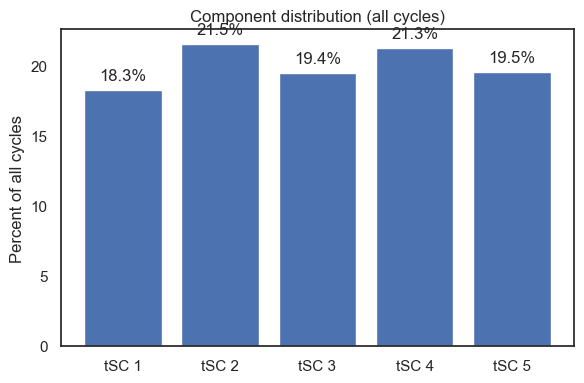

In [62]:
plt.figure(figsize=(6,4))
plt.bar(np.arange(1, n_comp+1), overall_pct.values)
plt.xticks(np.arange(1, n_comp+1), [f'tSC {i}' for i in range(1, n_comp+1)])
for i, v in enumerate(overall_pct.values, start=1):
    plt.text(i, v + 0.5, f'{v:.1f}%', ha='center', va='bottom')
plt.ylabel('Percent of all cycles')
plt.title('Component distribution (all cycles)')
plt.tight_layout()
plt.show()

In [63]:
counts_by_type = (df_lab
    .groupby('cycle_type')['tSC_component']
    .value_counts()
    .unstack(fill_value=0)
    .reindex(columns=range(n_comp), fill_value=0))

pct_by_type = (counts_by_type
    .div(counts_by_type.sum(axis=1), axis=0)
    .mul(100)
    .round(2))

# nice column names for display
pct_by_type.columns = [f'tSC {i}' for i in range(1, n_comp+1)]
print(pct_by_type)

            tSC 1  tSC 2  tSC 3  tSC 4  tSC 5
cycle_type                                   
phasic      21.52  22.11  17.90  20.25  18.21
tonic       18.11  21.48  19.52  21.31  19.58


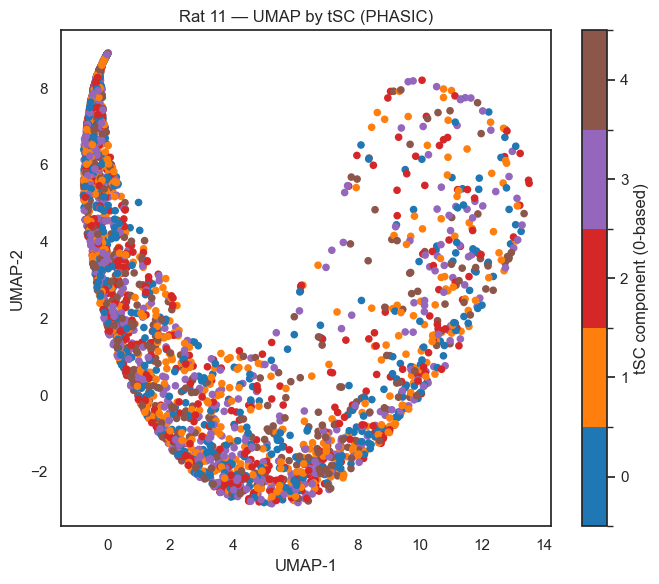

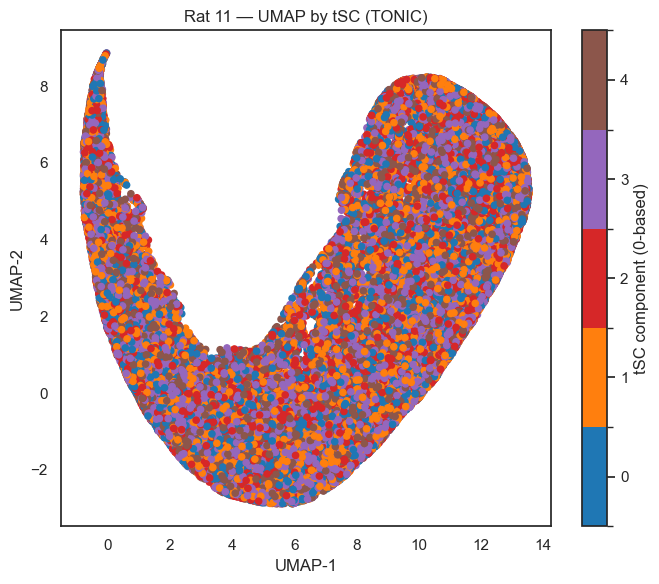

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

# masks
is_phasic = default_trials_df['cycle_type'].str.lower().eq('phasic').to_numpy()
is_tonic  = default_trials_df['cycle_type'].str.lower().eq('tonic').to_numpy()

# number of components (assumes you've already filled tSC_component >= 0)
n_comp = int(default_trials_df['tSC_component'].max()) + 1

# ---- non-green discrete palette (tab10 without green/olive) ----
safe_colors = ['#1f77b4', '#ff7f0e', '#d62728', '#9467bd',
               '#8c564b', '#e377c2', '#7f7f7f', '#17bec7']  # blue, orange, red, purple, brown, pink, gray, cyan
if n_comp > len(safe_colors):
    # if you ever have more comps, extend with colors sampled from 'plasma' (also no green)
    plasma = plt.cm.get_cmap('plasma', n_comp - len(safe_colors))
    safe_colors += [plasma(i) for i in range(plasma.N)]
cmap = ListedColormap(safe_colors[:n_comp])
bounds = np.arange(-0.5, n_comp + 0.5, 1)
norm = BoundaryNorm(bounds, cmap.N)

def plot_subset(mask, title_suffix):
    x = embedding_rem[mask, 0]
    y = embedding_rem[mask, 1]
    labs = default_trials_df.loc[mask, 'tSC_component'].to_numpy()

    plt.figure(figsize=(7, 6))
    sc = plt.scatter(x, y, c=labs, cmap=cmap, norm=norm, s=20)
    cb = plt.colorbar(sc, ticks=np.arange(n_comp))
    cb.set_label('tSC component (0-based)')
    plt.title(f'Rat {default_trials_df["rat_id"].iloc[0]} — UMAP by tSC ({title_suffix})')
    plt.xlabel('UMAP-1'); plt.ylabel('UMAP-2')
    plt.tight_layout()
    plt.show()

# plot separately (each is its own figure with its own colorbar)
plot_subset(is_phasic, 'PHASIC')
plot_subset(is_tonic,  'TONIC')

Computing bin-groups..: Done


Computing overlap:   0%|          | 0/10 [00:00<?, ?it/s]

Computing structure index..: 0.00


Computing shuffling:   0%|          | 0/10 [00:00<?, ?it/s]

Shuffling 99th percentile: 0.00
SI (components -> bins): 0.0031


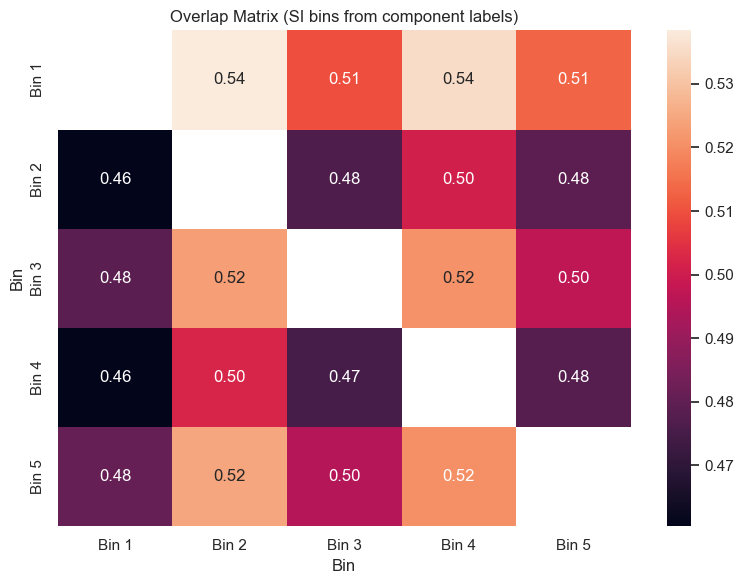

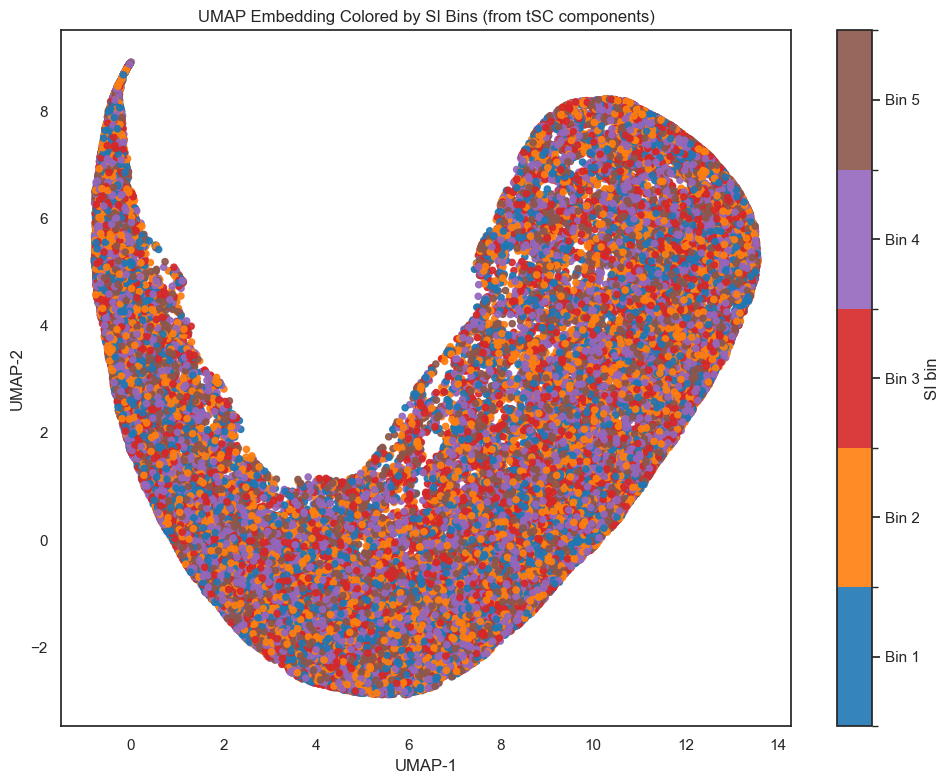

In [77]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm

# 0) Prepare labels & mask (keep only rows that have a component label)
labels_all = default_trials_df['tSC_component'].to_numpy()
valid = labels_all >= 0

X = embedding_rem[valid]
y = labels_all[valid].astype(int)

present = np.sort(np.unique(y))
n_classes = len(present)
assert n_classes > 1, "SI needs at least 2 classes."

# 1) SI params for DISCRETE labels (override your previous continuous settings)
params_bins = params.copy()
params_bins.update({
    'discrete_label': True,             # <-- IMPORTANT
    'n_bins': int(n_classes),           # number of classes
    'n_neighbors': min(n_neighbors, max(1, X.shape[0]-1)),  # clip to subset size
})
SI, binLabel, overlapMat, sSI = compute_structure_index(X, y, **params_bins)

# Normalize binLabel to a 1D array
if isinstance(binLabel, (list, tuple)) and len(binLabel) > 0:
    bin_idx = np.asarray(binLabel[0])
else:
    bin_idx = np.asarray(binLabel)
assert bin_idx.shape[0] == X.shape[0], "binLabel length must match subset size used for SI."

print(f"SI (components -> bins): {SI:.4f}")

# 2) Plot the overlap matrix (optional but handy)
pretty_bins = [f"Bin {i+1}" for i in range(int(bin_idx.max()) + 1)]
plt.figure(figsize=(8, 6))
sns.heatmap(overlapMat, annot=True, fmt=".2f",
            xticklabels=pretty_bins, yticklabels=pretty_bins)
plt.title('Overlap Matrix (SI bins from component labels)')
plt.xlabel('Bin'); plt.ylabel('Bin')
plt.tight_layout(); plt.show()

# 3) Plot the UMAP colored by **SI bins**
#    - Draw all points in light gray for context
#    - Overlay only the valid subset with bin colors
unique_bins = np.unique(bin_idx)
n_bins_used = unique_bins.size

# discrete palette (no green)
base_colors = ['#1f77b4', '#ff7f0e', '#d62728', '#9467bd',
               '#8c564b', '#e377c2', '#7f7f7f', '#17bec7']
if n_bins_used > len(base_colors):
    extra = plt.cm.get_cmap('plasma', n_bins_used - len(base_colors))
    colors = base_colors + [extra(i) for i in range(extra.N)]
else:
    colors = base_colors[:n_bins_used]
cmap = ListedColormap(colors)
bounds = np.arange(-0.5, n_bins_used + 0.5, 1)
norm = BoundaryNorm(bounds, cmap.N)

plt.figure(figsize=(10, 8))
# base cloud in gray
plt.scatter(embedding_rem[:, 0], embedding_rem[:, 1], c='lightgray', s=10, alpha=0.4, label='_nolegend_')
# overlay valid subset with SI bins
sc = plt.scatter(X[:, 0], X[:, 1], c=bin_idx, cmap=cmap, norm=norm, s=20, alpha=0.9)
cb = plt.colorbar(sc, ticks=np.arange(n_bins_used))
cb.set_label('SI bin')
cb.ax.set_yticklabels([f'Bin {int(b)+1}' for b in unique_bins])
plt.title('UMAP Embedding Colored by SI Bins (from tSC components)')
plt.xlabel('UMAP-1'); plt.ylabel('UMAP-2')
plt.tight_layout(); plt.show()

# rat 1

<!-- # rat 1 -->

In [ ]:
# target_rat_id = '1'  # Replace with the desired rat ID
# target_waveforms_df, target_trials_df = extract_data_for_rat(target_rat_id)

In [ ]:
# target_combined_waveforms = target_waveforms_df.drop(columns=['rat_id', 'condition', 'trial', 'cycle_type', 'SD', 'date'])

In [ ]:
# umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
# target_embedding_rem = umap_embedder.fit_transform(target_combined_waveforms.to_numpy())

In [ ]:
# defaul_peaks = np.array(default_trials_df['trough_values'])
# target_peaks = np.array(target_trials_df['trough_values'])

In [ ]:
# new_emb = align_point_cloud(target_embedding_rem, target_peaks, embedding_rem, defaul_peaks,
#                                 n_bins=20,
#                                 n_neighbors=15)

In [ ]:
# plt.subplots(1,2,figsize=(12,4))

# plt.subplot(1,2,1)
# plt.scatter(embedding_rem[:,0], embedding_rem[:,1], c=default_trials_df['trough_values'],
#             vmin=np.percentile(default_trials_df['trough_values'],1),
#             vmax=np.percentile(default_trials_df['trough_values'],99),
#             cmap='hot', s=50)
# # plt.xlim(-2.5, 12)
# plt.colorbar()
# plt.title('ًRat 11')

# plt.subplot(1,2,2)
# plt.scatter(target_embedding_rem[:,0], target_embedding_rem[:,1], c=target_trials_df['trough_values'],
#             vmin=np.percentile(target_trials_df['trough_values'],1),
#             vmax=np.percentile(target_trials_df['trough_values'],99),
#             cmap='hot', s=50)
# # plt.xlim(-2.5, 12)
# plt.colorbar()
# plt.title('Rat 1 - before alignment');

In [ ]:
# plt.subplots(1,2,figsize=(12,4))

# plt.subplot(1,2,1)
# plt.scatter(embedding_rem[:,0], embedding_rem[:,1], c=default_trials_df['trough_values'],
#             vmin=np.percentile(default_trials_df['trough_values'],1),
#             vmax=np.percentile(default_trials_df['trough_values'],99),
#             cmap='hot', s=50)
# # plt.xlim(-2.5, 12)
# plt.colorbar()
# plt.title('Rat 11')

# plt.subplot(1,2,2)
# plt.scatter(new_emb[:,0], new_emb[:,1], c=target_trials_df['trough_values'],
#             vmin=np.percentile(target_trials_df['trough_values'],1),
#             vmax=np.percentile(target_trials_df['trough_values'],99),
#             cmap='hot', s=50)
# # plt.xlim(-2.5, 12)
# plt.colorbar()
# plt.title('Rat 1 - after alignment');

In [ ]:
# plt.subplots(1,2,figsize=(12,4))

# plt.subplot(1,2,1)
# plt.scatter(target_embedding_rem[:,0], target_embedding_rem[:,1], c=target_trials_df['trough_values'],
#             vmin=np.percentile(target_trials_df['trough_values'],1),
#             vmax=np.percentile(target_trials_df['trough_values'],99),
#             cmap='hot', s=50)
# # plt.xlim(-2.5, 12)
# plt.colorbar()
# plt.title('Rat 1 - before alignment');

# plt.subplot(1,2,2)
# plt.scatter(new_emb[:,0], new_emb[:,1], c=target_trials_df['trough_values'],
#             vmin=np.percentile(target_trials_df['trough_values'],1),
#             vmax=np.percentile(target_trials_df['trough_values'],99),
#             cmap='hot', s=50)
# # plt.xlim(-2.5, 12)
# plt.colorbar()
# plt.title('Rat 1 - after alignment');

In [ ]:
# plt.figure(figsize=(6,4))  # Adjusted size for a single plot

# plt.scatter(embedding_rem[:, 0], embedding_rem[:, 1], 
#             c=default_trials_df['peak_values'],
#             vmin=np.percentile(default_trials_df['peak_values'], 1),
#             vmax=np.percentile(default_trials_df['peak_values'], 99),
#             cmap='hot', s=50)

# plt.colorbar()
# plt.title('Rat 11')
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # --- Assume these objects are already defined in your workspace ---
# # default_trials_df: a DataFrame with at least the columns 'cycle_type' and 'peak_values'
# # embedding_rem: a NumPy array of shape (n_samples, 2) (or more) from UMAP embedding
# #
# # For example:
# # default_trials_df['cycle_type'] contains strings 'phasic' or 'tonic'
# # default_trials_df['peak_values'] contains numeric peak values

# # Create boolean masks for each cycle type:
# phasic_mask = (default_trials_df['cycle_type'].to_numpy() == 'phasic')
# tonic_mask  = (default_trials_df['cycle_type'].to_numpy() == 'tonic')

# # Separate the UMAP embedding for phasic and tonic cycles:
# embedding_phasic = embedding_rem[phasic_mask]
# embedding_tonic  = embedding_rem[tonic_mask]

# # Extract the corresponding peak values:
# peak_phasic = default_trials_df.loc[phasic_mask, 'peak_values'].to_numpy()
# peak_tonic  = default_trials_df.loc[tonic_mask, 'peak_values'].to_numpy()

# # Compute global color limits (using, for example, the 1st and 99th percentiles over all cycles)
# vmin = np.percentile(default_trials_df['peak_values'], 1)
# vmax = np.percentile(default_trials_df['peak_values'], 99)

# # --- Create two subplots: one for phasic and one for tonic ---
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# # Subplot 1: Phasic cycles only
# sc1 = ax1.scatter(embedding_phasic[:, 0], embedding_phasic[:, 1],
#                   c=peak_phasic, cmap='hot', s=50,
#                   vmin=vmin, vmax=vmax)
# ax1.set_title('Phasic Cycles')
# ax1.set_xlabel('UMAP Dimension 1')
# ax1.set_ylabel('UMAP Dimension 2')

# # Add a colorbar for the phasic subplot
# cbar1 = plt.colorbar(sc1, ax=ax1)
# cbar1.set_label('Peak Value')

# # Subplot 2: Tonic cycles only
# sc2 = ax2.scatter(embedding_tonic[:, 0], embedding_tonic[:, 1],
#                   c=peak_tonic, cmap='hot', s=50,
#                   vmin=vmin, vmax=vmax)
# ax2.set_title('Tonic Cycles')
# ax2.set_xlabel('UMAP Dimension 1')
# ax2.set_ylabel('UMAP Dimension 2')

# # Add a colorbar for the tonic subplot
# cbar2 = plt.colorbar(sc2, ax=ax2)
# cbar2.set_label('Peak Value')

# plt.tight_layout()
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # --- Assume these objects are already defined in your workspace ---
# # default_trials_df: a DataFrame with at least the columns 'cycle_type' and 'peak_values'
# # embedding_rem: a NumPy array of shape (n_samples, 2) (or more) from UMAP embedding
# #
# # For example:
# # default_trials_df['cycle_type'] contains strings 'phasic' or 'tonic'
# # default_trials_df['peak_values'] contains numeric peak values

# # Create boolean masks for each cycle type:
# phasic_mask = (default_trials_df['cycle_type'].to_numpy() == 'phasic')
# tonic_mask  = (default_trials_df['cycle_type'].to_numpy() == 'tonic')

# # Separate the UMAP embedding for phasic and tonic cycles:
# embedding_phasic = embedding_rem[phasic_mask]
# embedding_tonic  = embedding_rem[tonic_mask]

# # Extract the corresponding peak values:
# peak_phasic = default_trials_df.loc[phasic_mask, 'mode_freqs'].to_numpy()
# peak_tonic  = default_trials_df.loc[tonic_mask, 'mode_freqs'].to_numpy()

# # Compute global color limits (using, for example, the 1st and 99th percentiles over all cycles)
# vmin = np.percentile(default_trials_df['mode_freqs'], 1)
# vmax = np.percentile(default_trials_df['mode_freqs'], 99)

# # --- Create two subplots: one for phasic and one for tonic ---
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# # Subplot 1: Phasic cycles only
# sc1 = ax1.scatter(embedding_phasic[:, 0], embedding_phasic[:, 1],
#                   c=peak_phasic, cmap='hot', s=50,
#                   vmin=vmin, vmax=vmax)
# ax1.set_title('Phasic Cycles')
# ax1.set_xlabel('UMAP Dimension 1')
# ax1.set_ylabel('UMAP Dimension 2')

# # Add a colorbar for the phasic subplot
# cbar1 = plt.colorbar(sc1, ax=ax1)
# cbar1.set_label('Mode Frequency')

# # Subplot 2: Tonic cycles only
# sc2 = ax2.scatter(embedding_tonic[:, 0], embedding_tonic[:, 1],
#                   c=peak_tonic, cmap='hot', s=50,
#                   vmin=vmin, vmax=vmax)
# ax2.set_title('Tonic Cycles')
# ax2.set_xlabel('UMAP Dimension 1')
# ax2.set_ylabel('UMAP Dimension 2')

# # Add a colorbar for the tonic subplot
# cbar2 = plt.colorbar(sc2, ax=ax2)
# cbar2.set_label('Mode Frequency')

# plt.tight_layout()
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # --- Assume these objects are already defined in your workspace ---
# # default_trials_df: a DataFrame with at least the columns 'cycle_type' and 'peak_values'
# # embedding_rem: a NumPy array of shape (n_samples, 2) (or more) from UMAP embedding
# #
# # For example:
# # default_trials_df['cycle_type'] contains strings 'phasic' or 'tonic'
# # default_trials_df['peak_values'] contains numeric peak values

# # Create boolean masks for each cycle type:
# phasic_mask = (default_trials_df['cycle_type'].to_numpy() == 'phasic')
# tonic_mask  = (default_trials_df['cycle_type'].to_numpy() == 'tonic')

# # Separate the UMAP embedding for phasic and tonic cycles:
# embedding_phasic = embedding_rem[phasic_mask]
# embedding_tonic  = embedding_rem[tonic_mask]

# # Extract the corresponding peak values:
# peak_phasic = default_trials_df.loc[phasic_mask, 'peak_values'].to_numpy()
# peak_tonic  = default_trials_df.loc[tonic_mask, 'peak_values'].to_numpy()

# # Compute global color limits (using, for example, the 1st and 99th percentiles over all cycles)
# vmin = np.percentile(default_trials_df['peak_values'], 1)
# vmax = np.percentile(default_trials_df['peak_values'], 99)

# # --- Create two subplots: one for phasic and one for tonic ---
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# # Subplot 1: Phasic cycles only
# sc1 = ax1.scatter(embedding_phasic[:, 0], embedding_phasic[:, 2],
#                   c=peak_phasic, cmap='Reds', s=50,
#                   vmin=vmin, vmax=vmax)
# ax1.set_title('Phasic Cycles')
# ax1.set_xlabel('UMAP Dimension 1')
# ax1.set_ylabel('UMAP Dimension 3')

# # Add a colorbar for the phasic subplot
# cbar1 = plt.colorbar(sc1, ax=ax1)
# cbar1.set_label('Peak Value')

# # Subplot 2: Tonic cycles only
# sc2 = ax2.scatter(embedding_tonic[:, 0], embedding_tonic[:, 2],
#                   c=peak_tonic, cmap='Blues', s=50,
#                   vmin=vmin, vmax=vmax)
# ax2.set_title('Tonic Cycles')
# ax2.set_xlabel('UMAP Dimension 1')
# ax2.set_ylabel('UMAP Dimension 3')

# # Add a colorbar for the tonic subplot
# cbar2 = plt.colorbar(sc2, ax=ax2)
# cbar2.set_label('Peak Value')

# plt.tight_layout()
# plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # --- Assume these objects are already defined in your workspace ---
# # default_trials_df: a DataFrame with at least the columns 'cycle_type' and 'peak_values'
# # embedding_rem: a NumPy array of shape (n_samples, 2) (or more) from UMAP embedding
# #
# # For example:
# # default_trials_df['cycle_type'] contains strings 'phasic' or 'tonic'
# # default_trials_df['peak_values'] contains numeric peak values

# # Create boolean masks for each cycle type:
# phasic_mask = (default_trials_df['cycle_type'].to_numpy() == 'phasic')
# tonic_mask  = (default_trials_df['cycle_type'].to_numpy() == 'tonic')

# # Separate the UMAP embedding for phasic and tonic cycles:
# embedding_phasic = embedding_rem[phasic_mask]
# embedding_tonic  = embedding_rem[tonic_mask]

# # Extract the corresponding peak values:
# peak_phasic = default_trials_df.loc[phasic_mask, 'peak_values'].to_numpy()
# peak_tonic  = default_trials_df.loc[tonic_mask, 'peak_values'].to_numpy()

# # Compute global color limits (using, for example, the 1st and 99th percentiles over all cycles)
# vmin = np.percentile(default_trials_df['peak_values'], 1)
# vmax = np.percentile(default_trials_df['peak_values'], 99)

# # --- Create two subplots: one for phasic and one for tonic ---
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# # Subplot 1: Phasic cycles only
# sc1 = ax1.scatter(embedding_phasic[:, 1], embedding_phasic[:, 2],
#                   c=peak_phasic, cmap='Reds', s=50,
#                   vmin=vmin, vmax=vmax)
# ax1.set_title('Phasic Cycles')
# ax1.set_xlabel('UMAP Dimension 2')
# ax1.set_ylabel('UMAP Dimension 3')

# # Add a colorbar for the phasic subplot
# cbar1 = plt.colorbar(sc1, ax=ax1)
# cbar1.set_label('Peak Value')

# # Subplot 2: Tonic cycles only
# sc2 = ax2.scatter(embedding_tonic[:, 1], embedding_tonic[:, 2],
#                   c=peak_tonic, cmap='Blues', s=50,
#                   vmin=vmin, vmax=vmax)
# ax2.set_title('Tonic Cycles')
# ax2.set_xlabel('UMAP Dimension 2')
# ax2.set_ylabel('UMAP Dimension 3')

# # Add a colorbar for the tonic subplot
# cbar2 = plt.colorbar(sc2, ax=ax2)
# cbar2.set_label('Peak Value')

# plt.tight_layout()
# plt.show()

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from mpl_toolkits.axes_grid1 import make_axes_locatable

# # --- Assume these objects are already defined in your workspace ---
# # default_trials_df: DataFrame with columns 'cycle_type' and 'peak_values'
# # embedding_rem: NumPy array (n_samples x n_dimensions) from UMAP embedding

# # For 2D plotting, take only the first two columns if embedding_rem has >2 dimensions:
# embedding_rem_2d = embedding_rem[:, :2]

# # Create boolean masks for each cycle type:
# phasic_mask = (default_trials_df['cycle_type'].to_numpy() == 'phasic')
# tonic_mask  = (default_trials_df['cycle_type'].to_numpy() == 'tonic')

# # Separate the UMAP embeddings for phasic and tonic cycles:
# embedding_phasic = embedding_rem_2d[phasic_mask]
# embedding_tonic  = embedding_rem_2d[tonic_mask]

# # Extract the corresponding peak values:
# peak_phasic = default_trials_df.loc[phasic_mask, 'peak_values'].to_numpy()
# peak_tonic  = default_trials_df.loc[tonic_mask, 'peak_values'].to_numpy()

# # --- Create one plot with both tonic and phasic cycles ---
# fig, ax = plt.subplots(figsize=(8, 6))

# # First, plot tonic cycles (using "Blues" and a distinct marker, e.g. triangles).
# sc_tonic = ax.scatter(embedding_tonic[:, 0], embedding_tonic[:, 1],
#                       c=peak_tonic, cmap='Blues', s=50, marker='o', 
#                       vmin=vmin, vmax=vmax, label='Tonic')

# # Then, plot phasic cycles on top (using "hot" and a different marker, e.g. circles).
# sc_phasic = ax.scatter(embedding_phasic[:, 0], embedding_phasic[:, 1],
#                        c=peak_phasic, cmap='Oranges', s=50, marker='X', edgecolor='black',
#                        vmin=vmin, vmax=vmax, label='Phasic')

# ax.set_xlabel('UMAP Dimension 1')
# ax.set_ylabel('UMAP Dimension 2')
# ax.set_title('UMAP Projection: Phasic vs. Tonic Cycles\nColored by Peak Value')
# ax.legend()

# # Create two separate colorbars using an axes divider.
# divider = make_axes_locatable(ax)
# # Colorbar for tonic cycles (placed to the right)
# cax_tonic = divider.append_axes("right", size="5%", pad=0.05)
# cbar_tonic = plt.colorbar(sc_tonic, cax=cax_tonic)
# cbar_tonic.set_label('Peak Value (Tonic)')

# # Colorbar for phasic cycles; shift it further to avoid overlap.
# cax_phasic = divider.append_axes("right", size="5%", pad=0.7)
# cbar_phasic = plt.colorbar(sc_phasic, cax=cax_phasic)
# cbar_phasic.set_label('Peak Value (Phasic)')

# plt.tight_layout()
# plt.show()

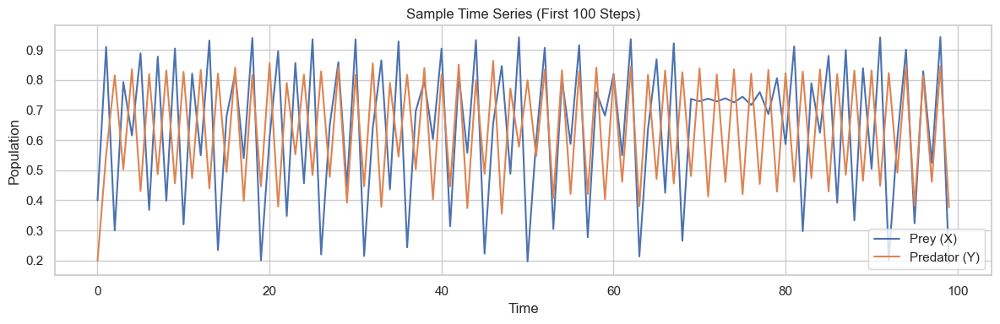

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Define the nonlinear predator-prey system
def func(A, B, r, beta):
    return A * (r - r * A - beta * B)

# Parameters
r_x = 3.8
r_y = 3.5
beta_xy = 0.02  # Effect of predator (Y) on prey (X) — weak
beta_yx = 0.1   # Effect of prey (X) on predator (Y) — strong

# Initial values
X0 = 0.4
Y0 = 0.2
T = 5000

# Simulate time series
X = [X0]
Y = [Y0]
for _ in range(T):
    X_next = func(X[-1], Y[-1], r_x, beta_xy)
    Y_next = func(Y[-1], X[-1], r_y, beta_yx)
    X.append(X_next)
    Y.append(Y_next)

X = np.array(X)
Y = np.array(Y)

# Plot a sample of the time series
plt.figure(figsize=(12, 4))
plt.plot(X[:100], label='Prey (X)')
plt.plot(Y[:100], label='Predator (Y)')
plt.title('Sample Time Series (First 100 Steps)')
plt.xlabel('Time')
plt.ylabel('Population')
plt.legend()
plt.tight_layout()
plt.show()

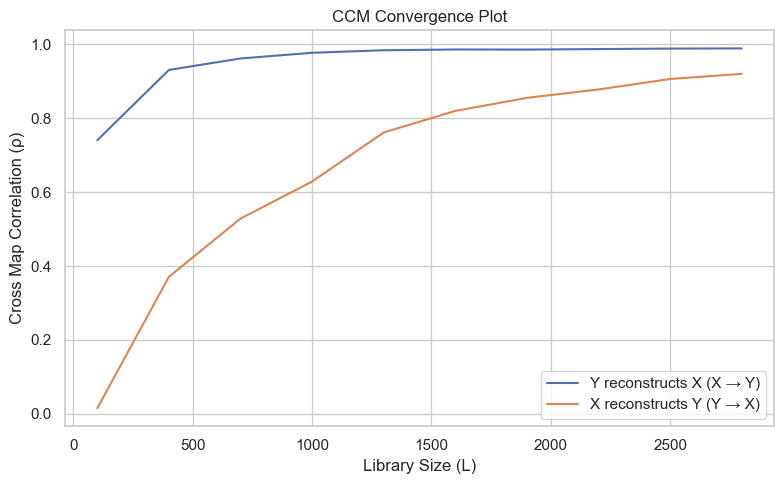

In [34]:
from scipy.spatial import distance

# Helper functions for CCM

def build_shadow_manifold(series, E=2, tau=1):
    """Create the shadow manifold for a given time series."""
    M = []
    for t in range((E - 1) * tau, len(series)):
        M.append([series[t - i * tau] for i in range(E)])
    return np.array(M), list(range((E - 1) * tau, len(series)))

def predict_from_manifold(M_source, M_target, target_series, library_size):
    """Predict target_series using cross mapping from M_source to M_target."""
    true_vals = []
    pred_vals = []
    
    for i in range(library_size):
        target_idx = i
        source_point = M_source[target_idx]
        distances = distance.cdist([source_point], M_source)[0]
        
        # Exclude the point itself
        neighbor_indices = np.argsort(distances)[1:4]  # E+1 = 3 for E=2
        neighbor_distances = distances[neighbor_indices]
        weights = np.exp(-neighbor_distances / (neighbor_distances[0] + 1e-10))
        weights /= np.sum(weights)
        
        estimate = np.sum(weights * target_series[np.array(neighbor_indices)])
        
        true_vals.append(target_series[target_idx])
        pred_vals.append(estimate)

    return pearsonr(true_vals, pred_vals)[0]

# Build shadow manifolds
E = 2
tau = 1
L_values = np.arange(100, 3100, 300)

Mx, idx_x = build_shadow_manifold(X, E, tau)
My, idx_y = build_shadow_manifold(Y, E, tau)

# Align series with manifolds
X_aligned = X[idx_x]
Y_aligned = Y[idx_y]

# Ensure equal length
min_len = min(len(Mx), len(My))
Mx = Mx[:min_len]
My = My[:min_len]
X_aligned = X_aligned[:min_len]
Y_aligned = Y_aligned[:min_len]

# Compute CCM correlations over increasing L
ccm_X_to_Y = []
ccm_Y_to_X = []

for L in L_values:
    r_XY = predict_from_manifold(My[:L], Mx[:L], X_aligned[:L], L)
    r_YX = predict_from_manifold(Mx[:L], My[:L], Y_aligned[:L], L)
    ccm_X_to_Y.append(r_XY)
    ccm_Y_to_X.append(r_YX)

# Plot convergence
plt.figure(figsize=(8, 5))
plt.plot(L_values, ccm_X_to_Y, label='Y reconstructs X (X → Y)')
plt.plot(L_values, ccm_Y_to_X, label='X reconstructs Y (Y → X)')
plt.xlabel('Library Size (L)')
plt.ylabel('Cross Map Correlation (ρ)')
plt.title('CCM Convergence Plot')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()